# Import Libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
sns.set(style="whitegrid")
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

# For other libraries, I will import as necessary.

# Import Data

In [2]:
df0 = pd.read_csv("heart_modeling_final")

In [3]:
df0.shape   # Check dimension

(157920, 84)

Since I left joined icd9_codes, I have many null icd9_codes. I'll get rid of all those null values. 

In [4]:
df0.sample(5)    # Checking df. 

,subject_id,hadm_id,admittime,dischtime,readmitted_30d,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code
8418,25545,144151,2198-06-02 04:31:00,2198-06-04 11:45:00,0,0,M,WHITE,Private,NEWBORN,7,PHYS REFERRAL/NORMAL DELI,HOME,2,1,0,NaN,NaN,NaN,NaN,NaN,NaN,140.0,140.0,140.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,20.7,20.7,20.700000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
124901,8210,160281,2148-04-24 12:12:00,2148-05-04 12:10:00,0,79,M,WHITE,Medicare,EMERGENCY,4,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,10,1,0,NaN,NaN,NaN,NaN,NaN,NaN,66.0,103.0,81.873016,7.0,38.0,19.429412,90.0,100.0,96.860697,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.6,1.5,0.884615,20.0,77.0,39.230769,11.0,18.0,14.846154,9.0,12.1,10.825000,27.0,23.384615,116.0,107.538462,2.6,2.190909,8.8,8.150000,2.8,4.7,3.800000,3.1,3.100000,3.1,2.525000,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4019.0
19925,32456,147813,2123-07-15 21:14:00,2123-07-23 15:38:00,0,88,F,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,8,1,0,82.0,132.0,103.917808,40.0,84.0,48.246575,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.9,99.2,97.688235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.3,1.080000,34.0,41.0,38.333333,11.0,18.0,13.666667,8.7,12.7,10.880000,27.0,23.000000,111.0,106.666667,2.5,2.337500,8.8,8.287500,3.8,4.5,4.233333,NaN,NaN,3.9,3.037500,1.1,1.100000,1.0,0.0,1.0,1.0,1.0,0.0,0.0,NaN,NaN,NaN,NaN,41401.0
150853,16789,126298,2187-09-18 14:00:00,2187-11-08 12:50:00,0,83,F,OTHER,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,LEFT AGAINST MEDICAL ADVI,51,1,0,NaN,NaN,NaN,NaN,NaN,NaN,58.0,121.0,84.671373,0.0,52.0,23.951600,53.0,100.0,98.342517,NaN,NaN,NaN,202.0,495.0,383.75,NaN,NaN,NaN,NaN,NaN,NaN,0.7,5.2,2.096667,14.0,127.0,57.836066,13.0,22.0,16.326087,7.1,12.6,10.263636,33.0,23.826923,113.0,105.555556,3.2,2.267857,9.9,8.358974,3.5,5.6,4.260377,3.7,2.933333,5.7,3.975556,4.6,2.133333,1.0,1.0,1.0,1.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,4241.0
24782,51676,178480,2104-01-07 23:18:00,2104-01-18 15:00:00,0,85,M,WHITE,Medicare,EMERGENCY,2,TRANSFER FROM HOSP/EXTRAM,SNF,11,1,0,83.0,129.0,105.588235,36.0,65.0,51.352941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.4,99.4,97.800000,684.0,684.0,684.00,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.7,1.365000,28.0,71.0,43.000000,7.0,15.0,12.000000,8.0,12.9,11.087500,31.0,24.937500,118.0,110.739130,3.1,2.450000,10.5,8.250000,3.7,4.4,4.121739,3.6,3.600000,4.5,3.466667,1.7,1.357143,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,42731.0


Noticed some of the icd9_code columns don't have icd9 codes. I will just drop them. 

In [5]:
df0 = df0.dropna(subset=['icd9_code'])

In [6]:
df0.shape    # Dimension after getting rid of null in icd9_codes column.

(142484, 84)

The rows are now consistent with the cardio-vascular icd9_codes. 

In [7]:
# Check target percentage 
df0['readmitted_30d'].value_counts()/len(df0)*100     

readmitted_30d
0    92.957104
1     7.042896
Name: count, dtype: float64

In [8]:
df0.head()

,subject_id,hadm_id,admittime,dischtime,readmitted_30d,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code
1,65535,178280,2193-05-22 08:00:00,2193-06-01 14:29:00,0,67,F,WHITE,Medicare,ELECTIVE,4,PHYS REFERRAL/NORMAL DELI,SNF,10,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3962.0
3,22931,196469,2195-02-23 07:15:00,2195-02-27 15:13:00,0,63,M,WHITE,Private,ELECTIVE,2,PHYS REFERRAL/NORMAL DELI,HOME,4,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4239.0
4,16819,182030,2112-03-03 23:12:00,2112-03-07 14:31:00,0,77,F,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,4,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3962.0
5,6451,119201,2164-08-27 18:51:00,2164-09-01 12:18:00,1,65,M,WHITE,Private,URGENT,2,PHYS REFERRAL/NORMAL DELI,HOME,5,0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,1.0,0.9,9.0,13.0,10.6,12.0,17.0,15.0,13.3,16.4,14.64,26.0,23.2,108.0,104.0,1.9,1.66,8.1,8.1,3.3,4.7,3.9,NaN,NaN,1.9,1.9,2.4,2.4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4421.0
7,9261,106934,2156-03-29 12:53:00,2156-04-01 16:39:00,0,34,M,UNKNOWN/NOT SPECIFIED,Private,URGENT,2,TRANSFER FROM HOSP/EXTRAM,HOME,3,1,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41401.0


# Data Preprocessing

In [9]:
df1 = df0.copy()  # Copy df

In [10]:
# Check if multiple icd9_code exists per admission?

# Count number of unique ICD-9 codes per hadm_id
icd_counts = df1.groupby('hadm_id')['icd9_code'].nunique().reset_index(name='num_icd9_codes')

# Filter hadm_id with more than 1 ICD-9 code
multiple_icd9 = icd_counts[icd_counts['num_icd9_codes'] > 1]

# View top few
print(multiple_icd9.head())

   hadm_id  num_icd9_codes
0   100001               2
1   100003               2
3   100009               7
4   100012               3
6   100018               9


In [11]:
df1['hadm_id'].nunique()  # Check unique hospital admission

43540

## Convert ICD-9 Codes into Categories

In [12]:
# The way icd9_code column is created is it only takes first three digits.

# Make sure icd9_code is a string
df1['icd9_code'] = df1['icd9_code'].astype(str)

# Extract first 3 digits
df1['icd9_3digit'] = df1['icd9_code'].str.slice(0, 3)

# Map to broader cardiovascular categories
def map_heart_category(code):
    try:
        code = int(code)
    except:
        return 'Other'

    if 390 <= code <= 398:
        return 'Rheumatic Heart Disease'
    elif 401 <= code <= 405:
        return 'Hypertensive Disease'
    elif 410 <= code <= 414:
        return 'Ischemic Heart Disease'
    elif 415 <= code <= 417:
        return 'Pulmonary Circulation Disease'
    elif 420 <= code <= 429:
        return 'Other Heart Disease'
    elif 430 <= code <= 438:
        return 'Cerebrovascular Disease'
    elif 440 <= code <= 449:
        return 'Arterial Disease'
    elif 451 <= code <= 459:
        return 'Venous/Circulatory Disease'
    elif 745 <= code <= 747:
        return 'Congenital Circulatory Anomalies'
    else:
        return 'Other'

# Apply mapping
df1['cvd_category'] = df1['icd9_3digit'].apply(map_heart_category)

In [13]:
df1.sort_values(by=['subject_id', 'hadm_id', 'admittime']).head(20)

,subject_id,hadm_id,admittime,dischtime,readmitted_30d,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code,icd9_3digit,cvd_category
103003,3,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,0,76,M,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41071.0,410,Ischemic Heart Disease
103004,3,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,0,76,M,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4280.0,428,Other Heart Disease
103005,3,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,0,76,M,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4254.0,425,Other Heart Disease
103006,3,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,0,76,M,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4275.0,427,Other Heart Disease
86115,6,107064,2175-05-30 07:15:00,2175-06-15 16:00:00,0,66,F,WHITE,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.235294,8.4,12.5,10.421053,21.0,17.941176,110.0,105.117647,3.3,2.392308,8.6,7.653846,4.4,5.5,4.911765,3.1,2.875,8.5,4.392857,3.9,2.640000,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4440.0,444,Arterial Disease
86116,6,107064,2175-05-30 07:15:00,2175-06-15 16:00:00,0,66,F,WHITE,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.

I noticed that one hospital admission has more than one ICD-9 codes. ICD-9 codes have a hierarchical structure. Therefore, I want to generalize to a higher-level category or prioritize codes related to the disease relevance to my analysis (e.g., cardiovascular, respiratory). For this, I want to select them based on the hierarchy (priority). For each admission, I will iterate through the ICD-9 codes and convert them to categories, and pick the code corresponding to the highest-priority category present.

## Define Category Ranking

In [14]:
# Adjust these ranks based on the clinical judgment and analysis goals.
# Lower number means higher priority.
category_rank = {
    'Ischemic Heart Disease': 1,
    'Cerebrovascular Disease': 2,
    'Pulmonary Circulation Disease': 3,
    'Hypertensive Disease': 4,
    'Other Heart Disease': 5,
    'Rheumatic Heart Disease': 6,
    'Arterial Disease': 7,
    'Venous/Circulatory Disease': 8,
    'Congenital Circulatory Anomalies': 9,
    'Other': 10 # Lowest priority for the catch-all
}

In [15]:
# Ensure admittime and dischtime are datetime objects if needed for other ops
df1['admittime'] = pd.to_datetime(df1['admittime'])
df1['dischtime'] = pd.to_datetime(df1['dischtime'])

print("Original DataFrame with 'cvd_category':")
print(df1.head())
print("-" * 30)

# Create a 'category_priority' column based on the defined priority mapping
df1['category_priority'] = df1['cvd_category'].map(category_rank)

# Error check for categories not in your rank map (if any slipped through your categorization)
if df1['category_priority'].isnull().any():
    missing_categories = df1.loc[df1['category_priority'].isnull(), 'cvd_category'].unique()
    print(f"\nWARNING: Some 'cvd_category' values were not found in 'category_rank' map: {missing_categories}")
    print("These will result in NaN priorities and might affect selection. Ensure all categories are mapped.")

print("DataFrame with 'category_priority':")
print(df1)
print("-" * 30)

Original DataFrame with 'cvd_category':
   subject_id  hadm_id           admittime           dischtime  \
1       65535   178280 2193-05-22 08:00:00 2193-06-01 14:29:00   
3       22931   196469 2195-02-23 07:15:00 2195-02-27 15:13:00   
4       16819   182030 2112-03-03 23:12:00 2112-03-07 14:31:00   
5        6451   119201 2164-08-27 18:51:00 2164-09-01 12:18:00   
7        9261   106934 2156-03-29 12:53:00 2156-04-01 16:39:00   

   readmitted_30d  age gender              ethnicity insurance admission_type  \
1               0   67      F                  WHITE  Medicare       ELECTIVE   
3               0   63      M                  WHITE   Private       ELECTIVE   
4               0   77      F                  WHITE  Medicare      EMERGENCY   
5               1   65      M                  WHITE   Private         URGENT   
7               0   34      M  UNKNOWN/NOT SPECIFIED   Private         URGENT   

   admission_day_of_week         admission_location discharge_location  \
1 

In [16]:
# Sort by admission identifiers, then by priority, and then by original ICD-9 code for tie-breaking.
# The 'icd9_code' sort provides a deterministic tie-breaker if two different codes within the same admission
# fall into categories with the exact same highest priority.
df1 = df1.sort_values(
    by=['hadm_id', 'admittime', 'dischtime', 'category_priority', 'icd9_code'],
    ascending=[True, True, True, True, True] # True for ascending priority (lower rank = higher priority)
) \
.groupby(['hadm_id', 'admittime', 'dischtime']) \
.first()

In [17]:
df1.shape

(43540, 84)

In [18]:
df1 = df1.sort_values(by=['subject_id', 'hadm_id', 'admittime']).reset_index() 

In [19]:
df1['readmitted_30d'].value_counts()/len(df1)*100

readmitted_30d
0    93.465779
1     6.534221
Name: count, dtype: float64

## Kaplan Myer Curve

I thought about this analysis during the later part of my analysis with this project. For this, I need to create a column for time to event data in order to perform Kaplan-Myer analysis. For each patient, I need the number of days until readmission (if readmitted) or the number of days they were observed (if not readmitted). To create time to event column, it is important to consider two senarios: 1)If the patient was readmitted within 30 days (readmitted_30d == 1), The time_to_event is the duration from their dischtime to their next admittime (the readmission). 2) If the patient was NOT readmitted within 30 days (readmitted_30d == 0), The time_to_event is the maximum observation period for this study, which is 30 days from their dischtime. This is a "censored" observation in survival analysis terms. This analysis requires identifying the next admission for each patient.

In [20]:
# Sort the DataFrame to correctly identify next admissions 
# This is crucial for groupby().shift() to work correctly.
df1 = df1.sort_values(by=['subject_id', 'admittime'])

In [21]:
# Get the next admission time for each subject
# We group by subject_id and then use shift(-1) to get the next row's admittime.
df1['next_admittime'] = df1.groupby('subject_id')['admittime'].shift(-1)

In [22]:
# Calculate time difference to next admission (if applicable)
# This is the potential time to readmission.
df1['time_diff_to_next_adm'] = (
    df1['next_admittime'] - df1['dischtime']
).dt.days # Convert timedelta to days

In [23]:
df1['time_diff_to_next_adm'].describe()

count    10178.000000
mean       417.328355
std        640.058256
min        -19.000000
25%         28.000000
50%        130.500000
75%        521.750000
max       4107.000000
Name: time_diff_to_next_adm, dtype: float64

The describe function shows that some values are negative, which is odd. I will check this. While I also see some of the values are more than 30 days, which suggest that some people are readmitted after 30 days. However, for my analysis, I am mostly interested in looking at first 30 days readmission. 

In [24]:
df1[df1['time_diff_to_next_adm'] < 0]    # Check how many rows are less than zero. 

,hadm_id,admittime,dischtime,subject_id,readmitted_30d,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code,icd9_3digit,cvd_category,category_priority,next_admittime,time_diff_to_next_adm
4340,119872,2185-11-14 08:36:00,2185-12-21 18:15:00,5246,0,74,M,BLACK/AFRICAN AMERICAN,Medicare,EMERGENCY,2,EMERGENCY ROOM ADMIT,SNF,37,1,0,NaN,NaN,NaN,NaN,NaN,NaN,49.0,143.0,73.771562,9.0,41.0,18.576832,67.0,100.0,96.737705,NaN,NaN,NaN,198.0,198.0,198.0,NaN,NaN,NaN,NaN,NaN,NaN,0.6,0.9,0.720833,6.0,21.0,11.041667,7.0,14.0,10.291667,5.4,11.1,9.633333,42.0,34.708333,110.0,103.583333,2.3,1.98,8.9,8.185,3.1,4.1,3.548,3.3,2.866667,3.7,2.752174,1.3,1.025,1.0,1.0,1.0,1.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,41071.0,410,Ischemic Heart Disease,1,2185-12-02 23:53:00,-19.0


A negative time difference means next_admittime is before dischtime. This might be a data quality issue. It could be due to incorrect admittime/dischtime entries in your raw data or error in sorting. Since it is just one row, it is less likely due to sorting issue. To fix this, I will just remove this entry.

In [25]:
df1.drop(4340, inplace=True)

In [26]:
check = df1[((df1['time_diff_to_next_adm'] >30) & (df1['readmitted_30d']==1))]    # Looks like df are not correct as these two dont match.

In [27]:
check.head()

,hadm_id,admittime,dischtime,subject_id,readmitted_30d,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code,icd9_3digit,cvd_category,category_priority,next_admittime,time_diff_to_next_adm
572,193607,2116-08-03 10:47:00,2116-08-06 13:55:00,634,1,63,M,OTHER,Private,EMERGENCY,2,EMERGENCY ROOM ADMIT,HOME,3,1,1,NaN,NaN,NaN,NaN,NaN,NaN,64.0,100.0,79.285714,11.0,27.0,19.400000,93.0,99.0,96.942857,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,3.4,3.133333,47.0,59.0,52.166667,12.0,15.0,13.666667,8.6,11.4,10.466667,18.0,16.833333,109.0,106.500000,2.3,2.050000,8.3,7.666667,4.4,8.8,5.528571,NaN,NaN,5.1,4.550000,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4019.0,401,Hypertensive Disease,4,2116-10-30 21:05:00,85.0
1275,177940,2141-01-01 23:34:00,2141-01-05 16:58:00,1478,1,51,F,WHITE,Private,EMERGENCY,1,EMERGENCY ROOM ADMIT,HOME,4,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,102.0,86.697674,9.0,28.0,18.461538,97.0,100.0,98.900000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5,0.6,0.566667,11.0,14.0,12.333333,14.0,18.0,15.666667,11.7,12.2,11.966667,29.0,27.333333,102.0,100.666667,1.9,1.900000,9.2,9.150000,3.2,4.4,3.800000,NaN,NaN,2.7,2.400000,NaN,NaN,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4019.0,401,Hypertensive Disease,4,2142-09-17 21:20:00,620.0
6212,168872,2104-11-26 12:07:00,2104-12-08 16:20:00,7478,1,76,F,WHITE,Medicare,EMERGENCY,4,EMERGENCY ROOM ADMIT,REHAB/DISTINCT PART HOSP,12,1,0,NaN,NaN,NaN,NaN,NaN,NaN,69.0,97.0,79.000000,4.0,20.0,9.869565,96.0,100.0,98.565217,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.5,1.3,0.728571,17.0,33.0,24.285714,9.0,19.0,12.500000,9.1,12.5,10.808333,31.0,26.285714,111.0,103.785714,2.0,1.780000,8.4,7.750000,2.7,4.3,3.673333,1.9,1.8,4.4,3.642857,2.2,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4019.0,401,Hypertensive Disease,4,2106-02-16 04:27:00,434.0
6390,166189,2166-05-30 18:37:00,2166-06-06 15:25:00,7681,1,49,M,HISPANIC OR LATINO,Medicaid,EMERGENCY,6,EMERGENCY ROOM ADMIT,HOME,7,1,1,NaN,NaN,NaN,NaN,NaN,NaN,63.0,106.0,83.981132,10.0,26.0,18.470588,95.0,100.0,98.000000,NaN,NaN,NaN,221.0,221.0,221.0,NaN,NaN,NaN,NaN,NaN,NaN,0.5,0.6,0.542857,5.0,12.0,6.571429,7.0,11.0,8.428571,10.0,12.0,11.185714,26.0,24.714286,110.0,105.714286,1.6,1.450000,7.4,7.300000,3.4,4.3,3.700000,2.2,2.2,4.1,2.600000,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4568.0,456,Venous/Circulatory Disease,8,2167-01-05 13:38:00,212.0
6511,117262,2136-08-20 10:50:00,2136-08-29 14:30:00,7809,1,58,F,BLACK/AFRICAN AMERICAN,Medicaid,EMERGENCY,2,CLINIC REFERRAL/PREMATURE,HOME HEALTH CARE,9,1,18,96.0,190.0,145.396226,43.0,97.0,69.735849,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.6,99.9,98.628571,272.0,272.0,272.0,NaN,NaN,NaN,NaN,NaN,NaN,0.8,2.4,1.335294,7.0,55.0,22.941176,9.0,21.0,12.529412,8.4,11.7,10.250000,29.0,25.588235,106.0,101.529412,2.4,1.864286,9.1,8.533333,3.5,5.3,3.964706,NaN,NaN,4.2,2.500000,NaN,NaN,1.0,1.0,0.0,1.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN,4019.0,401,Hypertensive Disease,4,2137-05-28 14:12:00,271.0


In [28]:
df1['readmitted_30d'].value_counts()

readmitted_30d
0    40694
1     2845
Name: count, dtype: int64

In [29]:
# Modify df1
change = df1.copy()

In [30]:
change.drop(columns = ['readmitted_30d'], inplace= True)

In [31]:
change.head()

,hadm_id,admittime,dischtime,subject_id,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code,icd9_3digit,cvd_category,category_priority,next_admittime,time_diff_to_next_adm
0,145834,2101-10-20 19:08:00,2101-10-31 13:58:00,3,76,M,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41071.0,410,Ischemic Heart Disease,1,NaT,NaN
1,107064,2175-05-30 07:15:00,2175-06-15 16:00:00,6,66,F,WHITE,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.235294,8.4,12.5,10.421053,21.0,17.941176,110.0,105.117647,3.3,2.392308,8.6,7.653846,4.4,5.5,4.911765,3.1,2.875,8.5,4.392857,3.9,2.640000,0.0,1.0,1.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,40391.0,403,Hypertensive Disease,4,NaT,NaN
2,150750,2149-11-09 13:06:00,2149-11-14 10:15:00,9,41,M,UNKNOWN/NOT SPECIFIED,Medicaid,EMERGENCY,1,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,5,1,0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,111.0,86.047872,14.0,24.0,16.367021,90.0,100.0,97.270408,NaN,NaN,NaN,263.0,263.0,263.0,NaN,NaN,NaN,NaN,NaN,NaN,1.4,2.0,1.783333,17.0,33.0,23.833333,10.0,14.0,12.500000,11.5,13.1,12.685714,26.0,23.166667,107.0,101.666667,3.0,2.287500,9.7,8.700000,3.0,3.8,3.366667,3.0,2.950,5.3,3.700000,2.7,1.987500,1.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,431.0,431,Cerebrovascular Disease,2,NaT,NaN
3,112213,2104-08-07 10:15:00,2104-08-20 02:57:00,12,72,M,WHITE,Medicare,ELECTIVE,5,PHYS REFERRAL/NORMAL DELI,DEAD/EXPIRED,13,1,0,NaN,NaN,NaN,NaN,NaN,NaN,70.0,113.0,87.669767,8.0,42.0,22.511628,94.0,100.0,97.470046,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.7,1.164286,28.0,41.0,32.214286,9.0,28.0,13.800000,11.0,13.7,12.128571,30.0,23.333333,114.0,105.600000,2.9,2.061111,9.7,8.521429,3.2,5.3,4.072222,2.5,2.325,6.6,3.413333,15.1,5.222222,0.0,1.0,0.0,1.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,4019.0,401,Hypertensive Disease,4,NaT,NaN
4,143045,2167-01-08 18:43:00,2167-01-15 15:15:00,13,40,F,WHITE,Medicaid,EMERGENCY,5,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,7,1,0,NaN,NaN,NaN,NaN,NaN,NaN,60.0,130.0,98.017241,5.0,32.0,17.646552,94.0,100.0,98.592920,NaN,NaN,NaN,224.0,224.0,224.0,NaN,NaN,NaN,NaN,NaN,NaN,0.4,0.8,0.580000,13.0,22.0,16.200000,8.0,14.0,11.000000,8.6,12.3,10.022222,31.0,27.777778,110.0,104.555556,2.4,1.788889,9.1,8.900000,3.5,4.7,4.300000,3.9,3.900,4.8,4.216667,NaN,NaN,0.0,1.0,1.0,1.0,1.0,1.0,0.0,NaN,NaN,NaN,NaN,4111.0,411,Ischemic Heart Disease,1,NaT,NaN


In [32]:
change['readmitted_30d'] = change['time_diff_to_next_adm'].apply(lambda x : 1 if x <= 30 else 0)

In [33]:
change['readmitted_30d'].value_counts()

readmitted_30d
0    40836
1     2703
Name: count, dtype: int64

In [34]:
(change['age'] < 18).sum()    # Check for only adult population, incase if I decide to modify the df.


990

In [35]:
#change = change[change['age'] >= 18] 

# I finally decided to keep the original df. I included all patient including newly born. 

In [36]:
df1 = change.copy() #modified df1

In [37]:
# Generate the 'time_to_event' column
# Initialize 'time_to_event' with the censoring duration (30 days)
CENSORING_DAYS = 30
df1['time_to_event'] = CENSORING_DAYS

In [38]:
# If readmitted_30d is 1, use the actual time to next admissionand ensure it's capped at CENSORING_DAYS.
df1.loc[
    (df1['readmitted_30d'] == 1) & (df1['time_diff_to_next_adm'].notna()),
    'time_to_event'
] = df1['time_diff_to_next_adm'].clip(upper=CENSORING_DAYS)

In [39]:
df1.sample(3)

,hadm_id,admittime,dischtime,subject_id,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,troponin_i_min,troponin_i_max,troponin_i_avg,troponin_t_min,troponin_t_max,troponin_t_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,icd9_code,icd9_3digit,cvd_category,category_priority,next_admittime,time_diff_to_next_adm,readmitted_30d,time_to_event
25509,164686,2112-11-28 18:04:00,2112-12-05 15:47:00,30477,79,M,WHITE,Medicare,EMERGENCY,2,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,7,1,0,NaN,NaN,NaN,NaN,NaN,NaN,69.0,163.0,87.578947,14.0,43.0,27.096491,88.0,99.0,94.760684,NaN,NaN,NaN,199.0,199.0,199.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.8,1.450000,61.0,85.0,74.500000,11.0,15.0,12.500000,11.1,13.0,12.037500,30.0,28.625000,106.0,102.750000,2.4,2.360000,8.6,8.420000,3.7,4.2,3.975000,2.6,2.60,4.7,3.560000,2.4,1.38,1.0,1.0,1.0,1.0,0.0,1.0,1.0,NaN,NaN,NaN,NaN,4210.0,421,Other Heart Disease,5,2113-01-12 18:30:00,38.0,0,30
16177,179349,2143-02-13 07:59:00,2143-02-26 14:06:00,19522,83,F,WHITE,Medicare,EMERGENCY,4,EMERGENCY ROOM ADMIT,SNF,13,1,1,90.0,155.0,123.662500,43.0,103.0,64.600000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.3,98.7,97.725000,194.0,194.0,194.0,NaN,NaN,NaN,NaN,NaN,NaN,0.7,1.0,0.873333,11.0,18.0,14.466667,12.0,19.0,15.066667,12.5,15.0,13.614286,27.0,23.333333,103.0,97.933333,2.7,1.853333,9.7,8.776923,3.4,5.7,4.111765,3.9,3.55,3.9,3.115385,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,4019.0,401,Hypertensive Disease,4,NaT,NaN,0,30
29040,164062,2139-09-10 07:15:00,2139-09-21 14:15:00,46355,44,M,WHITE,Medicaid,ELECTIVE,5,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,11,1,0,93.0,104.0,99.666667,53.0,77.0,61.666667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.4,101.2,99.541176,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.7,1.2,0.816667,8.0,13.0,10.666667,8.0,10.0,9.000000,8.3,11.4,9.687500,32.0,26.333333,108.0,104.666667,2.6,2.083333,8.1,7.650000,3.7,4.3,3.983333,NaN,NaN,3.2,2.683333,1.5,0.95,1.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,4254.0,425,Other Heart Disease,5,2139-11-23 04:10:00,62.0,0,30


In [40]:
df1.shape

(43539, 90)

In [41]:
# Check missing percentage

df1.isnull().sum()/len(df1)*100

hadm_id                   0.000000
admittime                 0.000000
dischtime                 0.000000
subject_id                0.000000
age                       0.000000
                           ...    
category_priority         0.000000
next_admittime           76.625554
time_diff_to_next_adm    76.625554
readmitted_30d            0.000000
time_to_event             0.000000
Length: 90, dtype: float64

I will delete 'subject_id', 'admittime', 'dischtime', 'troponin_i_min', 'troponin_i_max', 'troponin_i_avg', 'troponin_t_min', 'troponin_t_max', 'troponin_t_avg', 'icd9_code', 'icd9_3digit'   as they don't add much to prediction. I will keep hadm_id for now as a unique admission identifier.

In [42]:
df1 = df1.drop(columns=['subject_id', 'admittime', 'dischtime', 'troponin_i_min','troponin_i_max', 'troponin_i_avg',\
                        'troponin_t_min', 'troponin_t_max','troponin_t_avg', 'icd9_code', 'icd9_3digit','category_priority',\
                       'next_admittime', 'time_diff_to_next_adm'])

For features like ventilation_flag, vasopressor_flag, diuretic_admin_flag, dialysis_flag, I have high
missingness. I will fill them with 0, which assumes the events didn't occur.

In [43]:
# List of flag columns to process
flag_columns = ['ventilation_flag', 'vasopressor_flag', 'diuretic_admin_flag', 'dialysis_flag', 'ace_arb_flag', 'beta_blocker_flag', 'diuretic_med_flag',
                'anticoagulant_flag', 'antiplatelet_flag', 'statin_flag', 'digoxin_flag']
# Impute NaNs with 0 and convert to integer for all specified flag columns
df1[flag_columns] = df1[flag_columns].fillna(0).astype(int)

In [44]:
pd.set_option("display.max_rows", 100)
print(df1.isnull().sum()/len(df0))

hadm_id                  0.000000
age                      0.000000
gender                   0.000000
ethnicity                0.000000
insurance                0.000000
admission_type           0.000000
admission_day_of_week    0.000000
admission_location       0.000000
discharge_location       0.000000
length_of_stay           0.000000
icu_stay                 0.000000
num_past_admissions      0.000000
sbp_min                  0.175858
sbp_max                  0.175858
sbp_avg                  0.175858
dbp_min                  0.175858
dbp_max                  0.175858
dbp_avg                  0.175858
heart_rate_min           0.141068
heart_rate_max           0.141068
heart_rate_avg           0.141068
resp_rate_min            0.147869
resp_rate_max            0.147869
resp_rate_avg            0.147869
spo2_min                 0.147834
spo2_max                 0.147834
spo2_avg                 0.147834
temp_min                 0.176125
temp_max                 0.176125
temp_avg      

Before dealing with any imputations, I will take care of outliers. Also, I will be imputing only the training data. 

In [45]:
df1.head()

,hadm_id,age,gender,ethnicity,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,cvd_category,readmitted_30d,time_to_event
0,145834,76,M,WHITE,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,0,0,0,0,0,0,0,0,0,0,0,Ischemic Heart Disease,0,30
1,107064,66,F,WHITE,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.235294,8.4,12.5,10.421053,21.0,17.941176,110.0,105.117647,3.3,2.392308,8.6,7.653846,4.4,5.5,4.911765,3.1,2.875,8.5,4.392857,3.9,2.640000,0,1,1,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30
2,150750,41,M,UNKNOWN/NOT SPECIFIED,Medicaid,EMERGENCY,1,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,5,1,0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,111.0,86.047872,14.0,24.0,16.367021,90.0,100.0,97.270408,NaN,NaN,NaN,263.0,263.0,263.0,1.4,2.0,1.783333,17.0,33.0,23.833333,10.0,14.0,12.500000,11.5,13.1,12.685714,26.0,23.166667,107.0,101.666667,3.0,2.287500,9.7,8.700000,3.0,3.8,3.366667,3.0,2.950,5.3,3.700000,2.7,1.987500,1,1,0,0,0,0,0,0,0,0,0,Cerebrovascular Disease,0,30
3,112213,72,M,WHITE,Medicare,ELECTIVE,5,PHYS REFERRAL/NORMAL DELI,DEAD/EXPIRED,13,1,0,NaN,NaN,NaN,NaN,NaN,NaN,70.0,113.0,87.669767,8.0,42.0,22.511628,94.0,100.0,97.470046,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.7,1.164286,28.0,41.0,32.214286,9.0,28.0,13.800000,11.0,13.7,12.128571,30.0,23.333333,114.0,105.600000,2.9,2.061111,9.7,8.521429,3.2,5.3,4.072222,2.5,2.325,6.6,3.413333,15.1,5.222222,0,1,0,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30
4,143045,40,F,WHITE,Medicaid,EMERGENCY,5,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,7,1,0,NaN,NaN,NaN,NaN,NaN,NaN,60.0,130.0,98.017241,5.0,32.0,17.646552,94.0,100.0,98.592920,NaN,NaN,NaN,224.0,224.0,224.0,0.4,0.8,0.580000,13.0,22.0,16.200000,8.0,14.0,11.000000,8.6,12.3,10.022222,31.0,27.777778,110.0,104.555556,2.4,1.788889,9.1,8.900000,3.5,4.7,4.300000,3.9,3.900,4.8,4.216667,NaN,NaN,0,1,1,1,1,1,0,0,0,0,0,Ischemic Heart Disease,0,30


In [46]:
df1['cvd_category'].value_counts()

cvd_category
Ischemic Heart Disease              16853
Hypertensive Disease                12250
Other Heart Disease                  5069
Cerebrovascular Disease              4415
Pulmonary Circulation Disease        2101
Venous/Circulatory Disease           1533
Congenital Circulatory Anomalies      890
Arterial Disease                      373
Rheumatic Heart Disease                55
Name: count, dtype: int64

In [47]:
df1['ethnicity'].value_counts()

ethnicity
WHITE                                                       30917
BLACK/AFRICAN AMERICAN                                       3989
UNKNOWN/NOT SPECIFIED                                        3498
HISPANIC OR LATINO                                           1056
OTHER                                                         935
UNABLE TO OBTAIN                                              663
ASIAN                                                         634
PATIENT DECLINED TO ANSWER                                    388
ASIAN - CHINESE                                               198
HISPANIC/LATINO - PUERTO RICAN                                194
WHITE - RUSSIAN                                               151
BLACK/CAPE VERDEAN                                            142
BLACK/HAITIAN                                                  87
MULTI RACE ETHNICITY                                           82
WHITE - OTHER EUROPEAN                                         70


In [48]:
ethnicity_map = {
    'WHITE': 'White',
    'WHITE - RUSSIAN': 'White',
    'WHITE - OTHER EUROPEAN': 'White',
    'WHITE - BRAZILIAN': 'White',
    'WHITE - EASTERN EUROPEAN': 'White',

    'BLACK/AFRICAN AMERICAN': 'Black',
    'BLACK/HAITIAN': 'Black',
    'BLACK/CAPE VERDEAN': 'Black',
    'BLACK/AFRICAN': 'Black',

    'ASIAN': 'Asian',
    'ASIAN - CHINESE': 'Asian',
    'ASIAN - ASIAN INDIAN': 'Asian',
    'ASIAN - VIETNAMESE': 'Asian',
    'ASIAN - FILIPINO': 'Asian',
    'ASIAN - CAMBODIAN': 'Asian',
    'ASIAN - OTHER': 'Asian',
    'ASIAN - KOREAN': 'Asian',
    'ASIAN - JAPANESE': 'Asian',
    'ASIAN - THAI': 'Asian',

    'HISPANIC OR LATINO': 'Hispanic/Latino',
    'HISPANIC/LATINO - PUERTO RICAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - DOMINICAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - GUATEMALAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - CUBAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - CENTRAL AMERICAN (OTHER)': 'Hispanic/Latino',
    'HISPANIC/LATINO - SALVADORAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - COLOMBIAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - MEXICAN': 'Hispanic/Latino',
    'HISPANIC/LATINO - HONDURAN': 'Hispanic/Latino',

    'MULTI RACE ETHNICITY': 'Other',
    'PORTUGUESE': 'Other',
    'MIDDLE EASTERN': 'Other',
    'CARIBBEAN ISLAND': 'Other',
    'SOUTH AMERICAN': 'Other',

    'AMERICAN INDIAN/ALASKA NATIVE': 'Native American',
    'AMERICAN INDIAN/ALASKA NATIVE FEDERALLY RECOGNIZED TRIBE': 'Native American',

    'NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER': 'Pacific Islander',

    'UNKNOWN/NOT SPECIFIED': 'Unknown',
    'UNABLE TO OBTAIN': 'Unknown',
    'PATIENT DECLINED TO ANSWER': 'Unknown'
}

# Apply recoding
df1['ethnicity_recode'] = df1['ethnicity'].map(ethnicity_map).fillna('Other')


In [49]:
# drop ethnicity column
df1.drop(columns=['ethnicity'], inplace=True)

In [50]:
df1['gender'].value_counts()

gender
M    24483
F    19056
Name: count, dtype: int64

In [51]:
df1['gender'] = df1['gender'].map({'M': 1, 'F': 0}).astype(int)

In [52]:
df1.head()

,hadm_id,age,gender,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,cvd_category,readmitted_30d,time_to_event,ethnicity_recode
0,145834,76,1,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,0,0,0,0,0,0,0,0,0,0,0,Ischemic Heart Disease,0,30,White
1,107064,66,0,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.235294,8.4,12.5,10.421053,21.0,17.941176,110.0,105.117647,3.3,2.392308,8.6,7.653846,4.4,5.5,4.911765,3.1,2.875,8.5,4.392857,3.9,2.640000,0,1,1,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30,White
2,150750,41,1,Medicaid,EMERGENCY,1,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,5,1,0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,111.0,86.047872,14.0,24.0,16.367021,90.0,100.0,97.270408,NaN,NaN,NaN,263.0,263.0,263.0,1.4,2.0,1.783333,17.0,33.0,23.833333,10.0,14.0,12.500000,11.5,13.1,12.685714,26.0,23.166667,107.0,101.666667,3.0,2.287500,9.7,8.700000,3.0,3.8,3.366667,3.0,2.950,5.3,3.700000,2.7,1.987500,1,1,0,0,0,0,0,0,0,0,0,Cerebrovascular Disease,0,30,Unknown
3,112213,72,1,Medicare,ELECTIVE,5,PHYS REFERRAL/NORMAL DELI,DEAD/EXPIRED,13,1,0,NaN,NaN,NaN,NaN,NaN,NaN,70.0,113.0,87.669767,8.0,42.0,22.511628,94.0,100.0,97.470046,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.7,1.164286,28.0,41.0,32.214286,9.0,28.0,13.800000,11.0,13.7,12.128571,30.0,23.333333,114.0,105.600000,2.9,2.061111,9.7,8.521429,3.2,5.3,4.072222,2.5,2.325,6.6,3.413333,15.1,5.222222,0,1,0,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30,White
4,143045,40,0,Medicaid,EMERGENCY,5,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,7,1,0,NaN,NaN,NaN,NaN,NaN,NaN,60.0,130.0,98.017241,5.0,32.0,17.646552,94.0,100.0,98.592920,NaN,NaN,NaN,224.0,224.0,224.0,0.4,0.8,0.580000,13.0,22.0,16.200000,8.0,14.0,11.000000,8.6,12.3,10.022222,31.0,27.777778,110.0,104.555556,2.4,1.788889,9.1,8.900000,3.5,4.7,4.300000,3.9,3.900,4.8,4.216667,NaN,NaN,0,1,1,1,1,1,0,0,0,0,0,Ischemic Heart Disease,0,30,White


In [53]:
# Convert all object columns to category
for col in df1.select_dtypes(include='object').columns:
    df1[col] = df1[col].astype('category')

In [54]:
# Identify categorical columns (object or category types)
cat_cols = df1.select_dtypes(include=['category']).columns

# Loop through each and print value counts
for col in cat_cols:
    print(f"\n--- {col} ---")
    print(df1[col].value_counts(dropna=False))


--- insurance ---
insurance
Medicare      26070
Private       12865
Medicaid       3384
Government      953
Self Pay        267
Name: count, dtype: int64

--- admission_type ---
admission_type
EMERGENCY    34701
ELECTIVE      6745
URGENT        1158
NEWBORN        935
Name: count, dtype: int64

--- admission_location ---
admission_location
EMERGENCY ROOM ADMIT         18064
CLINIC REFERRAL/PREMATURE     8899
PHYS REFERRAL/NORMAL DELI     8607
TRANSFER FROM HOSP/EXTRAM     7612
TRANSFER FROM SKILLED NUR      245
TRANSFER FROM OTHER HEALT       64
HMO REFERRAL/SICK               26
** INFO NOT AVAILABLE **        19
TRSF WITHIN THIS FACILITY        3
Name: count, dtype: int64

--- discharge_location ---
discharge_location
HOME HEALTH CARE             11519
HOME                         10046
SNF                           7152
REHAB/DISTINCT PART HOSP      5468
DEAD/EXPIRED                  5130
LONG TERM CARE HOSPITAL       2098
SHORT TERM HOSPITAL            657
DISC-TRAN CANCER/CHLDRN 

All my categorical columns look managable now. 

In [55]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
hadm_id,43539.0,150042.253612,28910.154946,100001.000000,124977.500000,150210.000000,175170.000000,199999.000000
age,43539.0,77.695101,57.746123,0.000000,56.000000,68.000000,79.000000,311.000000
gender,43539.0,0.562323,0.496106,0.000000,0.000000,1.000000,1.000000,1.000000
admission_day_of_week,43539.0,3.937091,1.856308,1.000000,2.000000,4.000000,6.000000,7.000000
length_of_stay,43539.0,10.619996,12.450460,0.000000,4.000000,7.000000,12.000000,295.000000
icu_stay,43539.0,0.982108,0.132560,0.000000,1.000000,1.000000,1.000000,1.000000
num_past_admissions,43539.0,0.529548,1.638718,0.000000,0.000000,0.000000,0.000000,41.000000
sbp_min,18482.0,89.855005,19.197204,-69.000000,79.000000,90.000000,101.000000,212.000000
sbp_max,18482.0,192.201984,2076.410375,46.000000,133.000000,150.000000,168.000000,141146.040000
sbp_avg,18482.0,120.344885,40.865288,45.416667,107.333333,117.841429,130.500000,3122.468936


In [56]:
# Lets check for outliers
num_cols = df1.select_dtypes(include='number').columns.tolist()

num_cols

['hadm_id',
 'age',
 'gender',
 'admission_day_of_week',
 'length_of_stay',
 'icu_stay',
 'num_past_admissions',
 'sbp_min',
 'sbp_max',
 'sbp_avg',
 'dbp_min',
 'dbp_max',
 'dbp_avg',
 'heart_rate_min',
 'heart_rate_max',
 'heart_rate_avg',
 'resp_rate_min',
 'resp_rate_max',
 'resp_rate_avg',
 'spo2_min',
 'spo2_max',
 'spo2_avg',
 'temp_min',
 'temp_max',
 'temp_avg',
 'bnp_min',
 'bnp_max',
 'bnp_avg',
 'creatinine_min',
 'creatinine_max',
 'creatinine_avg',
 'bun_min',
 'bun_max',
 'bun_avg',
 'hemoglobin_min',
 'hemoglobin_max',
 'hemoglobin_avg',
 'hematocrit_min',
 'hematocrit_max',
 'hematocrit_avg',
 'potassium_max',
 'potassium_avg',
 'sodium_max',
 'sodium_avg',
 'magnesium_max',
 'magnesium_avg',
 'calcium_max',
 'calcium_avg',
 'glucose_min',
 'glucose_max',
 'glucose_avg',
 'albumin_max',
 'albumin_avg',
 'crp_max',
 'crp_avg',
 'lactate_max',
 'lactate_avg',
 'ace_arb_flag',
 'beta_blocker_flag',
 'diuretic_med_flag',
 'anticoagulant_flag',
 'antiplatelet_flag',
 'stati


=== hadm_id ===
Summary statistics:
count     43539.000000
mean     150042.253612
std       28910.154946
min      100001.000000
25%      124977.500000
50%      150210.000000
75%      175170.000000
max      199999.000000
Name: hadm_id, dtype: float64

Top 5 values:
       hadm_id
27408   199999
22588   199998
16102   199995
19730   199994
17205   199993

Bottom 5 values:
       hadm_id
32377   100001
31309   100003
19072   100007
492     100009
32837   100012


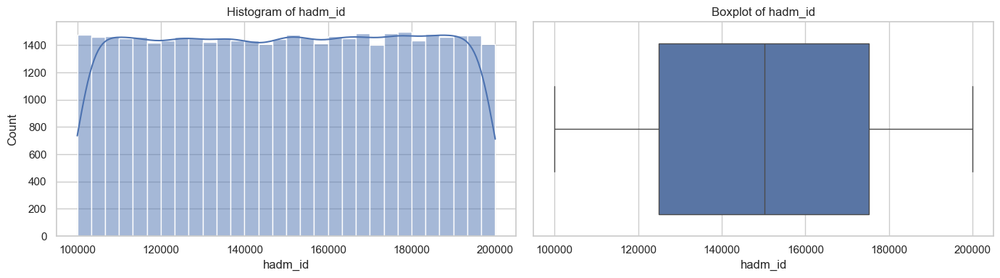


=== age ===
Summary statistics:
count    43539.000000
mean        77.695101
std         57.746123
min          0.000000
25%         56.000000
50%         68.000000
75%         79.000000
max        311.000000
Name: age, dtype: float64

Top 5 values:
       age
28585  311
5528   311
5530   310
28584  310
1001   310

Bottom 5 values:
       age
14421    0
19431    0
806      0
13314    0
22881    0


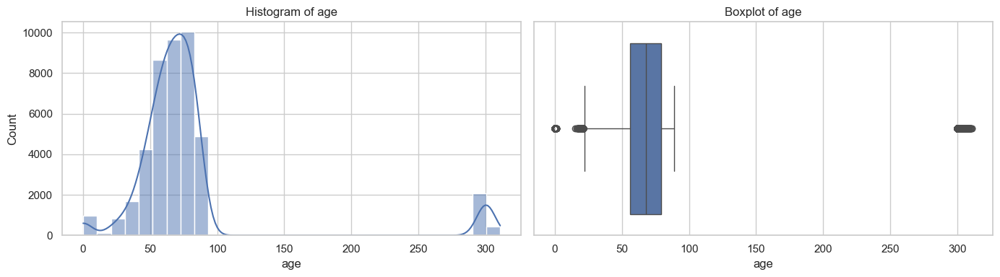


=== gender ===
Summary statistics:
count    43539.000000
mean         0.562323
std          0.496106
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: gender, dtype: float64

Top 5 values:
       gender
0           1
19154       1
19182       1
19186       1
19187       1

Bottom 5 values:
       gender
21770       0
23265       0
23262       0
23261       0
23259       0


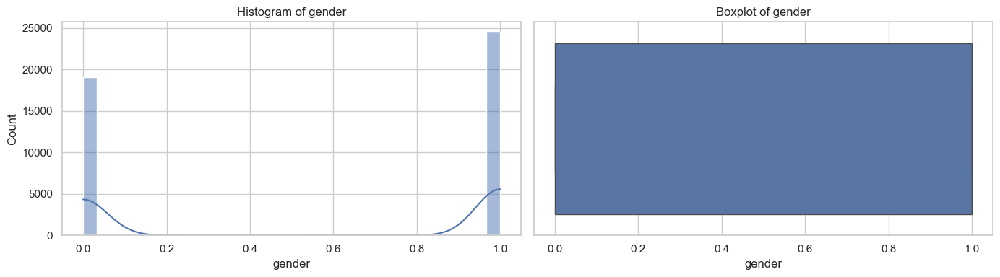


=== admission_day_of_week ===
Summary statistics:
count    43539.000000
mean         3.937091
std          1.856308
min          1.000000
25%          2.000000
50%          4.000000
75%          6.000000
max          7.000000
Name: admission_day_of_week, dtype: float64

Top 5 values:
       admission_day_of_week
22242                      7
3011                       7
10499                      7
20759                      7
3015                       7

Bottom 5 values:
       admission_day_of_week
14157                      1
33991                      1
17960                      1
17963                      1
33982                      1


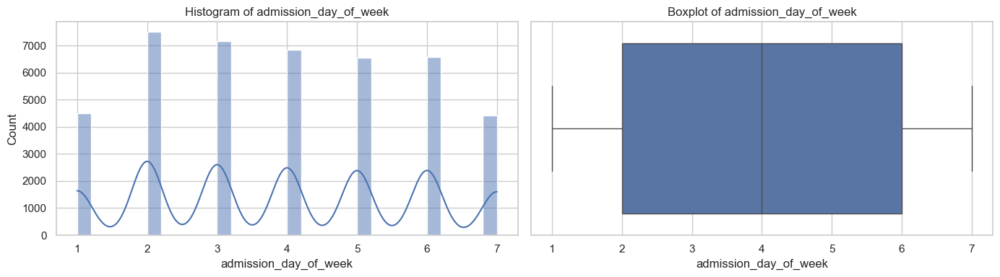


=== length_of_stay ===
Summary statistics:
count    43539.000000
mean        10.619996
std         12.450460
min          0.000000
25%          4.000000
50%          7.000000
75%         12.000000
max        295.000000
Name: length_of_stay, dtype: float64

Top 5 values:
       length_of_stay
10471             295
41684             207
5538              192
8167              182
5262              174

Bottom 5 values:
       length_of_stay
22810               0
5483                0
33534               0
33523               0
21519               0


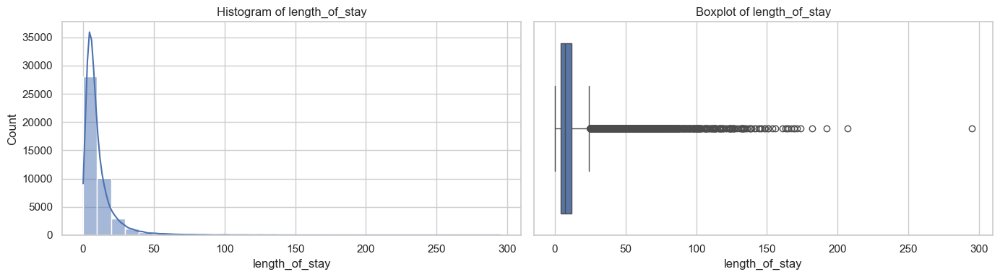


=== icu_stay ===
Summary statistics:
count    43539.000000
mean         0.982108
std          0.132560
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: icu_stay, dtype: float64

Top 5 values:
       icu_stay
0             1
28929         1
28922         1
28921         1
28923         1

Bottom 5 values:
       icu_stay
25483         0
17157         0
2409          0
30462         0
31740         0


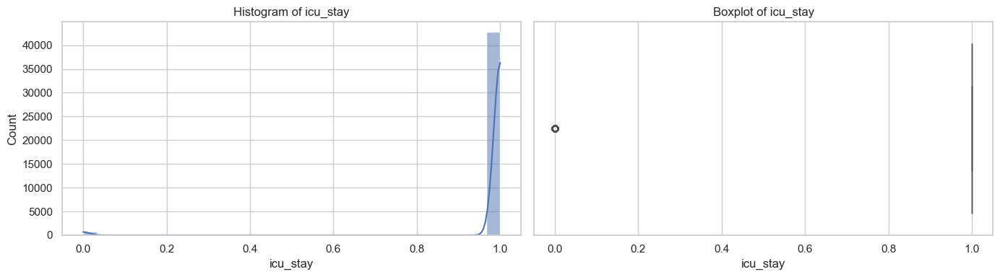


=== num_past_admissions ===
Summary statistics:
count    43539.000000
mean         0.529548
std          1.638718
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         41.000000
Name: num_past_admissions, dtype: float64

Top 5 values:
       num_past_admissions
10820                   41
10816                   40
10846                   39
10825                   38
10840                   37

Bottom 5 values:
       num_past_admissions
0                        0
27813                    0
27815                    0
27816                    0
27817                    0


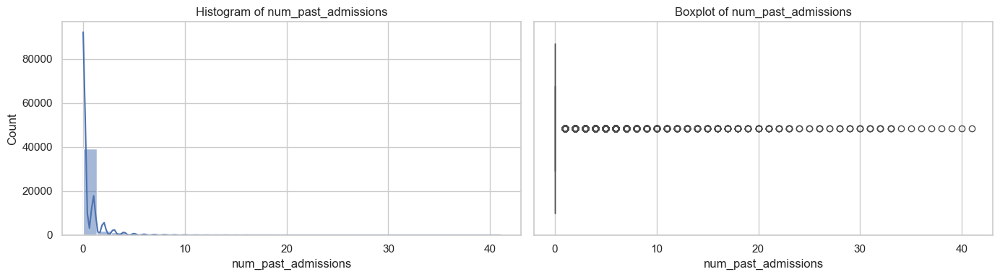


=== sbp_min ===
Summary statistics:
count    18482.000000
mean        89.855005
std         19.197204
min        -69.000000
25%         79.000000
50%         90.000000
75%        101.000000
max        212.000000
Name: sbp_min, dtype: float64

Top 5 values:
       sbp_min
35886    212.0
38583    182.0
38064    181.0
34020    173.0
41455    172.0

Bottom 5 values:
       sbp_min
37287    -69.0
24479      0.0
32491      0.0
42923      0.0
34051      0.0


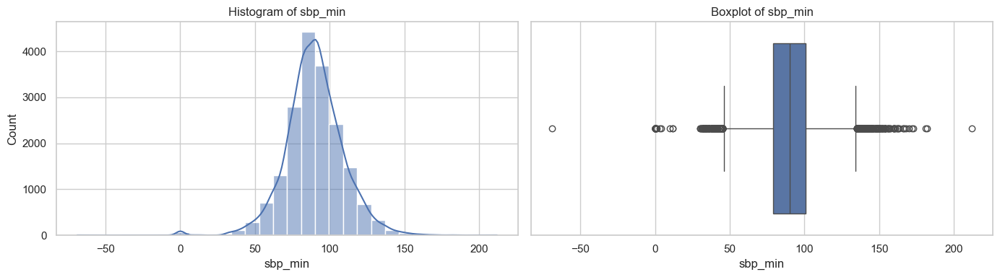


=== sbp_max ===
Summary statistics:
count     18482.000000
mean        192.201984
std        2076.410375
min          46.000000
25%         133.000000
50%         150.000000
75%         168.000000
max      141146.040000
Name: sbp_max, dtype: float64

Top 5 values:
         sbp_max
18329  141146.04
43073  127105.99
33476  119119.02
32396  116116.00
20527  101110.02

Bottom 5 values:
       sbp_max
41003     46.0
25222     62.0
34967     62.0
40877     69.0
42511     69.0


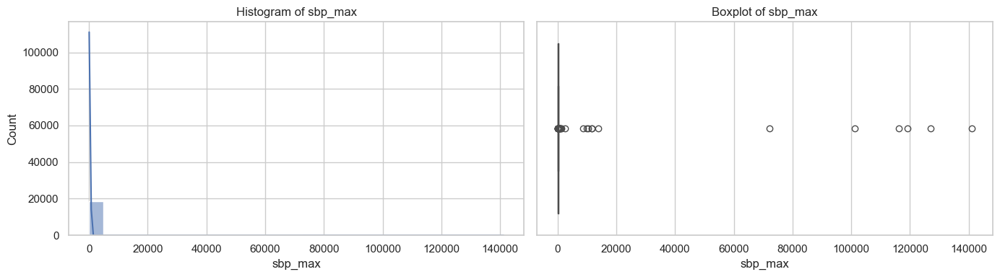


=== sbp_avg ===
Summary statistics:
count    18482.000000
mean       120.344885
std         40.865288
min         45.416667
25%        107.333333
50%        117.841429
75%        130.500000
max       3122.468936
Name: sbp_avg, dtype: float64

Top 5 values:
           sbp_avg
18329  3122.468936
33476  3022.024878
43073  2232.066500
32396  1613.454545
30607   874.533333

Bottom 5 values:
         sbp_avg
42573  45.416667
41003  46.000000
34167  51.333333
24676  55.869565
40877  58.000000


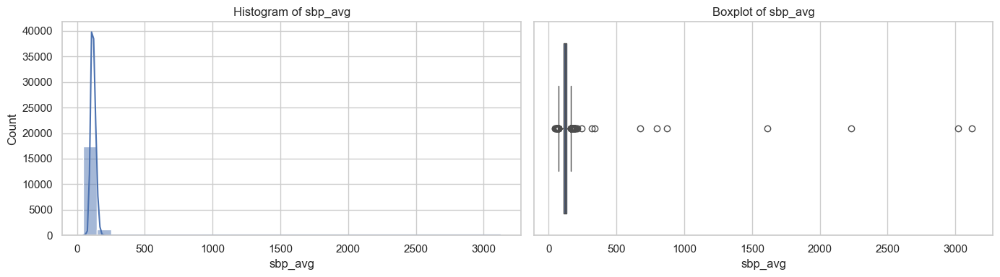


=== dbp_min ===
Summary statistics:
count    18482.000000
mean        41.877070
std         13.142439
min         -2.000000
25%         33.000000
50%         42.000000
75%         50.000000
max        105.000000
Name: dbp_min, dtype: float64

Top 5 values:
       dbp_min
38064    105.0
41115    101.0
33832    100.0
34020     99.0
19596     99.0

Bottom 5 values:
       dbp_min
41668     -2.0
31804      0.0
3285       0.0
24479      0.0
36041      0.0


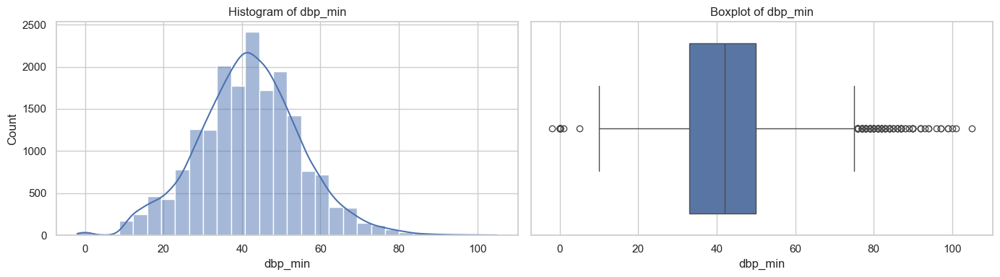


=== dbp_max ===
Summary statistics:
count     18482.000000
mean        247.335361
std        3171.088154
min           0.000000
25%          77.000000
50%          90.000000
75%         104.000000
max      114108.980000
Name: dbp_max, dtype: float64

Top 5 values:
         dbp_max
9144   114108.98
40263  105111.00
33275   96105.00
32992   95101.04
7270    90109.97

Bottom 5 values:
       dbp_max
36305      0.0
35886     12.0
42818     22.0
5985      29.0
41003     31.0


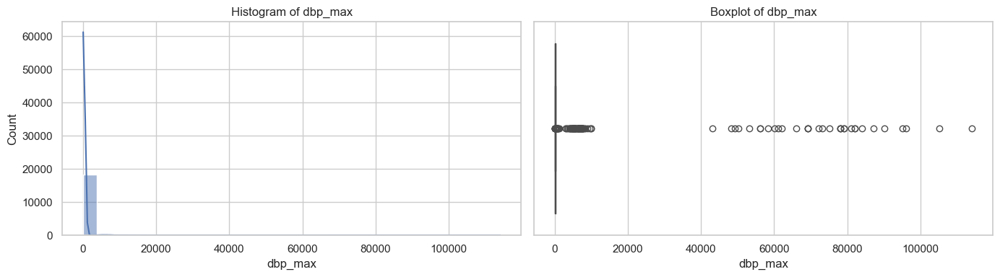


=== dbp_avg ===
Summary statistics:
count    18482.000000
mean        64.269102
std         55.547178
min          0.000000
25%         55.005202
50%         61.625000
75%         69.209978
max       5509.111111
Name: dbp_avg, dtype: float64

Top 5 values:
           dbp_avg
33082  5509.111111
37212  2365.267000
7270   1854.764118
39819  1818.883023
18329  1728.021277

Bottom 5 values:
         dbp_avg
36305   0.000000
35886  12.000000
42818  22.000000
5985   24.625000
37365  26.285714


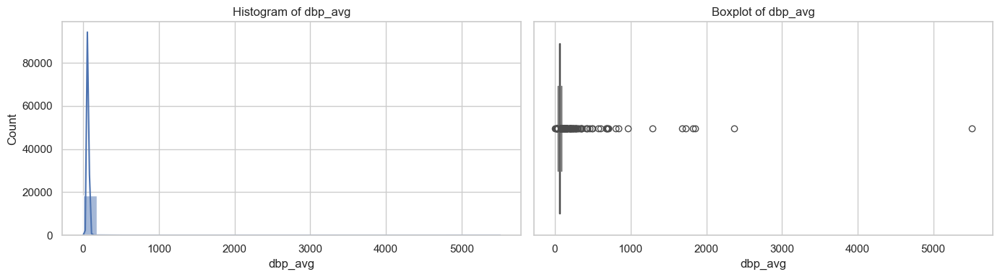


=== heart_rate_min ===
Summary statistics:
count    23439.000000
mean        64.088041
std         20.984024
min          0.000000
25%         55.000000
50%         64.000000
75%         74.000000
max        207.000000
Name: heart_rate_min, dtype: float64

Top 5 values:
       heart_rate_min
7230            207.0
16718           190.0
9357            186.0
25014           172.0
20687           172.0

Bottom 5 values:
       heart_rate_min
5831              0.0
22618             0.0
1175              0.0
22623             0.0
3948              0.0


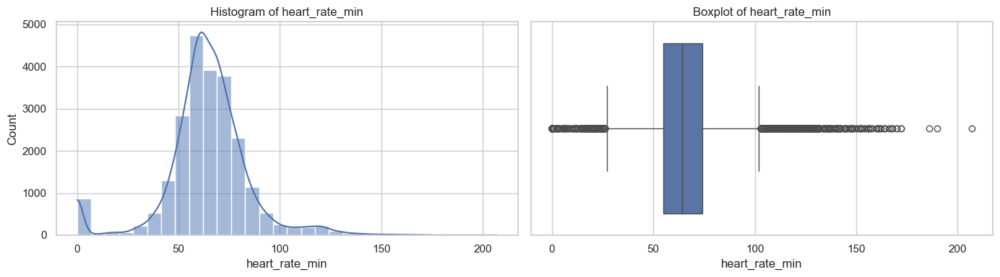


=== heart_rate_max ===
Summary statistics:
count    23439.000000
mean       115.052596
std         29.040497
min         30.000000
25%         95.000000
50%        110.000000
75%        130.000000
max        303.000000
Name: heart_rate_max, dtype: float64

Top 5 values:
       heart_rate_max
2682            303.0
19421           300.0
15542           300.0
11237           300.0
146             300.0

Bottom 5 values:
       heart_rate_max
3904             30.0
19175            37.0
18862            38.0
12687            48.0
23138            50.0


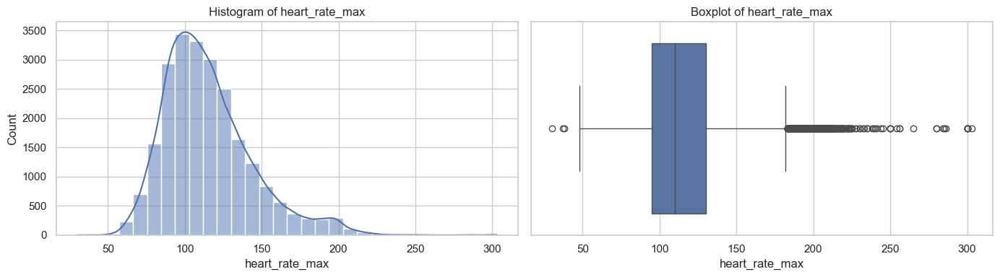


=== heart_rate_avg ===
Summary statistics:
count    23439.000000
mean        86.688955
std         18.725163
min         26.357143
25%         75.372115
50%         84.167582
75%         93.940241
max        244.800000
Name: heart_rate_avg, dtype: float64

Top 5 values:
       heart_rate_avg
3020       244.800000
7230       212.500000
16718      193.500000
9357       186.000000
4099       183.461538

Bottom 5 values:
       heart_rate_avg
12137       26.357143
19175       29.916667
3904        30.000000
18862       34.307692
19991       35.400000


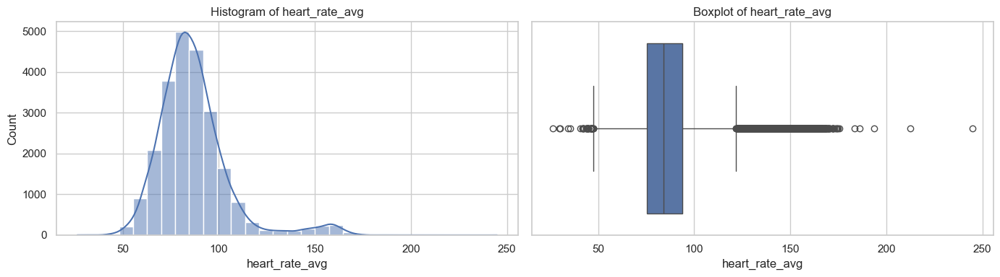


=== resp_rate_min ===
Summary statistics:
count    22470.000000
mean         9.561957
std          5.142692
min          0.000000
25%          7.000000
50%         10.000000
75%         13.000000
max         43.000000
Name: resp_rate_min, dtype: float64

Top 5 values:
       resp_rate_min
17431           43.0
21524           40.0
14938           33.0
15877           31.0
5999            30.0

Bottom 5 values:
       resp_rate_min
0                0.0
10942            0.0
10939            0.0
10936            0.0
10935            0.0


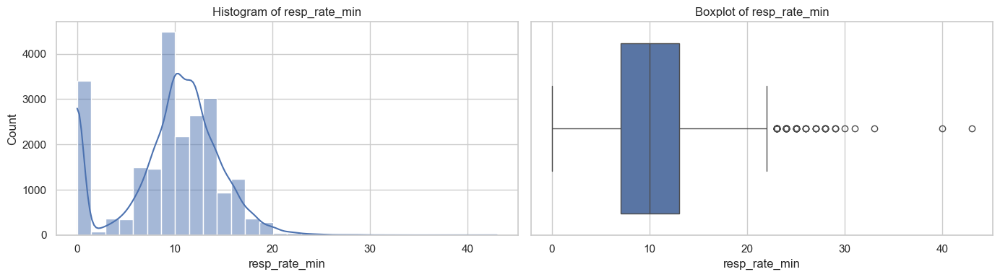


=== resp_rate_max ===
Summary statistics:
count    22470.000000
mean        31.853227
std         10.620889
min          8.000000
25%         25.000000
50%         29.000000
75%         36.000000
max        130.000000
Name: resp_rate_max, dtype: float64

Top 5 values:
       resp_rate_max
18312          130.0
11314          127.0
13951          123.0
19802          121.0
20615          119.0

Bottom 5 values:
       resp_rate_max
7221             8.0
15483            9.0
3403            10.0
4409            10.0
5791            11.0


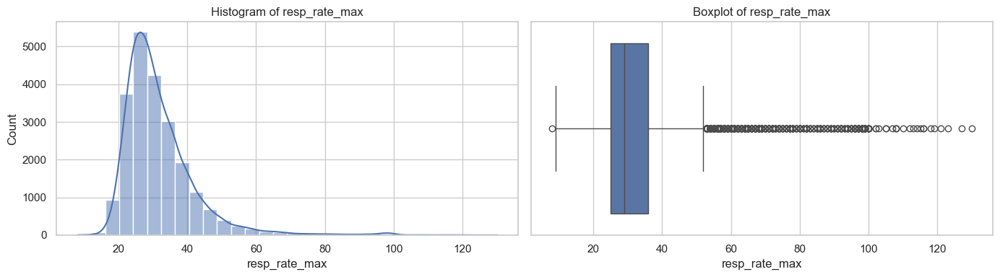


=== resp_rate_avg ===
Summary statistics:
count    22470.000000
mean        19.227319
std          3.593946
min          0.642857
25%         16.691054
50%         18.852420
75%         21.342857
max         48.000000
Name: resp_rate_avg, dtype: float64

Top 5 values:
       resp_rate_avg
11178      48.000000
17431      45.500000
22051      42.692308
18151      41.833333
21524      40.000000

Bottom 5 values:
       resp_rate_avg
15483       0.642857
13199       6.000000
15431       7.214286
24119       7.285714
7221        7.333333


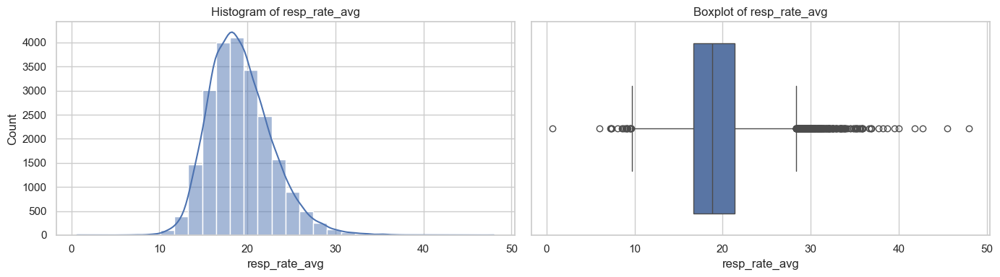


=== spo2_min ===
Summary statistics:
count    22475.000000
mean        85.140420
std         17.159757
min          0.000000
25%         85.000000
50%         91.000000
75%         94.000000
max        100.000000
Name: spo2_min, dtype: float64

Top 5 values:
       spo2_min
9332      100.0
10872     100.0
4379      100.0
19002     100.0
10553     100.0

Bottom 5 values:
       spo2_min
20924       0.0
10585       0.0
20805       0.0
20807       0.0
10543       0.0


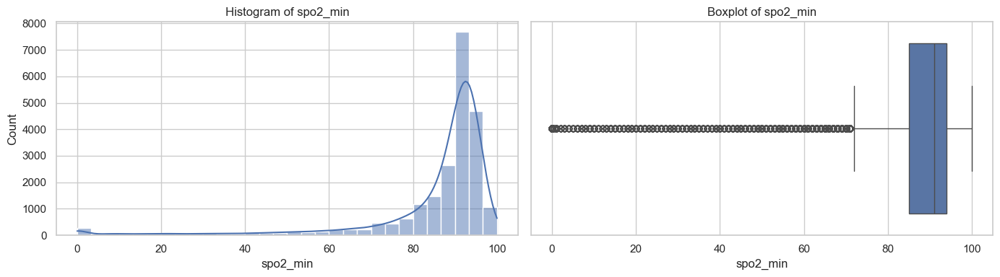


=== spo2_max ===
Summary statistics:
count    22475.000000
mean        99.757608
std          1.032393
min         57.000000
25%        100.000000
50%        100.000000
75%        100.000000
max        110.000000
Name: spo2_max, dtype: float64

Top 5 values:
       spo2_max
5323      110.0
14626     109.0
13475     105.0
18727     102.0
10960     101.0

Bottom 5 values:
       spo2_max
2486       57.0
20406      65.0
5999       68.0
8828       71.0
4115       72.0


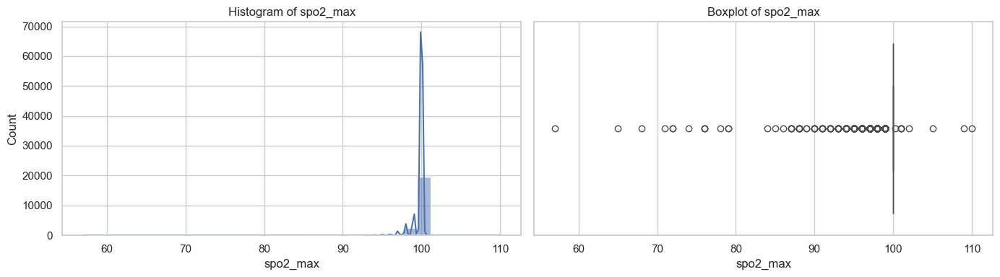


=== spo2_avg ===
Summary statistics:
count    22475.000000
mean        96.978755
std          2.539201
min         31.444444
25%         96.222222
50%         97.339286
75%         98.270942
max        100.000000
Name: spo2_avg, dtype: float64

Top 5 values:
       spo2_avg
9332      100.0
3988      100.0
6240      100.0
7973      100.0
10231     100.0

Bottom 5 values:
       spo2_avg
4115  31.444444
5999  41.916667
7859  47.714286
271   47.916667
8828  49.000000


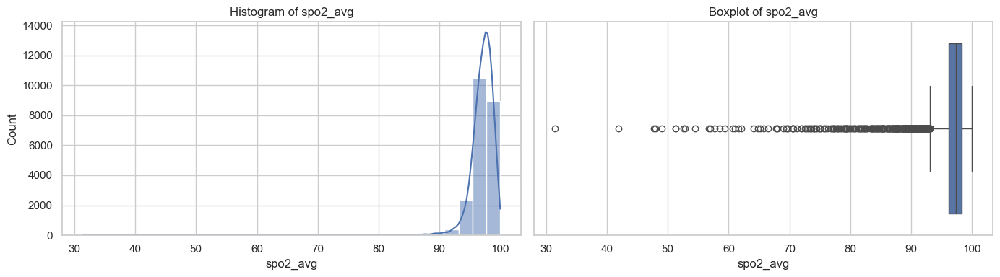


=== temp_min ===
Summary statistics:
count    18444.000000
mean        95.327409
std         10.043188
min        -99.900000
25%         96.000000
50%         96.600000
75%         97.400000
max        104.000000
Name: temp_min, dtype: float64

Top 5 values:
       temp_min
23148     104.0
25369     103.5
33381     103.1
27818     102.8
33021     102.6

Bottom 5 values:
       temp_min
37156     -99.9
28590      -4.0
39365       0.0
42825       0.0
39091       0.0


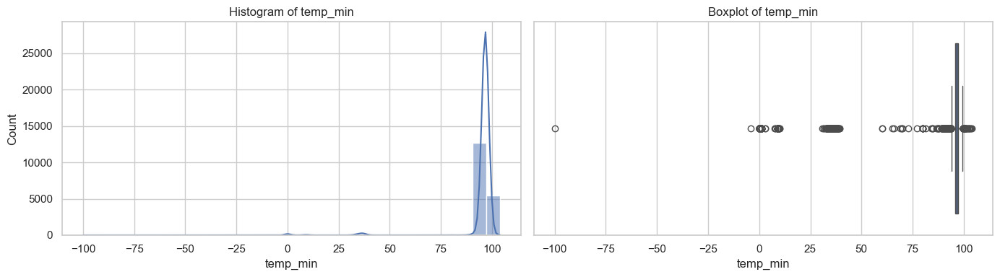


=== temp_max ===
Summary statistics:
count    18444.000000
mean       101.017174
std         75.813278
min          0.000000
25%         98.600000
50%         99.400000
75%        100.500000
max       9637.000000
Name: temp_max, dtype: float64

Top 5 values:
       temp_max
31313    9637.0
40547    1111.0
4445      998.7
33356     998.0
27480     997.5

Bottom 5 values:
       temp_max
42511       0.0
28109      31.4
35425      32.4
33983      32.7
37767      33.0


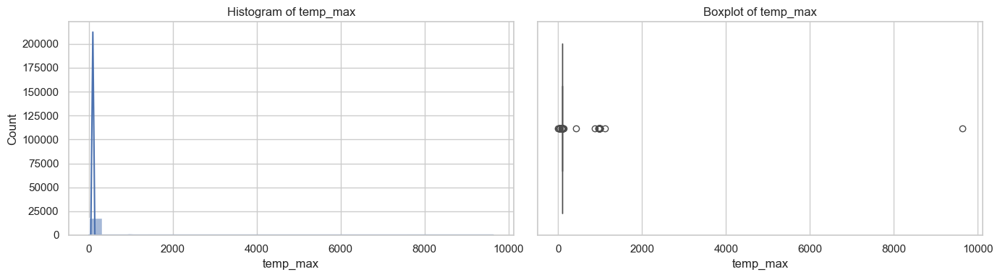


=== temp_avg ===
Summary statistics:
count    18444.000000
mean        97.996327
std          4.476797
min          0.000000
25%         97.523416
50%         98.088235
75%         98.650000
max        512.243478
Name: temp_avg, dtype: float64

Top 5 values:
         temp_avg
31313  512.243478
40547  300.020000
41234  163.961538
6506   161.828571
36902  143.952632

Bottom 5 values:
       temp_avg
42511       0.0
28109      31.4
35425      32.4
33983      32.7
37767      33.0


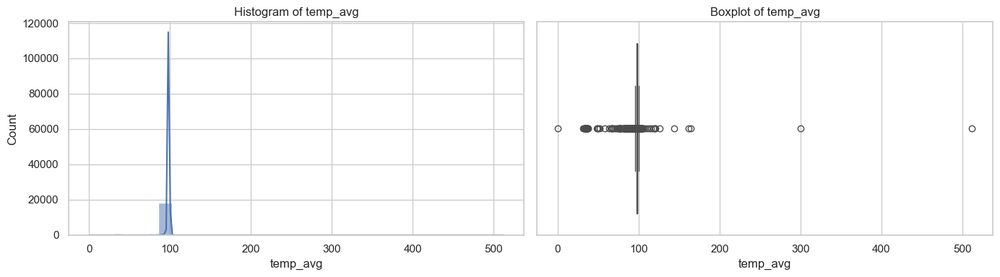


=== bnp_min ===
Summary statistics:
count    18660.000000
mean       304.172883
std        516.262025
min         33.000000
25%        178.000000
50%        226.000000
75%        302.000000
max      16490.000000
Name: bnp_min, dtype: float64

Top 5 values:
       bnp_min
34007  16490.0
24592  15020.0
6759   14660.0
8956   14430.0
41156  14400.0

Bottom 5 values:
       bnp_min
4776      33.0
4190      35.0
35899     35.0
31587     36.0
30295     37.0


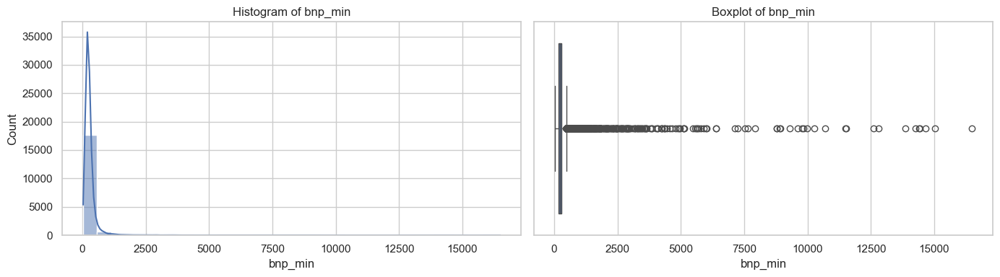


=== bnp_max ===
Summary statistics:
count    18660.000000
mean       539.847856
std       1360.966983
min         45.000000
25%        205.000000
50%        276.000000
75%        412.000000
max      43920.000000
Name: bnp_max, dtype: float64

Top 5 values:
       bnp_max
39984  43920.0
6193   33140.0
30897  29740.0
43100  28225.0
8405   25300.0

Bottom 5 values:
       bnp_max
19592     45.0
24252     48.0
26677     55.0
4264      62.0
2029      65.0


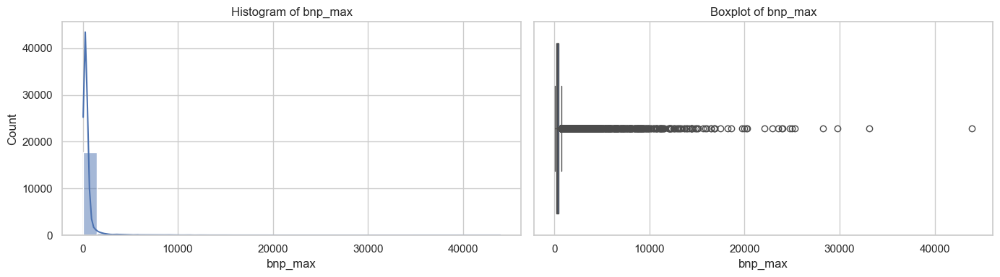


=== bnp_avg ===
Summary statistics:
count    18660.000000
mean       387.571454
std        704.781585
min         45.000000
25%        196.000000
50%        253.000000
75%        356.000000
max      18158.750000
Name: bnp_avg, dtype: float64

Top 5 values:
        bnp_avg
14073  18158.75
34007  16490.00
40391  15567.00
40715  15309.00
38565  15267.50

Bottom 5 values:
       bnp_avg
19592     45.0
24252     48.0
26677     55.0
4264      62.0
2029      65.0


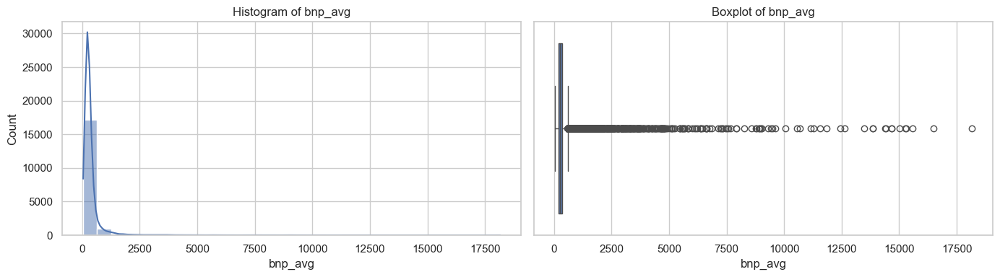


=== creatinine_min ===
Summary statistics:
count    42006.000000
mean         1.091298
std          1.094545
min          0.000000
25%          0.600000
50%          0.800000
75%          1.100000
max         17.600000
Name: creatinine_min, dtype: float64

Top 5 values:
       creatinine_min
26107            17.6
6383             16.2
25503            16.0
22223            14.9
29860            14.7

Bottom 5 values:
       creatinine_min
29576             0.0
31146             0.0
35531             0.0
17437             0.0
37963             0.0


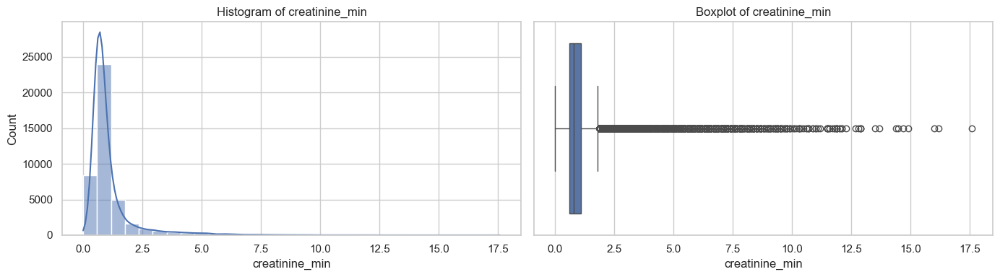


=== creatinine_max ===
Summary statistics:
count    42006.000000
mean         1.888987
std          2.187722
min          0.100000
25%          0.900000
50%          1.200000
75%          1.900000
max        138.000000
Name: creatinine_max, dtype: float64

Top 5 values:
       creatinine_max
8405            138.0
15125            73.0
16305            73.0
30687            33.2
10932            23.7

Bottom 5 values:
       creatinine_max
42443             0.1
30833             0.1
21609             0.1
20435             0.1
27286             0.1


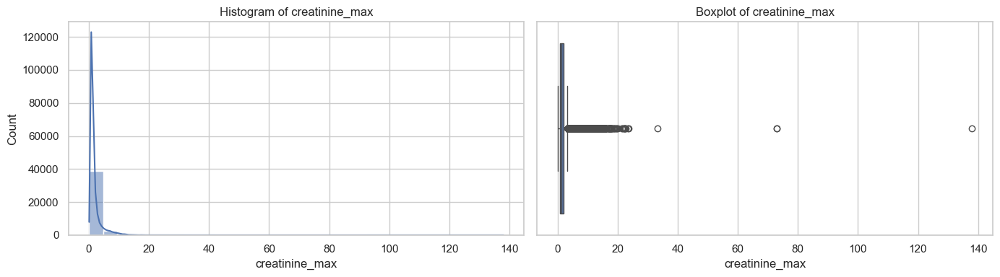


=== creatinine_avg ===
Summary statistics:
count    42006.000000
mean         1.439157
std          1.467373
min          0.075000
25%          0.733333
50%          0.966667
75%          1.433333
max         19.316667
Name: creatinine_avg, dtype: float64

Top 5 values:
       creatinine_avg
29860       19.316667
38083       17.933333
26107       17.600000
6383        16.620000
7434        16.533333

Bottom 5 values:
       creatinine_avg
35389           0.075
30833           0.100
21609           0.100
13892           0.100
27286           0.100


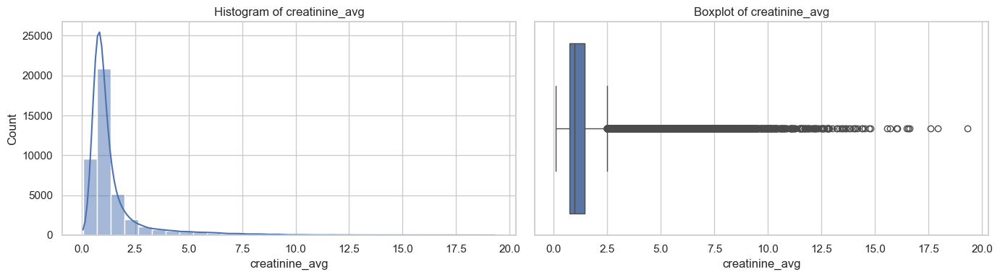


=== bun_min ===
Summary statistics:
count    42009.000000
mean        17.869695
std         13.987108
min          0.000000
25%         10.000000
50%         14.000000
75%         21.000000
max        175.000000
Name: bun_min, dtype: float64

Top 5 values:
       bun_min
37357    175.0
25508    155.0
23564    152.0
34448    148.0
11831    147.0

Bottom 5 values:
       bun_min
35179      0.0
3488       0.0
7703       0.0
29701      1.0
14906      1.0


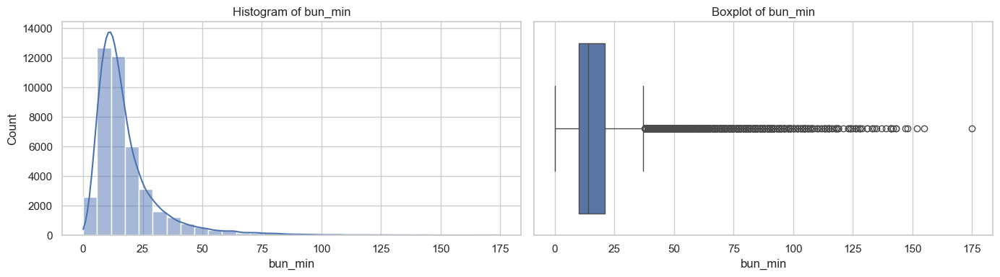


=== bun_max ===
Summary statistics:
count    42009.000000
mean        36.938109
std         27.578172
min          2.000000
25%         19.000000
50%         28.000000
75%         46.000000
max        290.000000
Name: bun_max, dtype: float64

Top 5 values:
       bun_max
37357    290.0
35439    271.0
20035    266.0
32301    252.0
27914    242.0

Bottom 5 values:
       bun_max
12976      2.0
26372      3.0
30967      3.0
765        3.0
43455      3.0


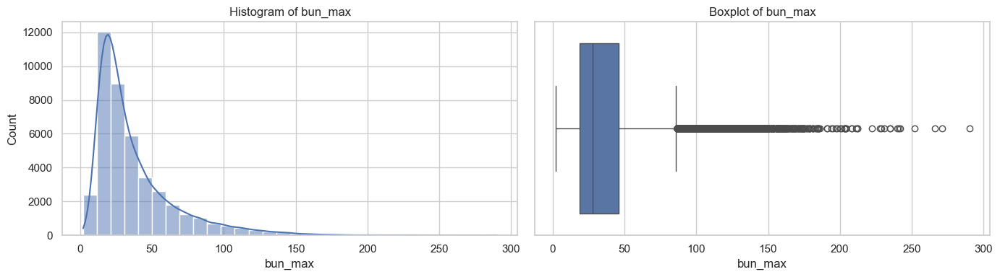


=== bun_avg ===
Summary statistics:
count    42009.000000
mean        26.364165
std         18.535226
min          2.000000
25%         14.230769
50%         20.428571
75%         32.428571
max        235.041667
Name: bun_avg, dtype: float64

Top 5 values:
          bun_avg
37357  235.041667
35439  192.400000
12933  173.000000
32301  163.200000
25508  161.750000

Bottom 5 values:
        bun_avg
12976  2.000000
43455  2.200000
23313  2.250000
30967  2.333333
768    2.571429


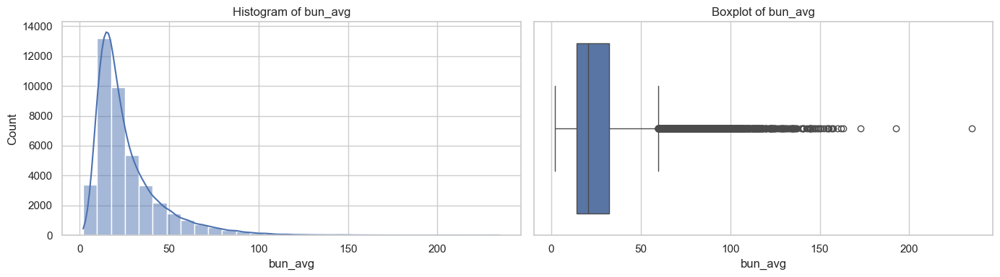


=== hemoglobin_min ===
Summary statistics:
count    42267.000000
mean        10.673954
std          2.897816
min        -21.000000
25%          9.000000
50%         10.000000
75%         12.000000
max         44.000000
Name: hemoglobin_min, dtype: float64

Top 5 values:
       hemoglobin_min
23988            44.0
36178            42.0
2174             42.0
21077            39.0
9538             39.0

Bottom 5 values:
       hemoglobin_min
43257           -21.0
1350             -6.0
16211            -3.0
15972            -3.0
30927            -3.0


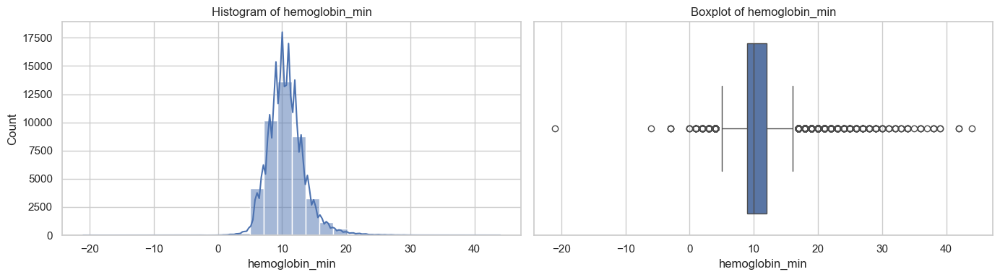


=== hemoglobin_max ===
Summary statistics:
count    42267.000000
mean        16.822982
std          4.392707
min          4.000000
25%         14.000000
50%         16.000000
75%         19.000000
max         77.000000
Name: hemoglobin_max, dtype: float64

Top 5 values:
       hemoglobin_max
25158            77.0
15800            74.0
7734             68.0
20812            67.0
5878             61.0

Bottom 5 values:
       hemoglobin_max
8321              4.0
29227             5.0
28147             6.0
39296             6.0
31895             6.0


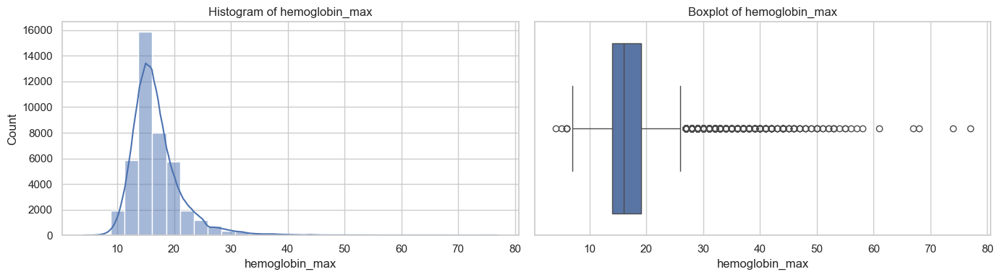


=== hemoglobin_avg ===
Summary statistics:
count    42267.000000
mean        13.472664
std          2.850785
min          3.000000
25%         11.687500
50%         13.000000
75%         14.666667
max         49.000000
Name: hemoglobin_avg, dtype: float64

Top 5 values:
       hemoglobin_avg
2174            49.00
36178           48.00
23988           44.00
6122            44.00
1317            42.75

Bottom 5 values:
       hemoglobin_avg
8321         3.000000
5988         4.083333
21795        4.190476
29227        4.500000
22414        5.375000


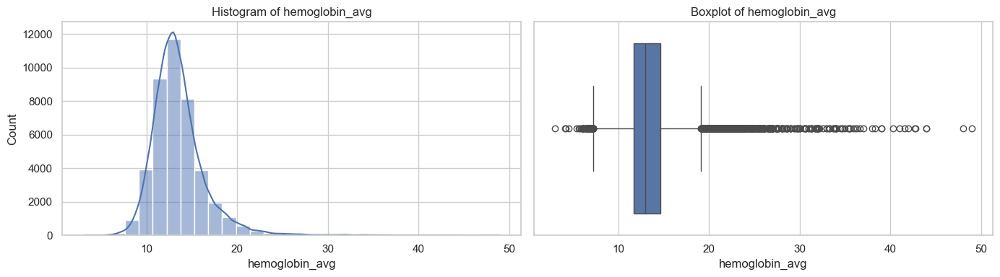


=== hematocrit_min ===
Summary statistics:
count    42253.000000
mean         9.435112
std          1.978743
min          0.000000
25%          8.100000
50%          9.100000
75%         10.600000
max         23.100000
Name: hematocrit_min, dtype: float64

Top 5 values:
       hematocrit_min
6839             23.1
9529             22.9
12708            22.2
10709            21.6
1715             21.2

Bottom 5 values:
       hematocrit_min
16651             0.0
2434              0.0
39857             0.0
23435             0.0
14241             0.0


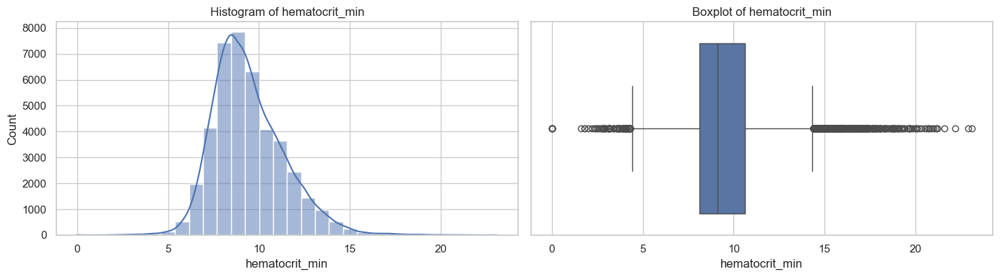


=== hematocrit_max ===
Summary statistics:
count    42253.000000
mean        11.975259
std          1.804337
min          3.700000
25%         10.700000
50%         11.800000
75%         13.100000
max         25.300000
Name: hematocrit_max, dtype: float64

Top 5 values:
       hematocrit_max
11621            25.3
7529             24.3
8985             23.8
6839             23.1
9529             22.9

Bottom 5 values:
       hematocrit_max
15611             3.7
32020             4.3
20236             4.6
37882             4.7
8272              5.6


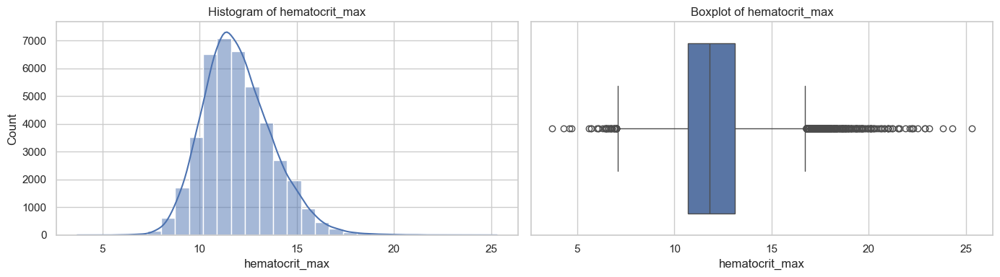


=== hematocrit_avg ===
Summary statistics:
count    42253.000000
mean        10.659133
std          1.648844
min          3.700000
25%          9.539706
50%         10.400000
75%         11.528571
max         23.100000
Name: hematocrit_avg, dtype: float64

Top 5 values:
       hematocrit_avg
6839        23.100000
11621       23.066667
9529        22.900000
12708       22.200000
2584        21.600000

Bottom 5 values:
       hematocrit_avg
15611        3.700000
37882        4.033333
20236        4.275000
32020        4.300000
22633        4.380000


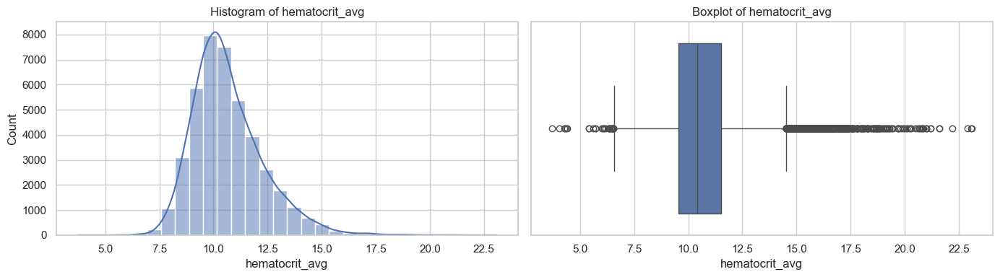


=== potassium_max ===
Summary statistics:
count    42277.000000
mean        29.140582
std          4.709526
min          5.000000
25%         26.000000
50%         29.000000
75%         32.000000
max         65.000000
Name: potassium_max, dtype: float64

Top 5 values:
       potassium_max
20890           65.0
21795           60.0
21797           60.0
26594           60.0
13751           57.0

Bottom 5 values:
       potassium_max
21524            5.0
9538             5.0
13770            5.0
10064            5.0
21487            6.0


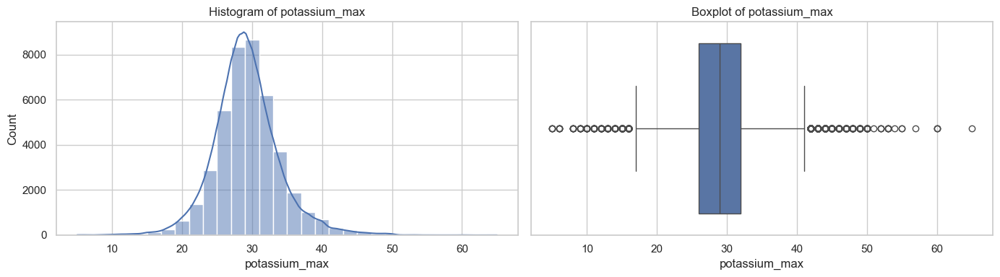


=== potassium_avg ===
Summary statistics:
count    42277.000000
mean        25.489226
std          3.946142
min          5.000000
25%         23.333333
50%         25.500000
75%         27.500000
max         53.250000
Name: potassium_avg, dtype: float64

Top 5 values:
       potassium_avg
21800      53.250000
21795      51.619048
22628      50.000000
14625      50.000000
6758       50.000000

Bottom 5 values:
       potassium_avg
10064            5.0
9538             5.0
21524            5.0
13770            5.0
22207            6.0


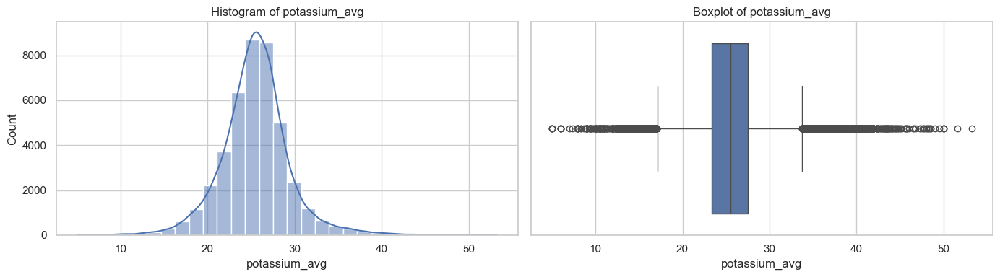


=== sodium_max ===
Summary statistics:
count    42284.000000
mean       108.804039
std          5.808561
min         74.000000
25%        105.000000
50%        109.000000
75%        112.000000
max        154.000000
Name: sodium_max, dtype: float64

Top 5 values:
       sodium_max
30130       154.0
43257       151.0
41364       145.0
37379       144.0
8671        142.0

Bottom 5 values:
       sodium_max
21800        74.0
32083        77.0
15223        80.0
14201        82.0
22627        82.0


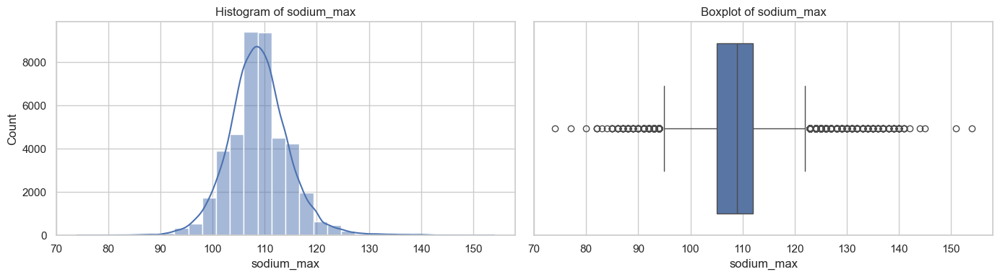


=== sodium_avg ===
Summary statistics:
count    42284.000000
mean       104.031732
std          4.748744
min         74.000000
25%        101.285714
50%        104.142857
75%        106.857143
max        135.000000
Name: sodium_avg, dtype: float64

Top 5 values:
       sodium_avg
19690  135.000000
6568   134.800000
39670  132.875000
37379  132.461538
17871  131.000000

Bottom 5 values:
       sodium_avg
21800   74.000000
32083   77.000000
41552   78.000000
21797   78.155556
6500    79.382353


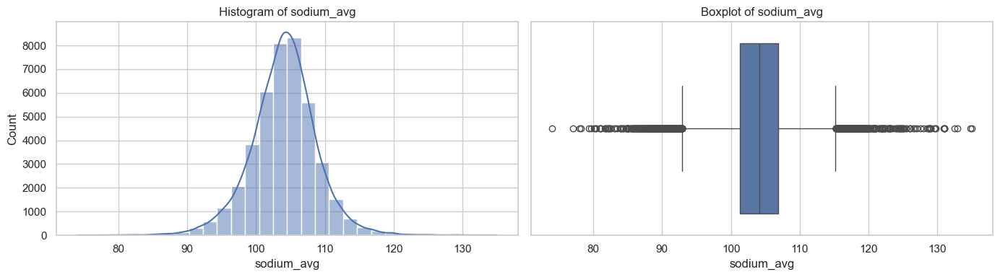


=== magnesium_max ===
Summary statistics:
count    41483.000000
mean         2.400742
std          0.844107
min          0.900000
25%          2.100000
50%          2.300000
75%          2.600000
max         58.000000
Name: magnesium_max, dtype: float64

Top 5 values:
       magnesium_max
43361           58.0
42894           55.0
1481            43.5
11958           37.5
32687           36.0

Bottom 5 values:
       magnesium_max
36360            0.9
10596            1.0
22584            1.0
19226            1.0
42120            1.1


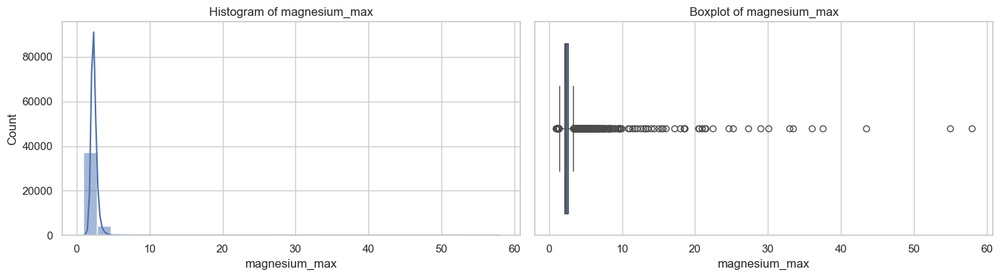


=== magnesium_avg ===
Summary statistics:
count    41483.000000
mean         2.033848
std          0.256225
min          0.900000
25%          1.880000
50%          2.008333
75%          2.157143
max          8.980000
Name: magnesium_avg, dtype: float64

Top 5 values:
       magnesium_avg
11958       8.980000
38754       6.500000
32804       6.428571
23320       6.200000
28337       6.100000

Bottom 5 values:
       magnesium_avg
36360       0.900000
10596       1.000000
19226       1.000000
22584       1.000000
32243       1.033333


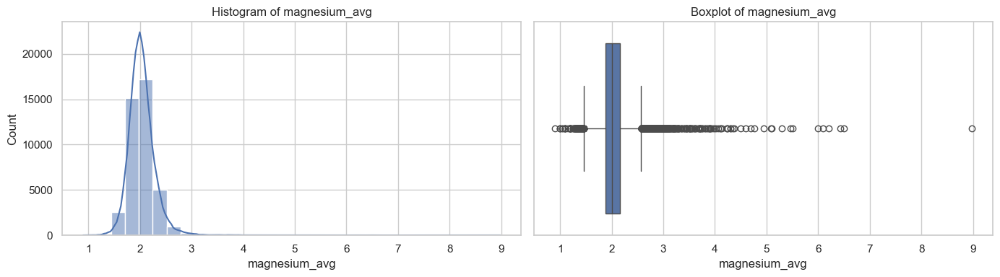


=== calcium_max ===
Summary statistics:
count    40356.000000
mean         9.036842
std          0.911351
min          3.800000
25%          8.500000
50%          9.000000
75%          9.400000
max         47.700000
Name: calcium_max, dtype: float64

Top 5 values:
       calcium_max
11090         47.7
37852         33.9
3757          31.2
22348         30.6
17302         29.8

Bottom 5 values:
       calcium_max
22933          3.8
17871          4.5
3832           4.7
15611          4.9
10064          5.1


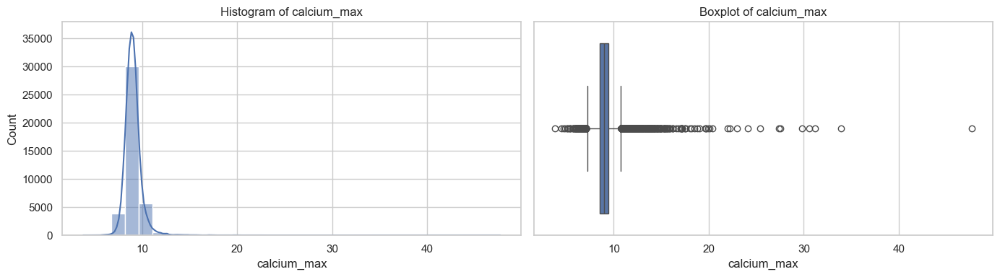


=== calcium_avg ===
Summary statistics:
count    40356.000000
mean         8.474263
std          0.634246
min          3.800000
25%          8.083333
50%          8.450000
75%          8.833333
max         18.100000
Name: calcium_avg, dtype: float64

Top 5 values:
       calcium_avg
34514    18.100000
42318    17.500000
8413     16.600000
42378    14.825000
36806    13.627778

Bottom 5 values:
       calcium_avg
22933        3.800
111          3.850
14477        4.425
17871        4.500
3832         4.700


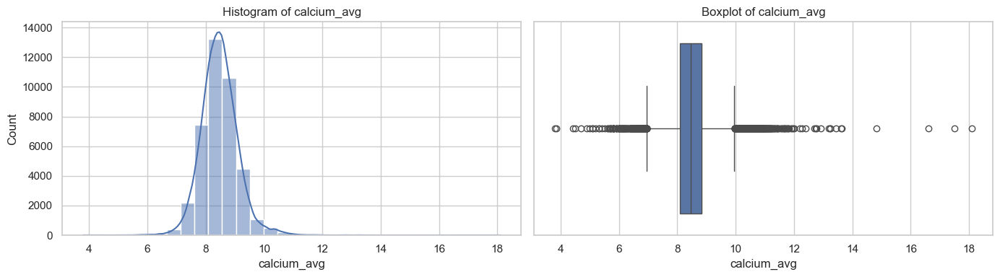


=== glucose_min ===
Summary statistics:
count    42314.000000
mean         3.557503
std          0.478044
min          0.800000
25%          3.200000
50%          3.500000
75%          3.800000
max          9.000000
Name: glucose_min, dtype: float64

Top 5 values:
       glucose_min
21077          9.0
43213          7.9
4892           7.9
7405           7.6
2790           7.3

Bottom 5 values:
       glucose_min
38354          0.8
40560          1.0
26859          1.4
35030          1.4
33694          1.5


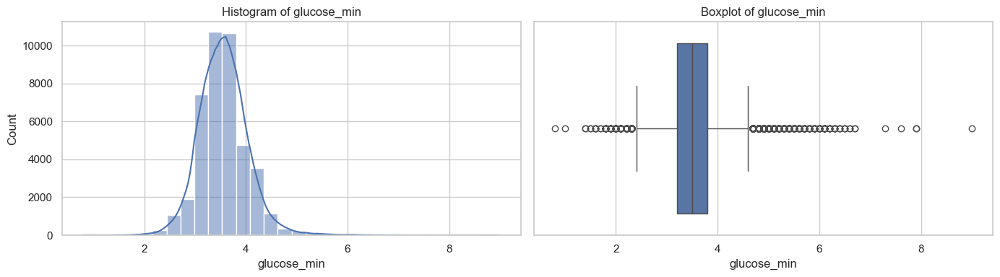


=== glucose_max ===
Summary statistics:
count    42314.000000
mean         4.856823
std          0.864950
min          2.000000
25%          4.300000
50%          4.700000
75%          5.200000
max         27.500000
Name: glucose_max, dtype: float64

Top 5 values:
       glucose_max
12805         27.5
34514         26.5
6304          22.9
21076         19.6
10654         15.6

Bottom 5 values:
       glucose_max
21324          2.0
19782          2.2
26592          2.5
27663          2.5
27993          2.6


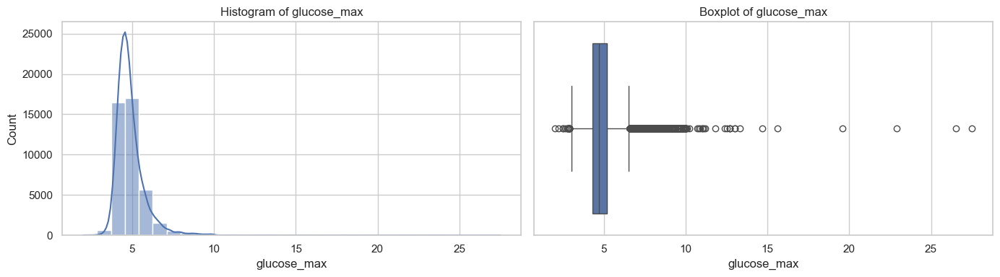


=== glucose_avg ===
Summary statistics:
count    42314.000000
mean         4.125271
std          0.410101
min          2.000000
25%          3.860000
50%          4.081818
75%          4.330000
max          9.000000
Name: glucose_avg, dtype: float64

Top 5 values:
       glucose_avg
21077     9.000000
43213     7.900000
4892      7.900000
7405      7.600000
11229     7.414286

Bottom 5 values:
       glucose_avg
21324          2.0
19782          2.2
27663          2.5
26592          2.5
27993          2.6


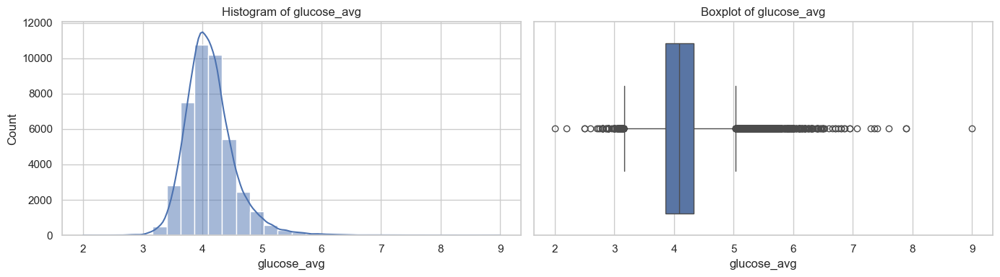


=== albumin_max ===
Summary statistics:
count    22727.000000
mean         3.243979
std          0.631317
min          1.000000
25%          2.800000
50%          3.200000
75%          3.700000
max          6.900000
Name: albumin_max, dtype: float64

Top 5 values:
       albumin_max
20869          6.9
33187          6.4
19126          6.3
30444          6.3
3855           6.2

Bottom 5 values:
       albumin_max
29010          1.0
29008          1.1
18738          1.1
26609          1.1
6122           1.1


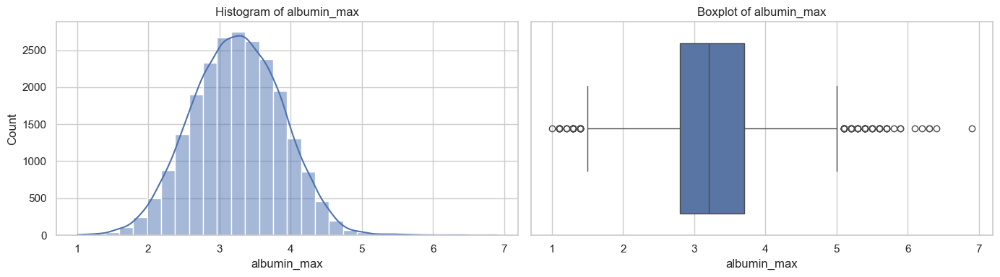


=== albumin_avg ===
Summary statistics:
count    22727.000000
mean         3.074635
std          0.623669
min          1.000000
25%          2.612500
50%          3.075000
75%          3.500000
max          5.400000
Name: albumin_avg, dtype: float64

Top 5 values:
       albumin_avg
1296         5.400
27691        5.400
37584        5.300
19126        5.225
40326        5.200

Bottom 5 values:
       albumin_avg
29010         1.00
29008         1.05
11793         1.05
14477         1.10
18738         1.10


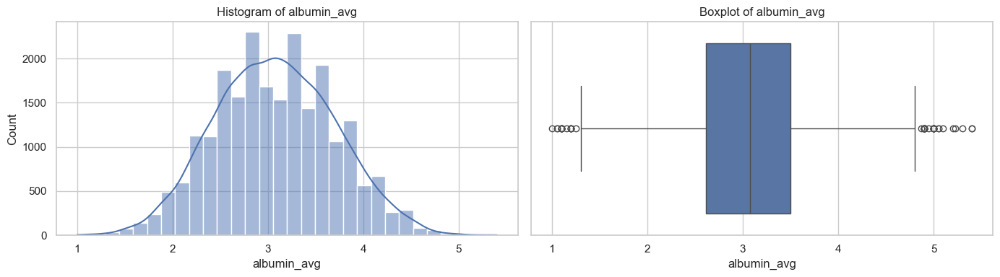


=== crp_max ===
Summary statistics:
count    40359.000000
mean         4.571040
std          1.694441
min          0.800000
25%          3.600000
50%          4.200000
75%          5.100000
max         58.000000
Name: crp_max, dtype: float64

Top 5 values:
       crp_max
42801     58.0
28288     32.8
35149     32.0
31145     31.3
22804     27.7

Bottom 5 values:
       crp_max
7973       0.8
19160      0.9
30051      0.9
13279      1.0
33386      1.0


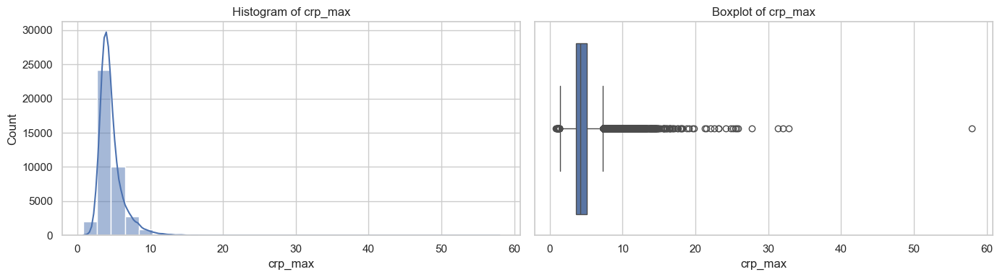


=== crp_avg ===
Summary statistics:
count    40359.000000
mean         3.524940
std          1.014165
min          0.800000
25%          2.900000
50%          3.353846
75%          3.900000
max         13.900000
Name: crp_avg, dtype: float64

Top 5 values:
       crp_avg
23988     13.9
39169     13.6
1596      13.3
22749     13.0
21077     12.9

Bottom 5 values:
       crp_avg
7973      0.80
19160     0.85
21177     0.90
30051     0.90
40494     0.95


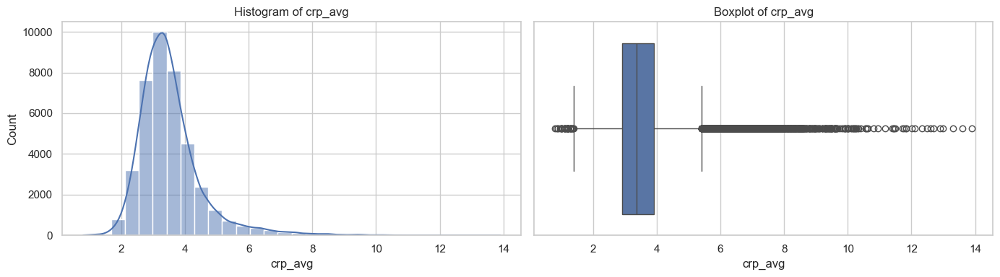


=== lactate_max ===
Summary statistics:
count    24481.000000
mean         3.047427
std          2.896244
min          0.300000
25%          1.400000
50%          2.200000
75%          3.400000
max         36.000000
Name: lactate_max, dtype: float64

Top 5 values:
       lactate_max
16801         36.0
37459         32.0
20812         29.7
14073         29.6
2174          29.3

Bottom 5 values:
       lactate_max
29542          0.3
12818          0.3
19159          0.4
6537           0.4
3287           0.4


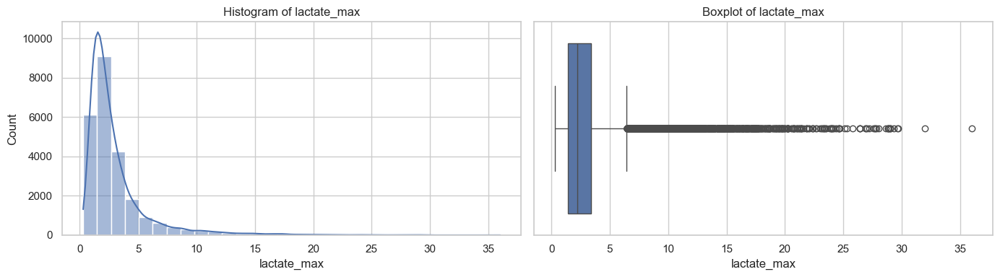


=== lactate_avg ===
Summary statistics:
count    24481.000000
mean         2.109285
std          1.671961
min          0.300000
25%          1.240000
50%          1.700000
75%          2.367647
max         26.150000
Name: lactate_avg, dtype: float64

Top 5 values:
       lactate_avg
2174     26.150000
16651    24.691667
14251    24.300000
8956     24.100000
21262    22.085417

Bottom 5 values:
       lactate_avg
29542         0.30
12818         0.30
29605         0.38
3287          0.40
30707         0.40


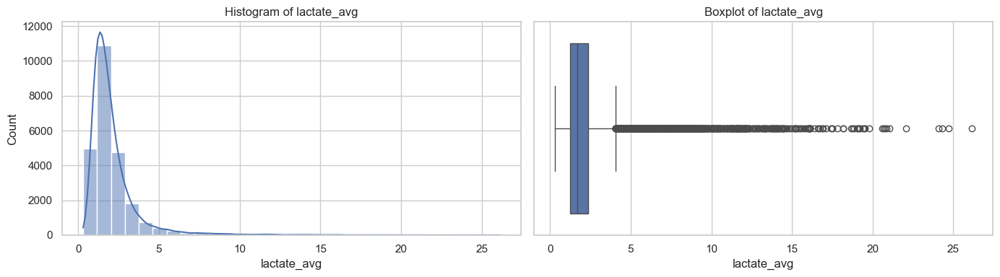


=== ace_arb_flag ===
Summary statistics:
count    43539.000000
mean         0.298215
std          0.457480
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: ace_arb_flag, dtype: float64

Top 5 values:
       ace_arb_flag
34281             1
14223             1
33134             1
14194             1
14196             1

Bottom 5 values:
       ace_arb_flag
0                 0
26042             0
26040             0
26039             0
26035             0


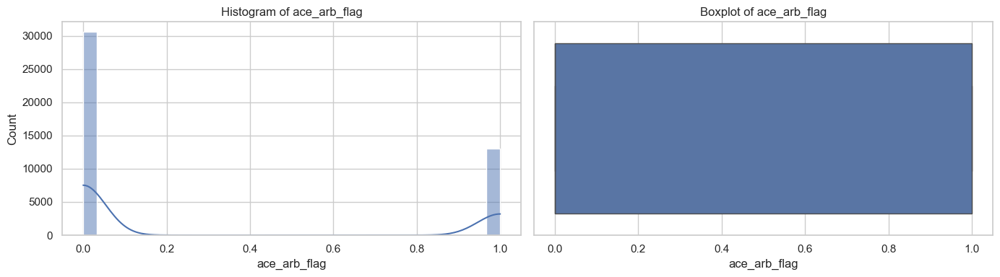


=== beta_blocker_flag ===
Summary statistics:
count    43539.000000
mean         0.630561
std          0.482658
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: beta_blocker_flag, dtype: float64

Top 5 values:
       beta_blocker_flag
21770                  1
26003                  1
26023                  1
26020                  1
26019                  1

Bottom 5 values:
       beta_blocker_flag
0                      0
15418                  0
15417                  0
34301                  0
15415                  0


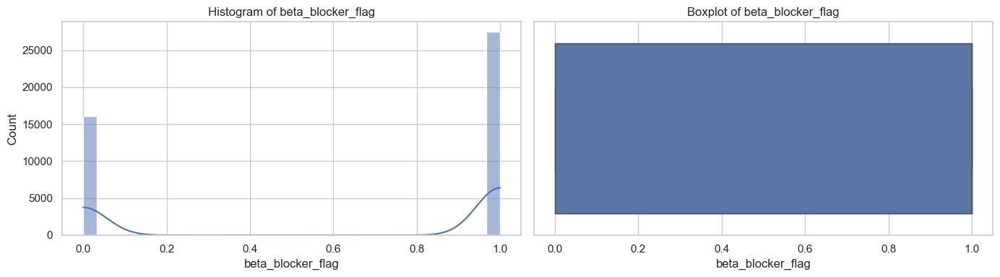


=== diuretic_med_flag ===
Summary statistics:
count    43539.000000
mean         0.518547
std          0.499662
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: diuretic_med_flag, dtype: float64

Top 5 values:
       diuretic_med_flag
21770                  1
18342                  1
18355                  1
34270                  1
34268                  1

Bottom 5 values:
       diuretic_med_flag
0                      0
23209                  0
23207                  0
23206                  0
23205                  0


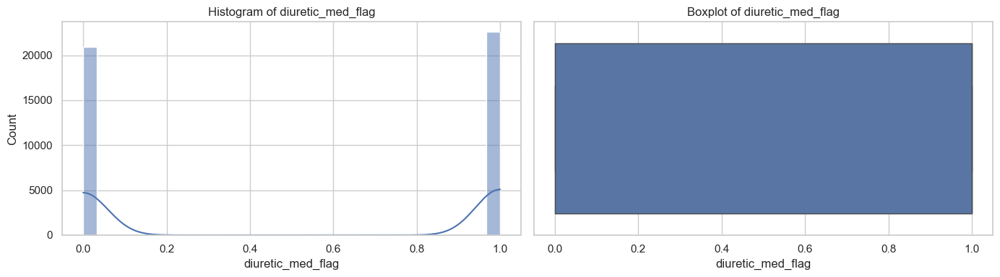


=== anticoagulant_flag ===
Summary statistics:
count    43539.000000
mean         0.747215
std          0.434614
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: anticoagulant_flag, dtype: float64

Top 5 values:
       anticoagulant_flag
21770                   1
28024                   1
28015                   1
28017                   1
28018                   1

Bottom 5 values:
       anticoagulant_flag
0                       0
34751                   0
13295                   0
34749                   0
34746                   0


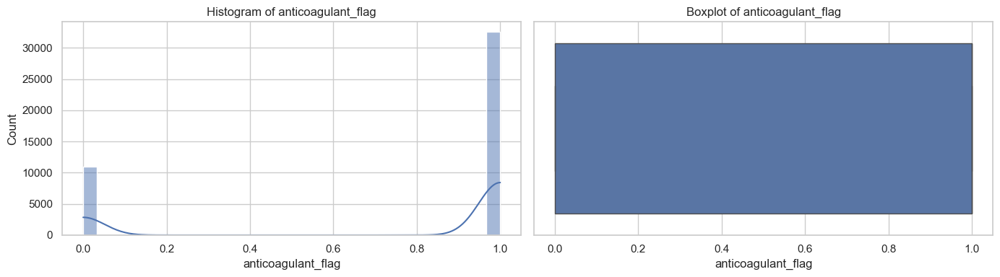


=== antiplatelet_flag ===
Summary statistics:
count    43539.000000
mean         0.504835
std          0.499982
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: antiplatelet_flag, dtype: float64

Top 5 values:
       antiplatelet_flag
21770                  1
18139                  1
34150                  1
34152                  1
18136                  1

Bottom 5 values:
       antiplatelet_flag
0                      0
23596                  0
23590                  0
23592                  0
23591                  0


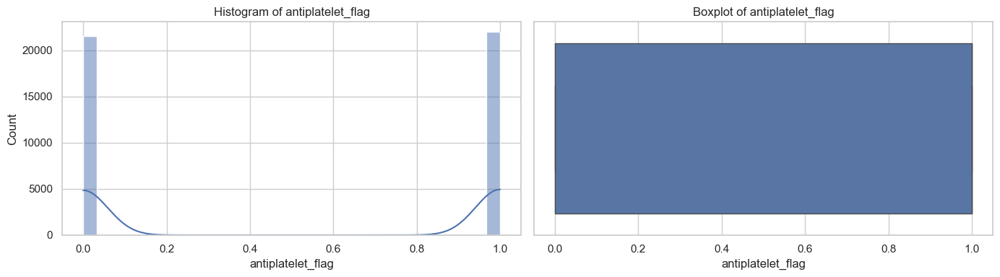


=== statin_flag ===
Summary statistics:
count    43539.000000
mean         0.434208
std          0.495658
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: statin_flag, dtype: float64

Top 5 values:
       statin_flag
21770            1
32839            1
33231            1
16770            1
33232            1

Bottom 5 values:
       statin_flag
0                0
23944            0
23942            0
23940            0
23937            0


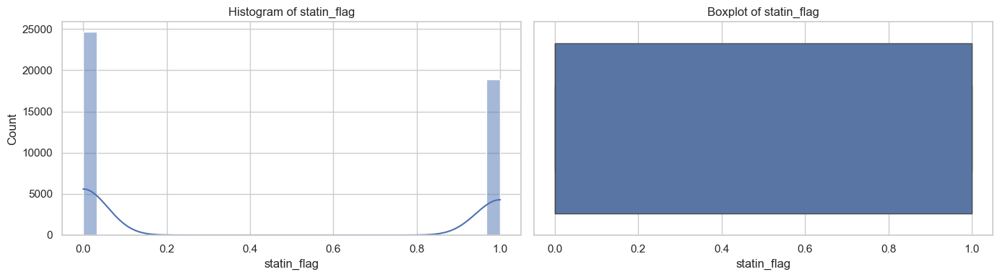


=== digoxin_flag ===
Summary statistics:
count    43539.000000
mean         0.070374
std          0.255779
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: digoxin_flag, dtype: float64

Top 5 values:
       digoxin_flag
22607             1
38227             1
27196             1
38238             1
27192             1

Bottom 5 values:
       digoxin_flag
0                 0
28557             0
28559             0
28560             0
28561             0


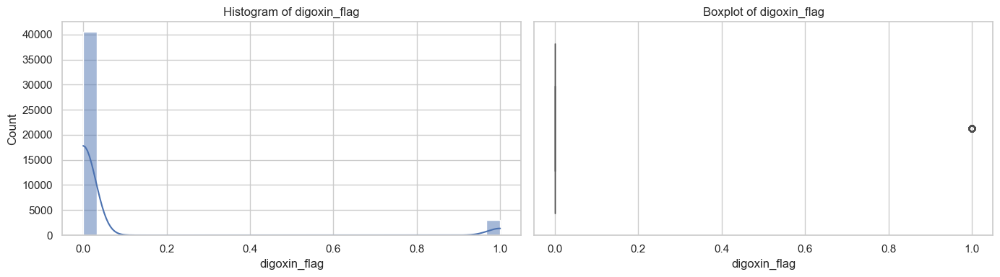


=== ventilation_flag ===
Summary statistics:
count    43539.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: ventilation_flag, dtype: float64

Top 5 values:
       ventilation_flag
0                     0
29030                 0
29022                 0
29024                 0
29023                 0

Bottom 5 values:
       ventilation_flag
0                     0
29022                 0
29024                 0
29023                 0
29025                 0


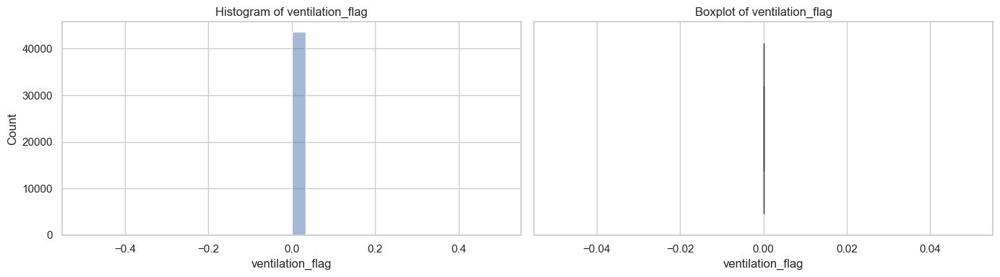


=== vasopressor_flag ===
Summary statistics:
count    43539.000000
mean         0.147477
std          0.354585
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: vasopressor_flag, dtype: float64

Top 5 values:
       vasopressor_flag
32772                 1
16708                 1
35466                 1
35465                 1
35460                 1

Bottom 5 values:
       vasopressor_flag
0                     0
25258                 0
25261                 0
25262                 0
25263                 0


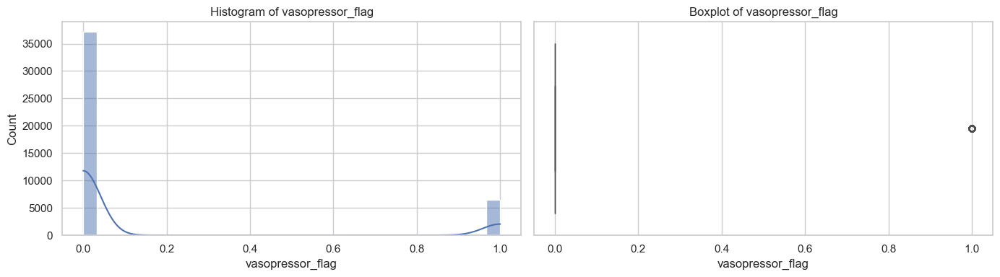


=== diuretic_admin_flag ===
Summary statistics:
count    43539.000000
mean         0.158502
std          0.365215
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: diuretic_admin_flag, dtype: float64

Top 5 values:
       diuretic_admin_flag
32677                    1
24918                    1
32854                    1
32855                    1
38915                    1

Bottom 5 values:
       diuretic_admin_flag
0                        0
25036                    0
25041                    0
25042                    0
25043                    0


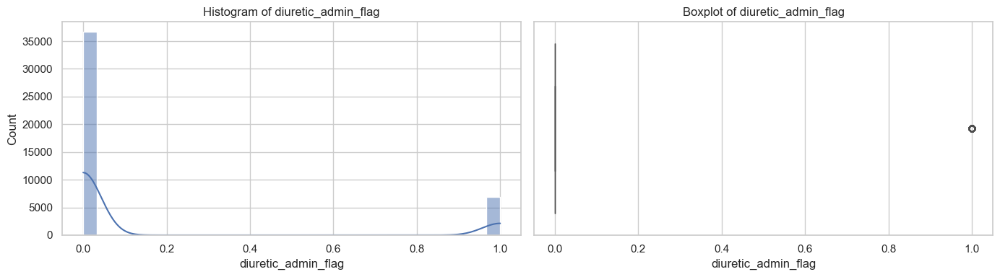


=== dialysis_flag ===
Summary statistics:
count    43539.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: dialysis_flag, dtype: float64

Top 5 values:
       dialysis_flag
0                  0
29030              0
29022              0
29024              0
29023              0

Bottom 5 values:
       dialysis_flag
0                  0
29022              0
29024              0
29023              0
29025              0


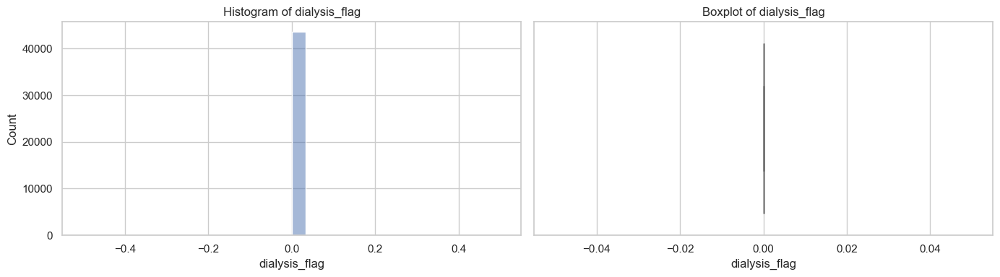


=== readmitted_30d ===
Summary statistics:
count    43539.000000
mean         0.062082
std          0.241308
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: readmitted_30d, dtype: float64

Top 5 values:
       readmitted_30d
30198               1
41207               1
26815               1
24510               1
24511               1

Bottom 5 values:
       readmitted_30d
0                   0
28584               0
28585               0
28587               0
28588               0


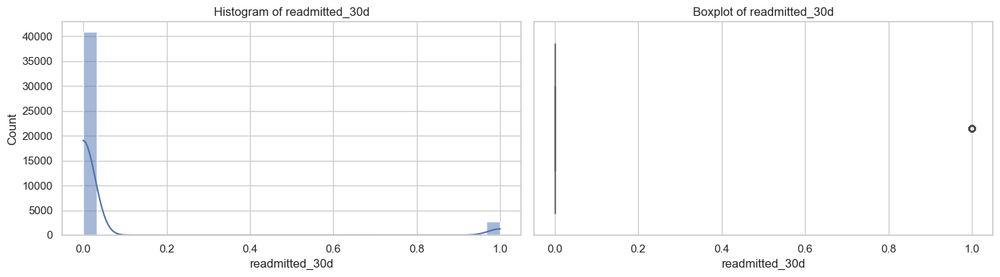


=== time_to_event ===
Summary statistics:
count    43539.000000
mean        28.883713
std          4.860879
min          0.000000
25%         30.000000
50%         30.000000
75%         30.000000
max         30.000000
Name: time_to_event, dtype: float64

Top 5 values:
       time_to_event
0                 30
28588             30
28591             30
28592             30
28590             30

Bottom 5 values:
       time_to_event
38770              0
34669              0
8643               0
35282              0
21083              0


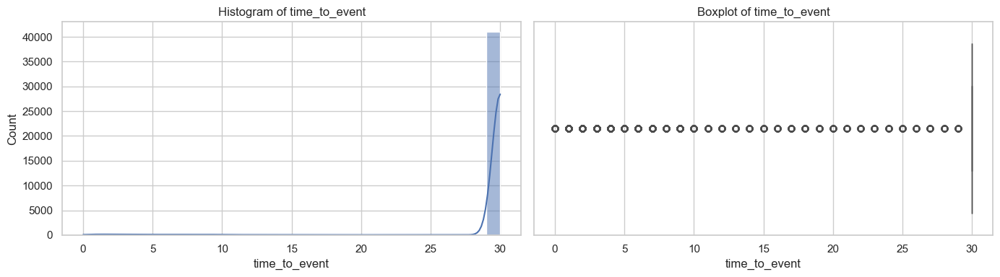

In [57]:
# Check for some impossible values.
for col in num_cols:
    print(f"\n=== {col} ===")
    print("Summary statistics:")
    print(df1[col].describe())

    # Show top 5 and bottom 5 values
    print("\nTop 5 values:")
    print(df1[[col]].sort_values(by=col, ascending=False).head())

    print("\nBottom 5 values:")
    print(df1[[col]].sort_values(by=col, ascending=True).head())

    # Plot distribution and boxplot
    plt.figure(figsize=(14, 4))

    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(df1[col], kde=True, bins=30)
    plt.title(f"Histogram of {col}")

    # Boxplot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df1[col].dropna())
    plt.title(f"Boxplot of {col}")

    plt.tight_layout()
    plt.show()


In [58]:
# Filter out rows with age > 100
df2 = df1[df1['age'] <= 100]

In [59]:
df2.head()

,hadm_id,age,gender,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,cvd_category,readmitted_30d,time_to_event,ethnicity_recode
0,145834,76,1,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,0.0,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,0,0,0,0,0,0,0,0,0,0,0,Ischemic Heart Disease,0,30,White
1,107064,66,0,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.235294,8.4,12.5,10.421053,21.0,17.941176,110.0,105.117647,3.3,2.392308,8.6,7.653846,4.4,5.5,4.911765,3.1,2.875,8.5,4.392857,3.9,2.640000,0,1,1,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30,White
2,150750,41,1,Medicaid,EMERGENCY,1,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,5,1,0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,111.0,86.047872,14.0,24.0,16.367021,90.0,100.0,97.270408,NaN,NaN,NaN,263.0,263.0,263.0,1.4,2.0,1.783333,17.0,33.0,23.833333,10.0,14.0,12.500000,11.5,13.1,12.685714,26.0,23.166667,107.0,101.666667,3.0,2.287500,9.7,8.700000,3.0,3.8,3.366667,3.0,2.950,5.3,3.700000,2.7,1.987500,1,1,0,0,0,0,0,0,0,0,0,Cerebrovascular Disease,0,30,Unknown
3,112213,72,1,Medicare,ELECTIVE,5,PHYS REFERRAL/NORMAL DELI,DEAD/EXPIRED,13,1,0,NaN,NaN,NaN,NaN,NaN,NaN,70.0,113.0,87.669767,8.0,42.0,22.511628,94.0,100.0,97.470046,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.7,1.164286,28.0,41.0,32.214286,9.0,28.0,13.800000,11.0,13.7,12.128571,30.0,23.333333,114.0,105.600000,2.9,2.061111,9.7,8.521429,3.2,5.3,4.072222,2.5,2.325,6.6,3.413333,15.1,5.222222,0,1,0,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30,White
4,143045,40,0,Medicaid,EMERGENCY,5,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,7,1,0,NaN,NaN,NaN,NaN,NaN,NaN,60.0,130.0,98.017241,5.0,32.0,17.646552,94.0,100.0,98.592920,NaN,NaN,NaN,224.0,224.0,224.0,0.4,0.8,0.580000,13.0,22.0,16.200000,8.0,14.0,11.000000,8.6,12.3,10.022222,31.0,27.777778,110.0,104.555556,2.4,1.788889,9.1,8.900000,3.5,4.7,4.300000,3.9,3.900,4.8,4.216667,NaN,NaN,0,1,1,1,1,1,0,0,0,0,0,Ischemic Heart Disease,0,30,White


In [60]:
# I'll cap these vitals as follows. 

# Define valid ranges for each variable group
valid_ranges = {
    'sbp': (5, 300),
    'dbp': (5, 250),
    'heart_rate': (20, 300),
    'resp_rate': (5,50),
    'spo2':(20,100),
    'temp':(50,120)    
}

# Loop through the columns and apply filtering
for col in ['sbp_min', 'sbp_max', 'sbp_avg',
            'dbp_min', 'dbp_max', 'dbp_avg',
            'heart_rate_min', 'heart_rate_max', 'heart_rate_avg',
           'resp_rate_min', 'resp_rate_max', 'resp_rate_avg',
            'spo2_min', 'spo2_max', 'spo2_avg',
           'temp_min', 'temp_max', 'temp_avg']:
    
    if col.startswith('sbp'):
        lower, upper = valid_ranges['sbp']
    elif col.startswith('dbp'):
        lower, upper = valid_ranges['dbp']
    elif col.startswith('heart_rate'):
        lower, upper = valid_ranges['heart_rate']
    elif col.startswith('resp_rate'):
        lower, upper = valid_ranges['resp_rate']
    elif col.startswith('spo2'):
        lower, upper = valid_ranges['spo2']
    elif col.startswith('temp'):
        lower, upper = valid_ranges['temp']
        
    else:
        continue
    
    # Replace out-of-range values with NaN
    df2.loc[:, col] = df2[col].where(df2[col].between(lower, upper), np.nan)


In [61]:
# For labs, I will just use clipping and predefined conservative cut. 

# Predefined lab bounds dictionary
lab_bounds = {
    'bnp': {'lower': 0, 'upper': 30000},
    'creatinine': {'lower': 0.1, 'upper': 20},
    'bun': {'lower': 1, 'upper': 200},
    'hemoglobin': {'lower': 3, 'upper': 30},   # After checking plot changed upper value from 20 to 30
    'hematocrit': {'lower': 5, 'upper': 60},   # After checking plot changed lower to 5 from 10
    'potassium': {'lower': 10.0, 'upper': 40.0}, # Changed later (may be in differnt scale) 
    'sodium': {'lower': 90, 'upper': 160},     # Sodium lower changed from 120 to 90
    'magnesium': {'lower': 0.5, 'upper': 6.0},
    'calcium': {'lower': 5.0, 'upper': 15.0},
    'glucose': {'lower': 1, 'upper': 10},      # Changed later (may be in differnt scale)
    'albumin': {'lower': 1.0, 'upper': 6.0},
    'crp': {'lower': 0, 'upper': 500},
    'lactate': {'lower': 0.5, 'upper': 20.0},
}

# Common suffixes for lab value aggregation
suffixes = ['_min', '_max', '_avg']

# Set this to True if we want to track which rows were outliers
add_outlier_flags = True

# Loop through each lab and suffix
for lab, bounds in lab_bounds.items():
    for suffix in suffixes:
        col_name = f"{lab}_{suffix}"
        if col_name in df2.columns:
            if add_outlier_flags:
                flag_col = f"{col_name}_outlier_flag"
                df2[flag_col] = ~df2[col_name].between(bounds['lower'], bounds['upper'])
            
            # Cap the values within the specified bounds
            df2[col_name] = df2[col_name].clip(lower=bounds['lower'], upper=bounds['upper'])


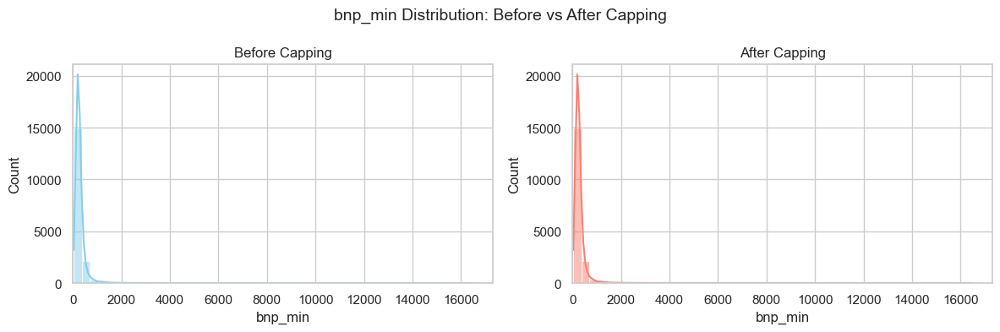

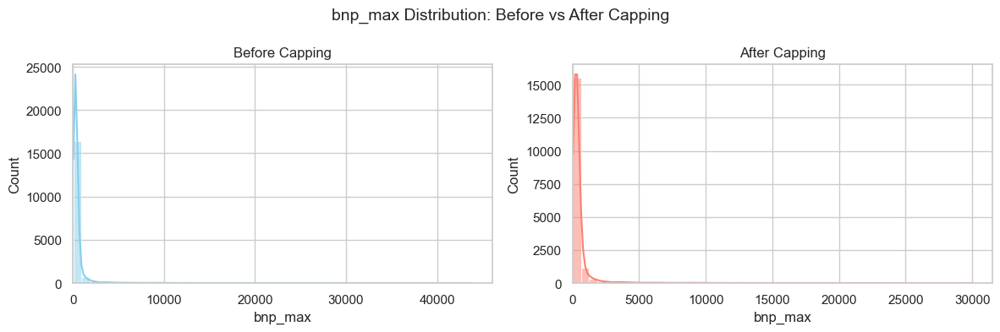

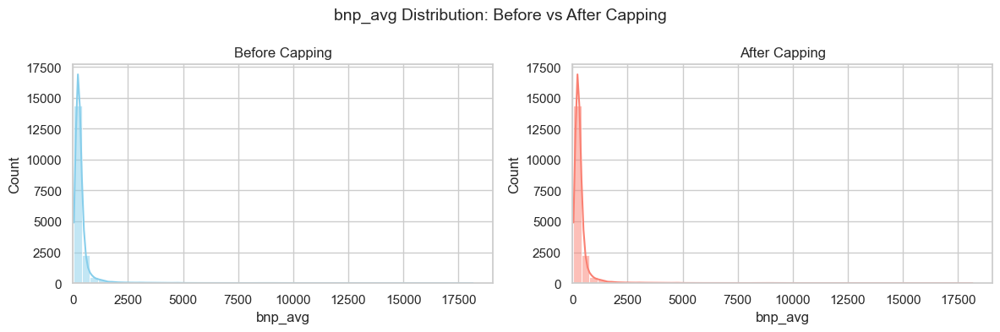

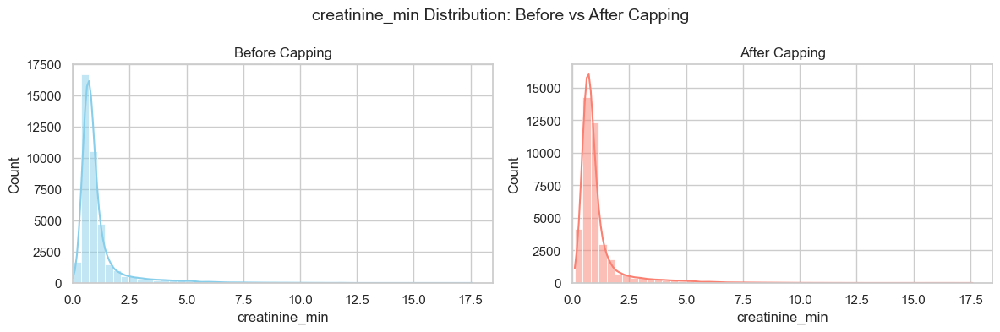

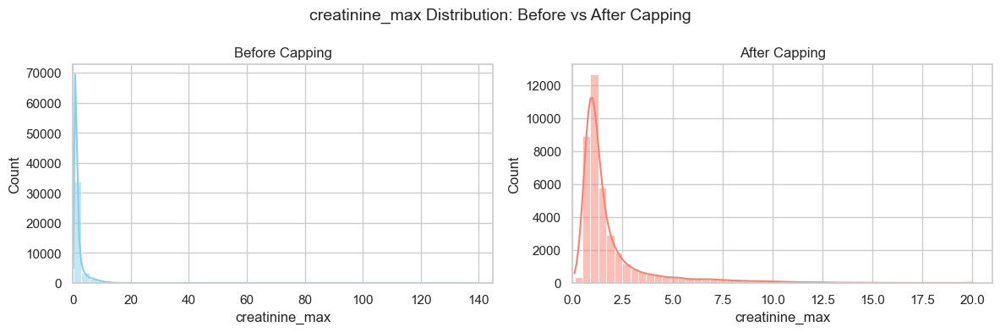

...

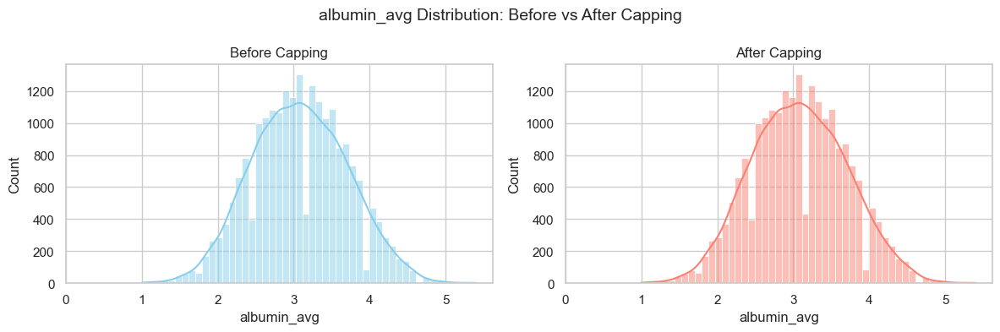

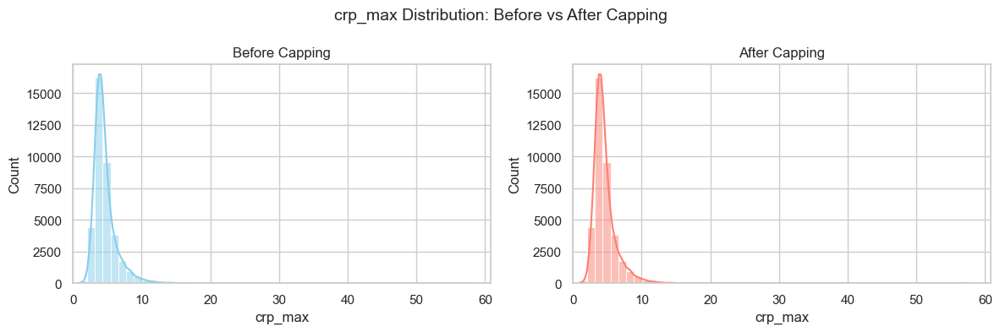

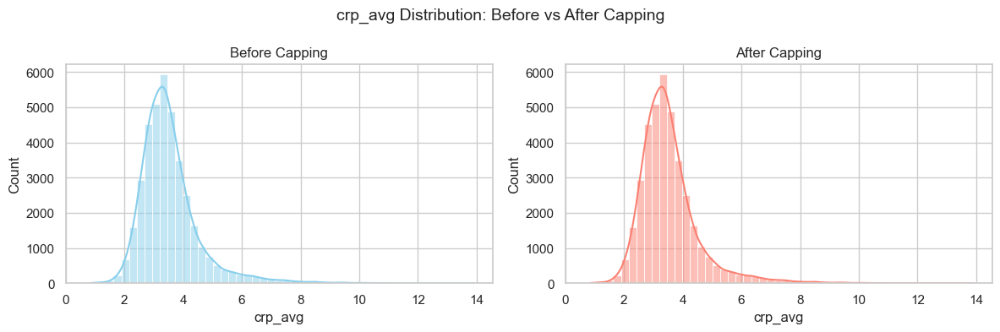

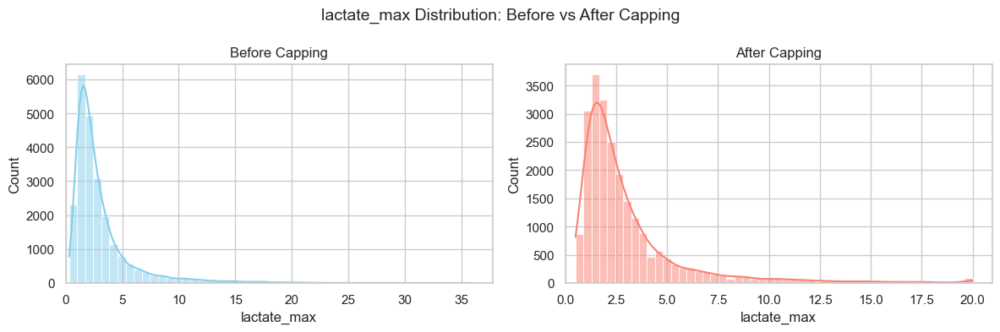

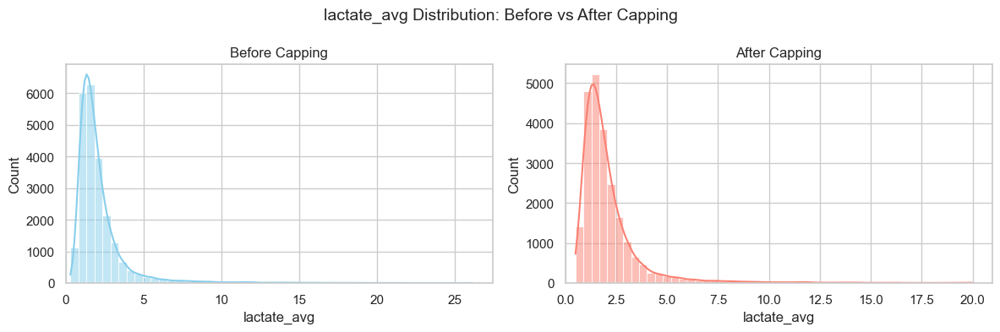

In [62]:
# Check plots before capping and after capping

for lab in lab_bounds.keys():
    for suffix in ['min', 'max', 'avg']:
        col = f"{lab}_{suffix}"
        if col in df2.columns:
            fig, axes = plt.subplots(1, 2, figsize=(12, 4))
            fig.suptitle(f"{col} Distribution: Before vs After Capping", fontsize=14)

            # Plot original
            sns.histplot(df2[col], kde=True, ax=axes[0], bins=50, color='skyblue')
            axes[0].set_title("Before Capping")
            axes[0].set_xlim(left=0)

            # Plot after clipping
            capped_col = df2[col].clip(
                lower=lab_bounds[lab]['lower'],
                upper=lab_bounds[lab]['upper']
            )
            sns.histplot(capped_col, kde=True, ax=axes[1], bins=50, color='salmon')
            axes[1].set_title("After Capping")
            axes[1].set_xlim(left=0)

            plt.tight_layout()
            plt.show()


In [63]:
# Copy df2
df3 = df2.copy()

## Univariate Analysis

To look at the distribution of each variable, basic patterns. 

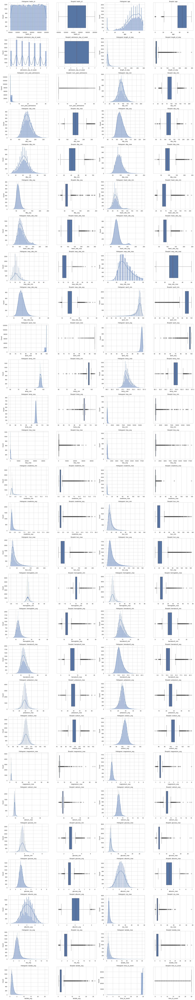

In [64]:
# Univariate analysis Numerical variable

# Select numeric columns (excluding binary if needed)
num_cols = df3.select_dtypes(include='number').columns.tolist()

# Remove binary-like variables (0/1) if not of interest
num_cols = [col for col in num_cols if df3[col].nunique() > 2]

# Plot settings
n = len(num_cols)
plots_per_row = 4  # 2 features per row (each has hist+box)
rows = (n + 1) // 2

fig, axes = plt.subplots(rows, plots_per_row, figsize=(22, 4 * rows))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    # Histogram
    sns.histplot(df3[col].dropna(), kde=True, ax=axes[i * 2])
    axes[i * 2].set_title(f'Histogram: {col}')
    
    # Boxplot
    sns.boxplot(x=df3[col].dropna(), ax=axes[i * 2 + 1], orient='h')
    axes[i * 2 + 1].set_title(f'Boxplot: {col}')

# Remove unused axes
for j in range(i * 2 + 2, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


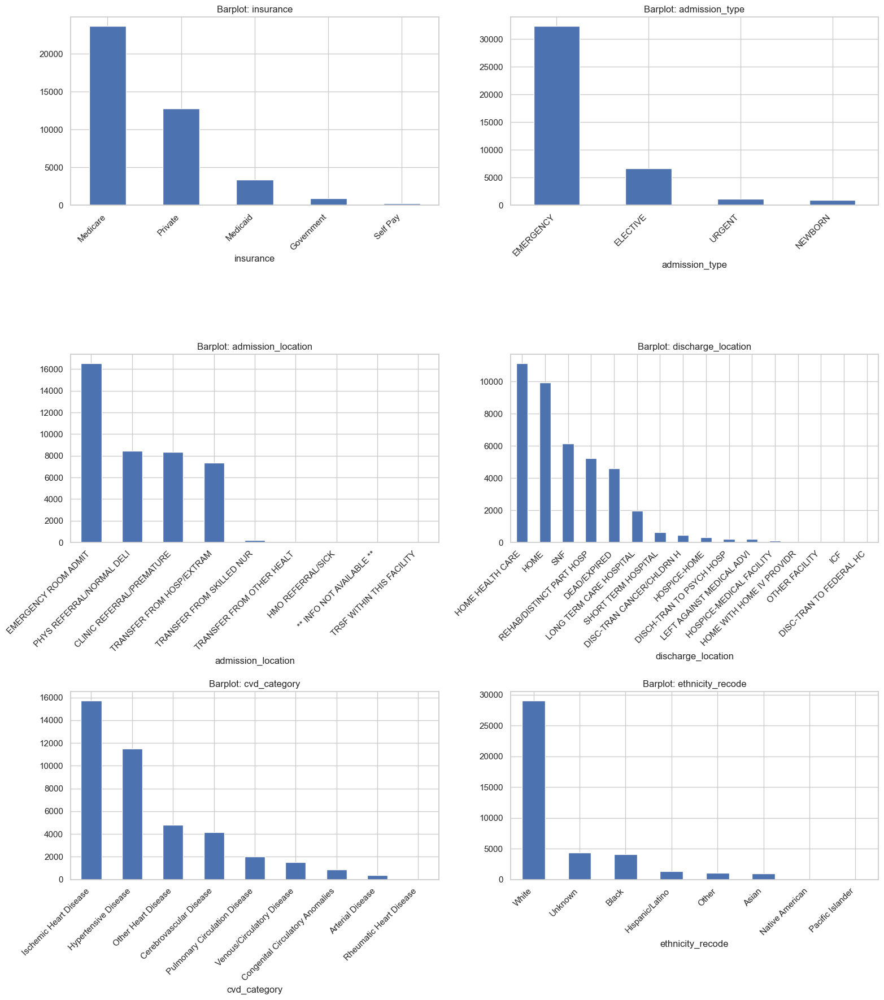

In [65]:
# Univariate analysis Categorical variable

# Identify categorical columns (object or category dtype)
# Modified to include both 'object' and 'category' dtypes, as categorical data is often stored as 'object' type
cat_cols = df3.select_dtypes(include=['object', 'category']).columns.tolist()

# Check if there are any categorical columns before plotting
if len(cat_cols) > 0:
    # Plot settings
    cols_per_row = 2
    n = len(cat_cols)
    rows = (n + cols_per_row - 1) // cols_per_row
    
    fig, axes = plt.subplots(rows, cols_per_row, figsize=(16, 6 * rows))
    axes = axes.flatten()
    
    for i, col in enumerate(cat_cols):
        df3[col].dropna().value_counts().plot(kind='bar', ax=axes[i])
        axes[i].set_title(f'Barplot: {col}')
        axes[i].tick_params(axis='x', rotation=45)
        
        # Align long rotated labels
        for label in axes[i].get_xticklabels():
            label.set_horizontalalignment('right')
    
    # Hide unused axes
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout(pad=1.5)
    plt.show()
else:
    print("No categorical columns found in the dataframe. Check your data types.")

## Bivariate Analysis

To check relationship with the target variable. 

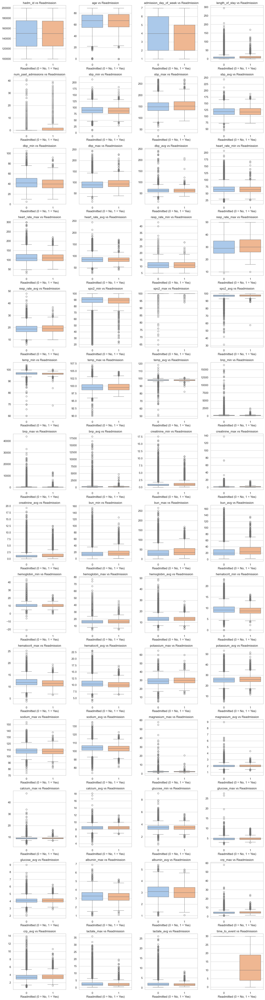

In [66]:
# Identify numeric columns
numeric_cols = df3.select_dtypes(include='number').columns.tolist()

# Exclude target variable and binary variable from loop
numeric_cols = [col for col in numeric_cols if col != 'readmitted_30d' and df3[col].nunique() > 2]

# Plot settings
n = len(numeric_cols)
cols_per_row = 4
rows = (n + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(rows, cols_per_row, figsize=(15, 4 * rows))
axes = axes.flatten()

for i, col in enumerate(numeric_cols):
    sns.boxplot(data=df3, x='readmitted_30d', y=col, palette = 'pastel', hue = 'readmitted_30d', ax=axes[i], legend=False)
    axes[i].set_title(f'{col} vs Readmission')
    axes[i].set_xlabel('Readmitted (0 = No, 1 = Yes)')
    axes[i].set_ylabel('') # Hide y-label

# Remove extra axes if any
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

Readmission Rate by Categorical Features (Mean of readmitted_30d):


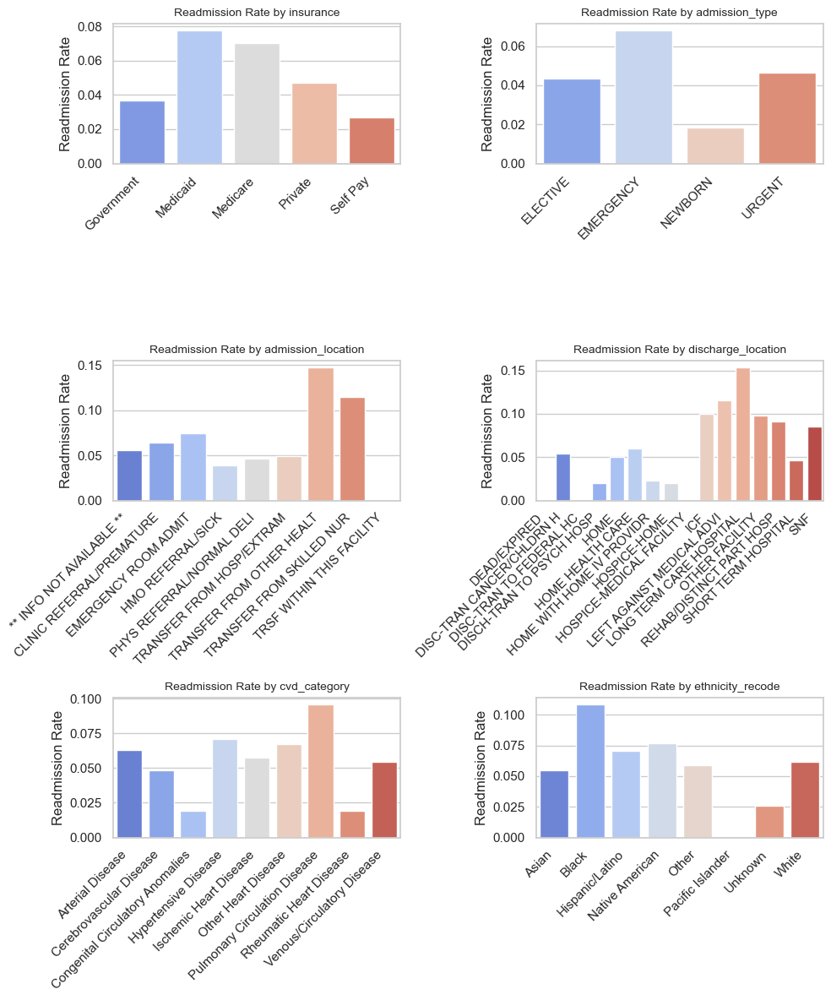


Crosstabulations (Row Percentages) for Categorical Features vs. Readmission:

--- insurance vs. readmitted_30d ---


readmitted_30d,0,1
insurance,,
Government,96.323529,3.676471
Medicaid,92.213967,7.786033
Medicare,92.982827,7.017173
Private,95.306154,4.693846
Self Pay,97.328244,2.671756
All,93.750152,6.249848



--- admission_type vs. readmitted_30d ---


readmitted_30d,0,1
admission_type,,
ELECTIVE,95.645623,4.354377
EMERGENCY,93.177460,6.822540
NEWBORN,98.181818,1.818182
URGENT,95.352994,4.647006
All,93.750152,6.249848



--- admission_location vs. readmitted_30d ---


readmitted_30d,0,1
admission_location,,
** INFO NOT AVAILABLE **,94.444444,5.555556
CLINIC REFERRAL/PREMATURE,93.585901,6.414099
EMERGENCY ROOM ADMIT,92.525228,7.474772
HMO REFERRAL/SICK,96.153846,3.846154
PHYS REFERRAL/NORMAL DELI,95.340333,4.659667
TRANSFER FROM HOSP/EXTRAM,95.053004,4.946996
TRANSFER FROM OTHER HEALT,85.245902,14.754098
TRANSFER FROM SKILLED NUR,88.541667,11.458333
TRSF WITHIN THIS FACILITY,100.000000,0.000000



--- discharge_location vs. readmitted_30d ---


readmitted_30d,0,1
discharge_location,,
DEAD/EXPIRED,99.956578,0.043422
DISC-TRAN CANCER/CHLDRN H,94.557823,5.442177
DISC-TRAN TO FEDERAL HC,100.000000,0.000000
DISCH-TRAN TO PSYCH HOSP,98.029557,1.970443
HOME,95.010562,4.989438
HOME HEALTH CARE,93.971249,6.028751
HOME WITH HOME IV PROVIDR,97.727273,2.272727
HOSPICE-HOME,98.006645,1.993355
HOSPICE-MEDICAL FACILITY,100.000000,0.000000



--- cvd_category vs. readmitted_30d ---


readmitted_30d,0,1
cvd_category,,
Arterial Disease,93.698630,6.301370
Cerebrovascular Disease,95.143063,4.856937
Congenital Circulatory Anomalies,98.089888,1.910112
Hypertensive Disease,92.894371,7.105629
Ischemic Heart Disease,94.247984,5.752016
Other Heart Disease,93.265007,6.734993
Pulmonary Circulation Disease,90.395198,9.604802
Rheumatic Heart Disease,98.076923,1.923077
Venous/Circulatory Disease,94.525066,5.474934



--- ethnicity_recode vs. readmitted_30d ---


readmitted_30d,0,1
ethnicity_recode,,
Asian,94.537815,5.462185
Black,89.137303,10.862697
Hispanic/Latino,92.955701,7.044299
Native American,92.307692,7.692308
Other,94.101382,5.898618
Pacific Islander,100.000000,0.000000
Unknown,97.392498,2.607502
White,93.853347,6.146653
All,93.750152,6.249848


In [67]:
#  Bivariate Analysis - Categorical Features vs. Target ---

print("Readmission Rate by Categorical Features (Mean of readmitted_30d):")

target = 'readmitted_30d'

# Use the updated categorical_cols list which might include ethnicity_recoded
n_bivar_cat_plots = len(cat_cols)

# Check if cat_cols is not empty before creating plots
if n_bivar_cat_plots > 0:
    n_cols = 2
    n_rows = (n_bivar_cat_plots + n_cols - 1) // n_cols
    
    # Ensure n_rows is at least 1
    n_rows = max(1, n_rows)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4))
    axes = axes.flatten() if n_rows * n_cols > 1 else [axes]  # Handle single subplot case
    
    for i, col in enumerate(cat_cols):
        sns.barplot(data=df3, x=col, y=target, palette='coolwarm', hue=col, errorbar=None, ax=axes[i], legend=False)
        axes[i].set_title(f'Readmission Rate by {col}', fontsize=10)
        axes[i].set_xlabel('')
        axes[i].set_ylabel('Readmission Rate')
        axes[i].tick_params(axis='x', rotation=45)
    
        # Align long rotated labels
        for label in axes[i].get_xticklabels():
            label.set_horizontalalignment('right')
    
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()
else:
    print("No categorical columns to plot.")

print("\nCrosstabulations (Row Percentages) for Categorical Features vs. Readmission:")
for col in cat_cols:
    print(f"\n--- {col} vs. {target} ---")
    crosstab_df = pd.crosstab(df3[col], df3[target], margins=True, normalize='index') * 100
    display(crosstab_df)

## Multivariate Analysis

To check the complex relationship among variables. For this, I am using PCA anslysis and correlational analysis. 

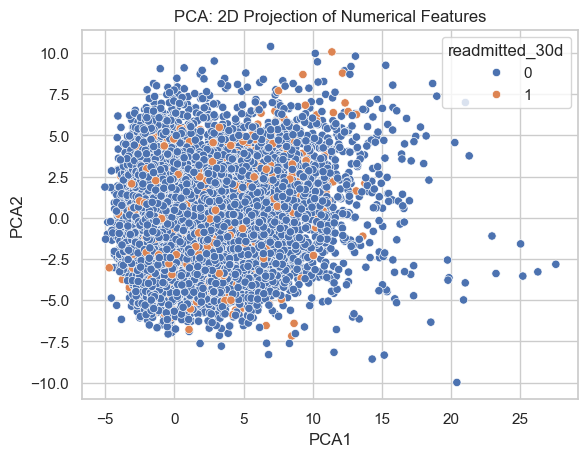

In [68]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer 

# First, handle missing values using SimpleImputer
imputer = SimpleImputer(strategy='median')  # You can choose 'mean', 'median', 'most_frequent', or a constant value
X_imputed = imputer.fit_transform(df3[numeric_cols])

# Then scale the data
X_scaled = StandardScaler().fit_transform(X_imputed)

# Now apply PCA on the cleaned data
pca = PCA(n_components=2)
components = pca.fit_transform(X_scaled)

# Add PCA components to the dataframe
df3['PCA1'] = components[:, 0]
df3['PCA2'] = components[:, 1]

# Create the scatter plot
sns.scatterplot(data=df3, x='PCA1', y='PCA2', hue=target)
plt.title("PCA: 2D Projection of Numerical Features")
plt.show()

I don't see much separation between the target variables. 

In [69]:
df3.head() # To check PCA columns. 

,hadm_id,age,gender,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_max,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_min,heart_rate_max,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_min,bnp_max,bnp_avg,creatinine_min,creatinine_max,creatinine_avg,bun_min,bun_max,bun_avg,hemoglobin_min,hemoglobin_max,hemoglobin_avg,hematocrit_min,hematocrit_max,hematocrit_avg,potassium_max,potassium_avg,sodium_max,sodium_avg,magnesium_max,magnesium_avg,calcium_max,calcium_avg,glucose_min,glucose_max,glucose_avg,albumin_max,albumin_avg,crp_max,crp_avg,lactate_max,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,cvd_category,readmitted_30d,time_to_event,ethnicity_recode,PCA1,PCA2
0,145834,76,1,Medicare,EMERGENCY,5,EMERGENCY ROOM ADMIT,SNF,11,1,0,NaN,NaN,NaN,NaN,NaN,NaN,64.0,168.0,92.360947,NaN,36.0,16.993902,74.0,100.0,97.220859,NaN,NaN,NaN,NaN,NaN,NaN,1.3,2.5,1.728571,15.0,43.0,26.357143,9.0,23.0,15.133333,7.8,11.5,9.978571,25.0,18.533333,112.0,107.750000,3.5,2.076471,8.2,7.460000,3.4,4.9,4.033333,1.8,1.800,5.6,3.360000,8.8,3.545455,0,0,0,0,0,0,0,0,0,0,0,Ischemic Heart Disease,0,30,White,2.159639,-3.907081
1,107064,66,0,Medicare,ELECTIVE,3,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,16,1,0,NaN,NaN,NaN,NaN,NaN,NaN,71.0,104.0,86.549451,8.0,26.0,14.131868,84.0,100.0,97.764045,NaN,NaN,NaN,NaN,NaN,NaN,0.8,11.7,3.741176,16.0,91.0,53.941176,10.0,23.0,16.235294,8.4,12.5,10.421053,21.0,17.941176,110.0,105.117647,3.3,2.392308,8.6,7.653846,4.4,5.5,4.911765,3.1,2.875,8.5,4.392857,3.9,2.640000,0,1,1,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30,White,5.214288,-0.166375
2,150750,41,1,Medicaid,EMERGENCY,1,EMERGENCY ROOM ADMIT,DEAD/EXPIRED,5,1,0,NaN,NaN,NaN,NaN,NaN,NaN,73.0,111.0,86.047872,14.0,24.0,16.367021,90.0,100.0,97.270408,NaN,NaN,NaN,263.0,263.0,263.0,1.4,2.0,1.783333,17.0,33.0,23.833333,10.0,14.0,12.500000,11.5,13.1,12.685714,26.0,23.166667,107.0,101.666667,3.0,2.287500,9.7,8.700000,3.0,3.8,3.366667,3.0,2.950,5.3,3.700000,2.7,1.987500,1,1,0,0,0,0,0,0,0,0,0,Cerebrovascular Disease,0,30,Unknown,-0.635585,1.076933
3,112213,72,1,Medicare,ELECTIVE,5,PHYS REFERRAL/NORMAL DELI,DEAD/EXPIRED,13,1,0,NaN,NaN,NaN,NaN,NaN,NaN,70.0,113.0,87.669767,8.0,42.0,22.511628,94.0,100.0,97.470046,NaN,NaN,NaN,NaN,NaN,NaN,0.9,1.7,1.164286,28.0,41.0,32.214286,9.0,28.0,13.800000,11.0,13.7,12.128571,30.0,23.333333,114.0,105.600000,2.9,2.061111,9.7,8.521429,3.2,5.3,4.072222,2.5,2.325,6.6,3.413333,15.1,5.222222,0,1,0,1,0,0,0,0,0,0,0,Hypertensive Disease,0,30,White,2.549888,-2.126086
4,143045,40,0,Medicaid,EMERGENCY,5,TRANSFER FROM HOSP/EXTRAM,HOME HEALTH CARE,7,1,0,NaN,NaN,NaN,NaN,NaN,NaN,60.0,130.0,98.017241,5.0,32.0,17.646552,94.0,100.0,98.592920,NaN,NaN,NaN,224.0,224.0,224.0,0.4,0.8,0.580000,13.0,22.0,16.200000,8.0,14.0,11.000000,8.6,12.3,10.022222,31.0,27.777778,110.0,104.555556,2.4,1.788889,9.1,8.900000,3.5,4.7,4.300000,3.9,3.900,4.8,4.216667,NaN,NaN,0,1,1,1,1,1,0,0,0,0,0,Ischemic Heart Disease,0,30,White,-1.583407,0.307274


In [70]:
df3 = df3.drop(columns = ['PCA1', 'PCA2'])  # Now df3 is unchagned. 

In [71]:
# Correlation analysis 
# Since I have a number of min, average, max values, Let's see if I can drop any. 
# I will drop binary for this analysis 

cor = df3[numeric_cols].corr()  # numeric_cols from previous modification

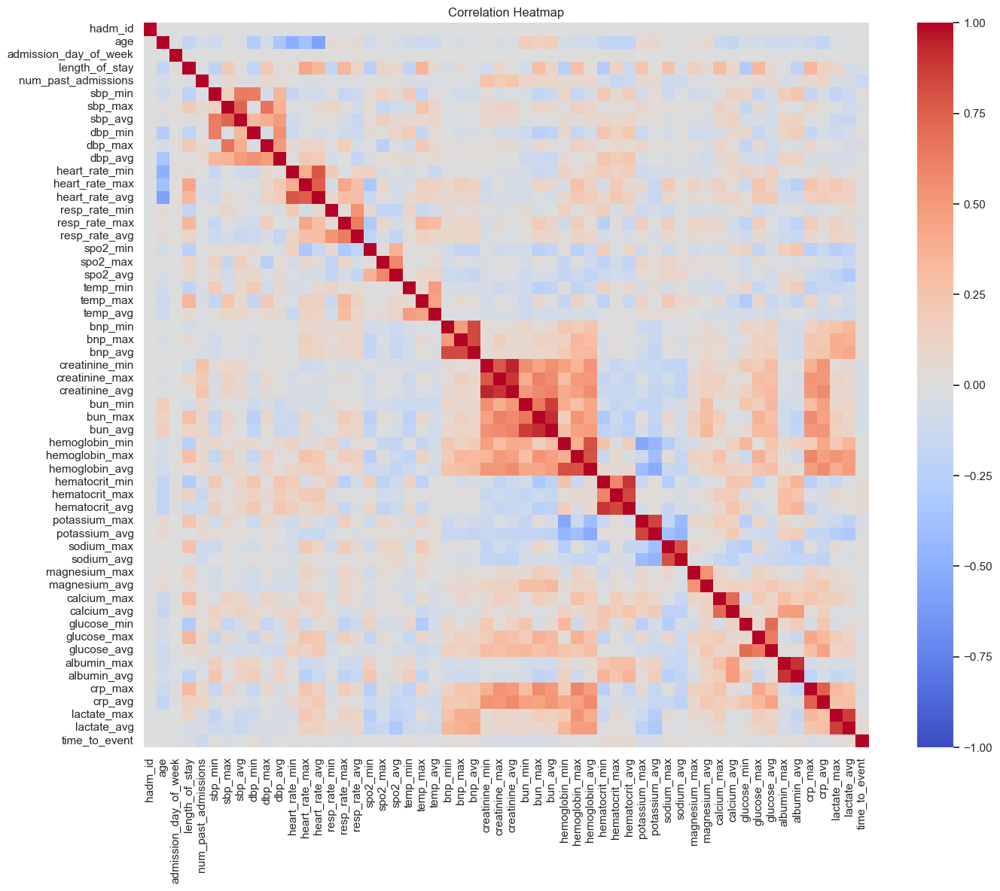

In [72]:
# Correlation heatmap plot
plt.figure(figsize = (15,12))
sns.heatmap(cor, annot=False, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, square=True)
plt.title("Correlation Heatmap")

# Show the plot
plt.tight_layout()
plt.show()

In [73]:
# Compute correlation matrix for numeric columns
corr_matrix = df3[numeric_cols].corr().abs()

# Select upper triangle of correlation matrix (to avoid duplicates)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find feature pairs with correlation > 0.6  
high_corr_pairs = (
    upper.stack()
    .reset_index()
    .rename(columns={0: 'correlation', 'level_0': 'feature_1', 'level_1': 'feature_2'})
    .query('correlation > 0.60')
    .sort_values(by='correlation', ascending=False)
)

print(high_corr_pairs)

           feature_1       feature_2  correlation
1106  creatinine_min  creatinine_avg     0.943986
1215         bun_max         bun_avg     0.920030
1519     albumin_max     albumin_avg     0.905864
1134  creatinine_max  creatinine_avg     0.895307
1331  hematocrit_min  hematocrit_avg     0.895200
1537     lactate_max     lactate_avg     0.871744
1190         bun_min         bun_avg     0.868990
1387   potassium_max   potassium_avg     0.850054
1350  hematocrit_max  hematocrit_avg     0.838312
1044         bnp_max         bnp_avg     0.835500
1013         bnp_min         bnp_avg     0.831182
1265  hemoglobin_min  hemoglobin_avg     0.807195
1420      sodium_max      sodium_avg     0.804989
1287  hemoglobin_max  hemoglobin_avg     0.796927
551   heart_rate_min  heart_rate_avg     0.784097
1105  creatinine_min  creatinine_max     0.774124
594   heart_rate_max  heart_rate_avg     0.753831
1530         crp_max         crp_avg     0.744216
315          sbp_max         sbp_avg     0.733986


In [74]:
# I will drop these highly correlated features to prevent multicollinearity. 
col_to_drop = high_corr_pairs.query('correlation >= 0.7')['feature_1'].tolist()

In [75]:
df4 = df3.drop(columns=col_to_drop)

In [76]:
df4 = df4.drop(columns=['hadm_id'])

In [77]:
df4['discharge_location'].value_counts()

discharge_location
HOME HEALTH CARE             11130
HOME                          9941
SNF                           6147
REHAB/DISTINCT PART HOSP      5219
DEAD/EXPIRED                  4606
LONG TERM CARE HOSPITAL       1955
SHORT TERM HOSPITAL            642
DISC-TRAN CANCER/CHLDRN H      441
HOSPICE-HOME                   301
DISCH-TRAN TO PSYCH HOSP       203
LEFT AGAINST MEDICAL ADVI      199
HOSPICE-MEDICAL FACILITY       117
HOME WITH HOME IV PROVIDR       44
OTHER FACILITY                  41
ICF                             30
DISC-TRAN TO FEDERAL HC          9
Name: count, dtype: int64

In [78]:
# Remove Dead/Expired. Initially I had it so that I can model for this dead/expired.

df4 = df4[df4['discharge_location'] != 'DEAD/EXPIRED'].copy()

In [79]:
df4.shape

(36419, 55)

In [80]:
# Redefine
numeric_cols = df4.select_dtypes(include='number').columns.tolist()
# Exclude target variable from loop
numeric_cols = [col for col in numeric_cols if col != 'readmitted_30d' and df4[col].nunique() > 2]

In [81]:
cor_drop = df4[numeric_cols].corr()

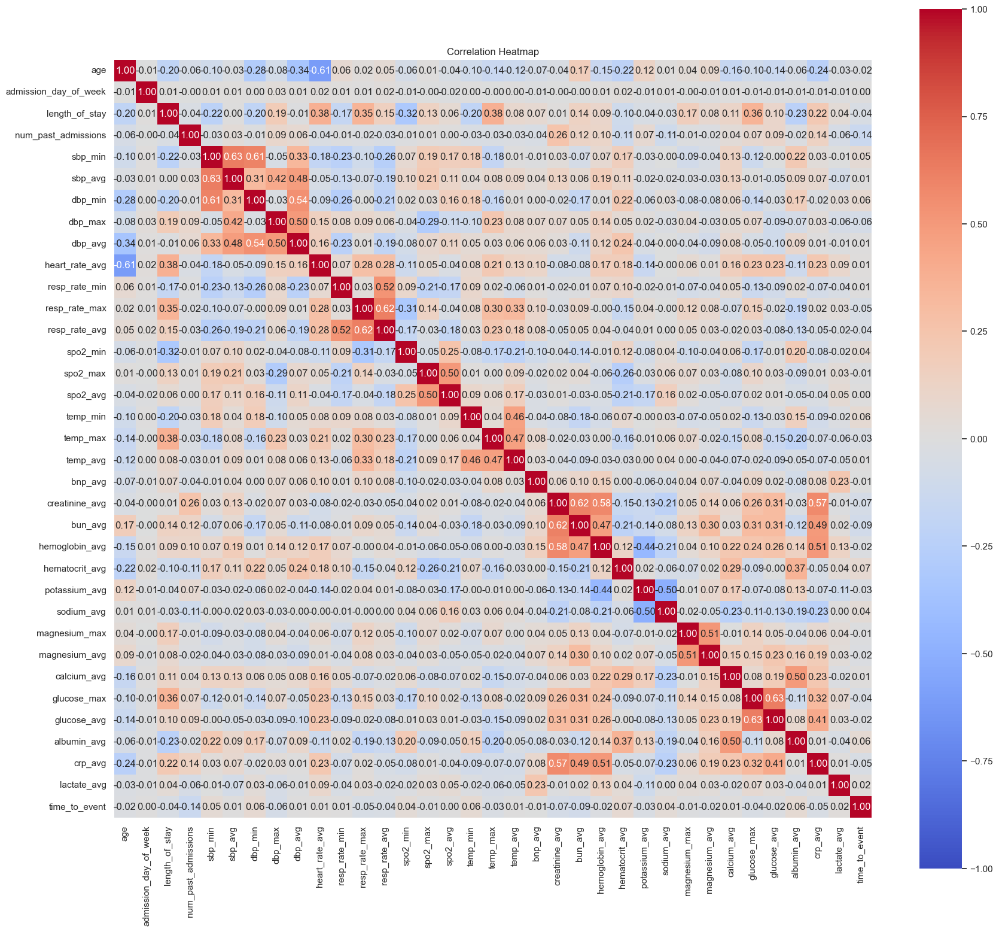

In [82]:
# Correlation heatmap plot
plt.figure(figsize = (18,16))
sns.heatmap(cor_drop, annot=True, fmt=".2f", cmap='coolwarm', vmin=-1, vmax=1, square=True)
plt.title("Correlation Heatmap")

# Show the plot
plt.tight_layout()
plt.show()

In [83]:
# Check correlation with the target.
num_cols = df4.select_dtypes(include='number').columns.tolist() #include binary as well.

In [84]:
# Make sure target is numeric (0/1)
target_corr = df4[num_cols].corr()['readmitted_30d'].sort_values(ascending=False)
print(target_corr)

# This helps to identify features that are most associated with the outcome. 

readmitted_30d           1.000000
num_past_admissions      0.169732
bun_avg                  0.095384
creatinine_avg           0.082376
dbp_max                  0.063928
crp_avg                  0.052768
anticoagulant_flag       0.049668
resp_rate_max            0.048398
glucose_max              0.043974
resp_rate_avg            0.040916
potassium_avg            0.038226
length_of_stay           0.037360
digoxin_flag             0.033486
diuretic_med_flag        0.032639
diuretic_admin_flag      0.031920
temp_max                 0.027077
age                      0.023467
glucose_avg              0.022334
hemoglobin_avg           0.022265
vasopressor_flag         0.021010
spo2_max                 0.016194
magnesium_max            0.014416
beta_blocker_flag        0.013390
magnesium_avg            0.011871
bnp_avg                  0.007772
ace_arb_flag             0.005905
antiplatelet_flag        0.004341
spo2_avg                 0.002781
gender                   0.002686
statin_flag   

# Machine Learning Models

In [85]:
import warnings
warnings.filterwarnings('ignore') 
#I picked general warnings. If necessary I can do categories such as , warnings.filterwarnings("ignore", category=UserWarning)

In [86]:
# Separate survival data before defining X and y for classification 
# This DataFrame will hold the data needed for Kaplan-Meier curves later.
# It's crucial that its index aligns with the main DataFrame's index.
survival_data_full = df4.copy()

# Rename for clarity in survival analysis if desired
survival_data_full.rename(columns={'readmitted_30d': 'event_occurred'}, inplace=True)
survival_data_full['event_occurred'] = survival_data_full['event_occurred'].astype(bool) # lifelines expects boolean

In [87]:
# Split data into features and target

X = df4.drop(columns=['readmitted_30d', 'time_to_event'])    # time_to_event is not a feature, it's for Kaplan Myer's curve generation.
y = df4['readmitted_30d']

In [88]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=36)

# I have performed splitting before imputation to prevent data leakage. Also used stratify to make sure 
# I get same fraction of target.

print(f"\nShape of X_train (features for ML model): {X_train.shape}")
print(f"Shape of X_test (features for ML model): {X_test.shape}")


Shape of X_train (features for ML model): (29135, 53)
Shape of X_test (features for ML model): (7284, 53)


In [89]:
# Split the survival data using the same indices to ensure alignment
survival_data_train = survival_data_full.loc[X_train.index].copy()
survival_data_test = survival_data_full.loc[X_test.index].copy()

print(f"Shape of survival_data_train: {survival_data_train.shape}")
print(f"Shape of survival_data_test: {survival_data_test.shape}")

Shape of survival_data_train: (29135, 55)
Shape of survival_data_test: (7284, 55)


In [90]:
# This is to impute with median value. I used different imputation later. 

"""# Columns with <10% missing, imputed using median (no flag column). Median used since only numerical columns have missingness. 
# Columns with ≥10% missing, imputed using median, plus a binary flag column indicating where values were missing. 
from sklearn.impute import SimpleImputer

def impute_numeric_with_flags(df, threshold=0.10):
    df = df.copy()
    
    # Identify numeric columns only
    numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
    # Categorical column has no missing values. Otherwise, I'll have to deal with it using different settings. 
    
    # Compute missing value percentage for numeric columns
    null_percent = df[numeric_cols].isnull().mean()
    
    # Identify columns with <10% and >=10% missing
    low_null_cols = null_percent[null_percent < threshold].index.tolist()
    high_null_cols = null_percent[null_percent >= threshold].index.tolist()
    
    # Impute low-null numeric columns with median (no flag)
    if low_null_cols:
        imputer = SimpleImputer(strategy='median')
        df[low_null_cols] = imputer.fit_transform(df[low_null_cols])
    
    # Impute high-null numeric columns with median and add flag
    for col in high_null_cols:
        if df[col].isnull().any():
            df[f"{col}_was_missing"] = df[col].isnull().astype(int)
            median_val = df[col].median()
            df[col] = df[col].fillna(median_val)

    return df"""

'# Columns with <10% missing, imputed using median (no flag column). Median used since only numerical columns have missingness. \n# Columns with ≥10% missing, imputed using median, plus a binary flag column indicating where values were missing. \nfrom sklearn.impute import SimpleImputer\n\ndef impute_numeric_with_flags(df, threshold=0.10):\n    df = df.copy()\n    \n    # Identify numeric columns only\n    numeric_cols = df.select_dtypes(include=[\'number\']).columns.tolist()\n    # Categorical column has no missing values. Otherwise, I\'ll have to deal with it using different settings. \n    \n    # Compute missing value percentage for numeric columns\n    null_percent = df[numeric_cols].isnull().mean()\n    \n    # Identify columns with <10% and >=10% missing\n    low_null_cols = null_percent[null_percent < threshold].index.tolist()\n    high_null_cols = null_percent[null_percent >= threshold].index.tolist()\n    \n    # Impute low-null numeric columns with median (no flag)\n    if l

In [91]:
"""X_train_imp = impute_numeric_with_flags(X_train)  
X_test_imp = impute_numeric_with_flags(X_test)"""

'X_train_imp = impute_numeric_with_flags(X_train)  \nX_test_imp = impute_numeric_with_flags(X_test)'

In [92]:
from sklearn.preprocessing import OneHotEncoder

# Identify categorical columns
cat_cols = X.select_dtypes(include=['category']).columns # lets define again anyway

# Fit encoder on train only
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False,  drop='first')    # drop first to avoid multicollinearity
encoder.fit(X_train[cat_cols])

# Transform train and test
X_train_encoded = encoder.transform(X_train[cat_cols])
X_test_encoded = encoder.transform(X_test[cat_cols])

# Get new column names
encoded_col_names = encoder.get_feature_names_out(cat_cols)

# Turn into DataFrames
X_train_cat = pd.DataFrame(X_train_encoded, columns=encoded_col_names, index=X_train.index)
X_test_cat = pd.DataFrame(X_test_encoded, columns=encoded_col_names, index=X_test.index)

# Drop original categorical columns and concatenate
X_train_fin = pd.concat([X_train.drop(columns=cat_cols), X_train_cat], axis=1)
X_test_fin = pd.concat([X_test.drop(columns=cat_cols), X_test_cat], axis=1)

In [93]:
# Selective Scaling for X_train_fin and X_test_fin. 
# Identify continuous numerical columns to scale.
# This explicitly excludes one-hot encoded columns (which are typically 0s and 1s) and any other non-continuous numerical columns 
# that I might have. I will only scale columns that are NOT binary (0 or 1).

cols_to_scale = []

for col in X_train_fin.select_dtypes(include=np.number).columns:
    if not X_train_fin[col].isin([0, 1]).all():
        cols_to_scale.append(col)


# Columns that will NOT be scaled (includes one-hot encoded, subject_id, etc. if still in X)
cols_not_scaled = [col for col in X_train_fin.columns if col not in cols_to_scale]

In [94]:
X_train_fin[cols_to_scale]

,age,admission_day_of_week,length_of_stay,num_past_admissions,sbp_min,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_avg,creatinine_avg,bun_avg,hemoglobin_avg,hematocrit_avg,potassium_avg,sodium_avg,magnesium_max,magnesium_avg,calcium_avg,glucose_max,glucose_avg,albumin_avg,crp_avg,lactate_avg
38070,82,2,3,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.475000,23.500000,12.500000,10.575000,25.000000,103.250000,2.4,1.950000,8.100000,4.1,3.800000,NaN,3.550000,1.000000
14773,68,2,7,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5100,62,2,7,1,NaN,NaN,NaN,NaN,NaN,70.835052,11.0,24.0,16.329897,94.0,100.0,97.747368,NaN,NaN,NaN,217.00,1.508333,24.250000,15.500000,10.700000,24.833333,90.833333,1.9,1.587500,8.600000,5.1,3.991667,NaN,3.211111,NaN
40205,76,2,7,0,83.0,102.375000,46.0,74.0,58.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,97.0,98.7,97.666667,NaN,0.922222,24.333333,12.375000,10.216667,23.888889,105.222222,2.3,2.180000,NaN,5.6,4.390909,NaN,NaN,3.000000
27002,69,6,24,0,116.0,149.761538,29.0,109.0,62.092308,NaN,NaN,NaN,NaN,NaN,NaN,NaN,95.8,101.7,98.093571,239.75,6.154054,50.459459,17.500000,8.154054,23.275000,101.650000,2.7,2.074286,7.942857,5.3,4.250000,2.733333,4.417143,0.971429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5814,65,2,14,0,NaN,NaN,NaN,NaN,NaN,87.188679,12.0,23.0,15.415094,78.0,100.0,96.538462,NaN,NaN,NaN,288.00,0.606667,18.533333,10.900000,10.018750,28.769231,102.076923,2.8,1.960000,7.966667,4.1,3.908333,2.750000,2.975000,NaN
13205,0,5,7,0,NaN,NaN,NaN,NaN,NaN,126.226667,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,14.000000,20.000000,15.500000,22.000000,102.500000,1.7,1.700000,8.500000,5.1,4.900000,NaN,5.400000,NaN
16389,0,2,3,0,NaN,NaN,NaN,NaN,NaN,117.434783,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.650000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2722,48,2,2,0,NaN,NaN,NaN,NaN,NaN,93.600000,10.0,22.0,15.400000,98.0,100.0,99.133333,NaN,NaN,NaN,NaN,0.950000,14.500000,10.500000,10.000000,24.500000,107.500000,2.0,1.750000,8.200000,3.9,3.600000,NaN,2.900000,NaN


In [95]:
# Used pipeline to impute and scale

from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
# Create a preprocessing pipeline for imputation and scaling
# This ensures that imputation and scaling are applied correctly and without data leakage.
# KNNImputer should be applied *before* StandardScaler if you want distances to be meaningful.
preprocessing_pipeline = Pipeline([
    ('imputer', KNNImputer(n_neighbors=5)), # ADDED: KNNImputer
    ('scaler', StandardScaler()) # StandardScaler will be applied to all numerical features after imputation
])

In [96]:
# Fit and transform training data
X_train_processed = preprocessing_pipeline.fit_transform(X_train_fin[cols_to_scale])
X_train_processed = pd.DataFrame(X_train_processed, columns=cols_to_scale, index=X_train_fin.index)

# Transform test data using the fitted pipeline
X_test_processed = preprocessing_pipeline.transform(X_test_fin[cols_to_scale])
X_test_processed = pd.DataFrame(X_test_processed, columns=cols_to_scale, index=X_test_fin.index)

# Recombine processed continuous features with non-scaled columns (one-hot encoded features)
X_train_final = pd.concat([X_train_processed, X_train_fin[cols_not_scaled]], axis=1)
X_test_final = pd.concat([X_test_processed, X_test_fin[cols_not_scaled]], axis=1)

# Ensure column order is consistent
X_train_final_df = X_train_final[X_train_fin.columns]
X_test_final_df = X_test_final[X_test_fin.columns]

In [97]:
X_train_final_df.head()

,age,gender,admission_day_of_week,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_avg,creatinine_avg,bun_avg,hemoglobin_avg,hematocrit_avg,potassium_avg,sodium_avg,magnesium_max,magnesium_avg,calcium_avg,glucose_max,glucose_avg,albumin_avg,crp_avg,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,insurance_Medicaid,insurance_Medicare,insurance_Private,insurance_Self Pay,admission_type_EMERGENCY,admission_type_NEWBORN,admission_type_URGENT,admission_location_CLINIC REFERRAL/PREMATURE,admission_location_EMERGENCY ROOM ADMIT,admission_location_HMO REFERRAL/SICK,admission_location_PHYS REFERRAL/NORMAL DELI,admission_location_TRANSFER FROM HOSP/EXTRAM,admission_location_TRANSFER FROM OTHER HEALT,admission_location_TRANSFER FROM SKILLED NUR,admission_location_TRSF WITHIN THIS FACILITY,discharge_location_DISC-TRAN TO FEDERAL HC,discharge_location_DISCH-TRAN TO PSYCH HOSP,discharge_location_HOME,discharge_location_HOME HEALTH CARE,discharge_location_HOME WITH HOME IV PROVIDR,discharge_location_HOSPICE-HOME,discharge_location_HOSPICE-MEDICAL FACILITY,discharge_location_ICF,discharge_location_LEFT AGAINST MEDICAL ADVI,discharge_location_LONG TERM CARE HOSPITAL,discharge_location_OTHER FACILITY,discharge_location_REHAB/DISTINCT PART HOSP,discharge_location_SHORT TERM HOSPITAL,discharge_location_SNF,cvd_category_Cerebrovascular Disease,cvd_category_Congenital Circulatory Anomalies,cvd_category_Hypertensive Disease,cvd_category_Ischemic Heart Disease,cvd_category_Other Heart Disease,cvd_category_Pulmonary Circulation Disease,cvd_category_Rheumatic Heart Disease,cvd_category_Venous/Circulatory Disease,ethnicity_recode_Black,ethnicity_recode_Hispanic/Latino,ethnicity_recode_Native American,ethnicity_recode_Other,ethnicity_recode_Pacific Islander,ethnicity_recode_Unknown,ethnicity_recode_White
38070,1.050649,1,-1.049534,-0.626917,0,-0.317596,0.917190,1.084784,0.075587,-0.399110,-0.072325,-0.617751,0.754780,-0.400313,-0.030347,0.080776,0.418873,0.193629,0.448598,-0.009598,0.247681,-0.408273,0.068213,-0.044694,-0.289710,-0.101728,-0.224567,-0.148865,0.019851,-0.327250,-0.687417,-0.873269,-0.826709,0.492867,0.048336,-1.038536,0,1,0,1,1,1,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14773,0.264275,1,-1.049534,-0.305087,1,-0.317596,0.328760,0.282843,0.494807,-0.519182,-0.244128,0.189877,-0.245611,-0.608596,-0.257819,-0.181974,0.418873,-1.150250,0.180521,-0.541127,0.307524,-0.640399,-0.142845,-0.122968,0.328343,0.178393,-0.006839,-0.015086,-0.083554,0.377693,0.038883,0.011318,0.400389,0.690491,-0.041260,0.144664,0,0,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5100,-0.072742,0,-1.049534,-0.305087,1,0.267492,-0.154054,-0.542039,0.275215,-1.311663,-0.738751,-0.923005,-0.078879,-0.990450,-0.923856,0.632550,0.418873,0.402217,-0.273146,-0.781172,-0.543718,-0.374591,0.091085,0.000422,0.949149,-0.029158,-0.271361,-2.990634,-0.626433,-1.737784,0.155484,0.322119,-0.332777,0.334768,-0.307482,0.146697,1,0,1,1,1,0,0,0,0,0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
40205,0.713632,1,-1.049534,-0.305087,1,-0.317596,-0.682132,-1.481074,0.295178,-1.035495,-0.543280,-0.698344,-0.495709,-0.226743,-0.525457,0.396075,0.054557,0.401161,0.263006,-0.866902,-0.422865,-0.507951,-0.311078,0.005435,-0.341329,-0.309763,-0.536530,0.302512,-0.109405,0.567710,-0.305904,0.91981

Removing features with high Variance Inflation factor (VIF)

In [98]:
# Binary columns (numeric with only 0,1 or object with only 2 unique values)
binary_cols=[col for col in X_train_final_df.columns 
if X_train_final_df[col].nunique() == 2 and 
(X_train_final_df[col].dtype in ['int64', 'float64'] or X_train_final_df[col].dtype == 'object')]

In [99]:
constant_columns = [col for col in X_train_final_df.columns if X_train_final_df[col].var() == 0]
if constant_columns:
    print(f"\nWarning: Removing constant columns before VIF calculation: {constant_columns}")
    X_train_vif = X_train_final_df.drop(columns=constant_columns)
else:
    X_train_vif = X_train_final_df.copy()

In [100]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Prepare a DataFrame to store VIF values
vif_data = pd.DataFrame()
vif_data["feature"] = X_train_vif.columns
vif_data["VIF"] = [variance_inflation_factor(X_train_vif.values, i)
                   for i in range(X_train_vif.shape[1])]

In [101]:
# Sort by VIF in descending order
vif_data = vif_data.sort_values(by="VIF", ascending=False).reset_index(drop=True)

In [102]:
print(vif_data)

                                          feature         VIF
0         admission_location_EMERGENCY ROOM ADMIT  121.906387
1    admission_location_PHYS REFERRAL/NORMAL DELI   64.667690
2    admission_location_CLINIC REFERRAL/PREMATURE   63.727367
3    admission_location_TRANSFER FROM HOSP/EXTRAM   55.890548
4                                        icu_stay   50.680893
5             cvd_category_Ischemic Heart Disease   43.495716
6                          ethnicity_recode_White   32.566022
7               cvd_category_Hypertensive Disease   31.561234
8             discharge_location_HOME HEALTH CARE   29.255680
9                              insurance_Medicare   26.529245
10                        discharge_location_HOME   25.994894
11                       admission_type_EMERGENCY   24.399937
12                         discharge_location_SNF   16.491091
13                              insurance_Private   14.408764
14    discharge_location_REHAB/DISTINCT PART HOSP   13.991787
15      

In [103]:
vif_threshold = 5  # Common threshold, some use 10

# Fix: Check if each feature is in binary_cols instead of direct comparison
high_vif_features = vif_data[(vif_data['VIF'] >= vif_threshold) & (~vif_data['feature'].isin(binary_cols))]['feature'].tolist()

In [104]:
high_vif_features

[]

In [105]:
if high_vif_features:
    X_train_reduced_vif = X_train_final_df.drop(columns=high_vif_features, errors='ignore')
    X_test_reduced_vif = X_test_final_df.drop(columns=high_vif_features, errors='ignore')
else:
    X_train_reduced_vif = X_train_final_df.copy()
    X_test_reduced_vif = X_test_final_df.copy()

In [106]:
X_test_reduced_vif.head(10)

,age,gender,admission_day_of_week,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_avg,creatinine_avg,bun_avg,hemoglobin_avg,hematocrit_avg,potassium_avg,sodium_avg,magnesium_max,magnesium_avg,calcium_avg,glucose_max,glucose_avg,albumin_avg,crp_avg,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,insurance_Medicaid,insurance_Medicare,insurance_Private,insurance_Self Pay,admission_type_EMERGENCY,admission_type_NEWBORN,admission_type_URGENT,admission_location_CLINIC REFERRAL/PREMATURE,admission_location_EMERGENCY ROOM ADMIT,admission_location_HMO REFERRAL/SICK,admission_location_PHYS REFERRAL/NORMAL DELI,admission_location_TRANSFER FROM HOSP/EXTRAM,admission_location_TRANSFER FROM OTHER HEALT,admission_location_TRANSFER FROM SKILLED NUR,admission_location_TRSF WITHIN THIS FACILITY,discharge_location_DISC-TRAN TO FEDERAL HC,discharge_location_DISCH-TRAN TO PSYCH HOSP,discharge_location_HOME,discharge_location_HOME HEALTH CARE,discharge_location_HOME WITH HOME IV PROVIDR,discharge_location_HOSPICE-HOME,discharge_location_HOSPICE-MEDICAL FACILITY,discharge_location_ICF,discharge_location_LEFT AGAINST MEDICAL ADVI,discharge_location_LONG TERM CARE HOSPITAL,discharge_location_OTHER FACILITY,discharge_location_REHAB/DISTINCT PART HOSP,discharge_location_SHORT TERM HOSPITAL,discharge_location_SNF,cvd_category_Cerebrovascular Disease,cvd_category_Congenital Circulatory Anomalies,cvd_category_Hypertensive Disease,cvd_category_Ischemic Heart Disease,cvd_category_Other Heart Disease,cvd_category_Pulmonary Circulation Disease,cvd_category_Rheumatic Heart Disease,cvd_category_Venous/Circulatory Disease,ethnicity_recode_Black,ethnicity_recode_Hispanic/Latino,ethnicity_recode_Native American,ethnicity_recode_Other,ethnicity_recode_Pacific Islander,ethnicity_recode_Unknown,ethnicity_recode_White
33879,-0.241250,1,0.580288,-0.546460,1,-0.317596,0.902102,1.167372,0.394992,0.165232,0.038544,-0.639162,0.004487,-1.094591,-0.972395,0.107051,-1.038392,-0.779640,-0.149419,-1.295555,-0.718211,3.862860,0.274060,0.861936,2.099517,1.364190,-1.548183,-0.349124,-0.109405,0.305059,-0.378353,0.322119,-0.021385,-1.009072,-0.249151,0.120268,0,1,1,1,1,1,0,0,0,0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
20863,0.825971,0,-1.049534,-0.546460,1,-0.317596,-0.078614,-0.932284,-0.483373,-0.711299,-0.756662,-0.494719,-1.329369,-0.643310,-0.895983,0.369800,0.418873,0.015195,0.098036,-0.986925,-0.517419,-0.387943,-0.326326,-0.535965,-0.496187,-0.164622,1.179268,-1.045262,-0.367919,-0.599629,0.200439,0.083042,0.290006,0.986926,1.255783,-0.428639,1,1,1,0,1,0,0,0,0,0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
7229,0.882140,0,-1.592807,-0.626917,1,-0.317596,0.057177,-0.309399,-0.144004,-0.567212,-0.796891,-0.261647,2.838930,-0.296171,0.643136,0.238426,-3.224291,-1.096515,0.221764,0.161863,0.162632,-0.296002,-0.292018,-0.796639,-0.496187,0.802981,0.758118,-0.206082,-0.626433,-0.521806,0.576935,-0.873269,-0.053598,1.283362,-0.056660,-0.428639,0,1,0,0,0,0,0,0,0,0,0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7928,-0.297420,0,1.123561,0.177658,1,-0.317596,0.253320,0.028775,0.714398,0.081181,0.355739,0.584581,4.089419,0.224538,2.894183,1.158050,0.418873,1.395925,0.716674,2.030787,1.055552,-0.330731,-0.491004,-0.499871,0.109478,-0.788354,-0.961580,-0.206082,0.019851,-0.570445,-1.002100,0.919813,-0.659

### Evaluate Model Function

Created these reusabale function for all machine learning models that will be used later. 

In [107]:
import os
# Set this environment variable BEFORE importing scikit-learn or related libraries
os.environ['SKLEARN_NO_GLOBAL_DEPENDENCIES'] = 'true'

# I will use define function to test multiple ML models
import xgboost as xgb
import catboost as cb
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import StratifiedKFold, learning_curve
# Changed import to get the full module for explicit calls
import sklearn.metrics # Changed from 'from sklearn.metrics import ...'
import lightgbm as lgb # LightGBM specific import

import warnings
warnings.filterwarnings('ignore') 
# I picked general warnings. If necessary I can do categories such as , warnings.filterwarnings("ignore", category=UserWarning)

# --- Function for Model Evaluation and Figure Generation ---
# (Copied from ml_model_comparison_code immersive and modified accordingly)

def evaluate_model_and_plot_figures(model_name, best_model, X_test_final, y_test, feature_names):

    # Evaluates an already fitted model and generates classification figures.


    print(f"\n--- Evaluating {model_name} on Test Set ---")

    y_pred = best_model.predict(X_test_final)
    y_prob = best_model.predict_proba(X_test_final)[:, 1] # Probability of the positive class

    print("\nClassification Report:")
    print(sklearn.metrics.classification_report(y_test, y_pred)) # Explicit call

    f1_score_val = sklearn.metrics.f1_score(y_test, y_pred, average='binary') # Explicit call
    print(f"F1 Score (Class 1): {f1_score_val:.4f}")

    roc_auc_score_val = sklearn.metrics.roc_auc_score(y_test, y_prob) # Explicit call
    print(f"ROC AUC Score: {roc_auc_score_val:.4f}")

    precision, recall, _ = sklearn.metrics.precision_recall_curve(y_test, y_prob) # Explicit call
    pr_auc = sklearn.metrics.auc(recall, precision) # Explicit call
    print(f"Precision-Recall AUC: {pr_auc:.4f}")

    # BRIER SCORE CALCULATION AND PRINTING
    # Brier Score measures the accuracy of probabilistic predictions.
    # A lower Brier score is better (0 is perfect).
    brier_score = sklearn.metrics.brier_score_loss(y_test, y_prob) # Explicit call
    print(f"Brier Score: {brier_score:.4f}")


    # Confusion Matrix Visualization
    cm = sklearn.metrics.confusion_matrix(y_test, y_pred) # Explicit call
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted Not Readmitted', 'Predicted Readmitted'],
                yticklabels=['Actual Not Readmitted', 'Actual Readmitted'])
    plt.title(f'{model_name} Confusion Matrix')
    plt.ylabel('Actual Label')
    plt.xlabel('Predicted Label')
    plt.show()

    # ROC Curve
    fpr, tpr, _ = sklearn.metrics.roc_curve(y_test, y_prob) # Explicit call
    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc_score_val:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Chance')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{model_name} ROC Curve')
    plt.legend(loc="best", fontsize=10, frameon=True)
    plt.show()

    # Precision-Recall Curve
    plt.figure(figsize=(6, 5))
    plt.plot(recall, precision, color='blue', lw=2, label=f'PR curve (area = {pr_auc:.2f})')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{model_name} Precision-Recall Curve')
    plt.legend(loc="best", fontsize=10, frameon=True)
    plt.grid(True)
    plt.show()

    # --- Feature Importance ---
    print(f"\n--- {model_name} Feature Importance ---")
    
    # Get the final estimator from the pipeline (if it's a pipeline)
    final_estimator = best_model.named_steps[list(best_model.named_steps.keys())[-1]] if isinstance(best_model, Pipeline) else best_model

    feature_importances = None
    
    if hasattr(final_estimator, 'feature_importances_'):
        feature_importances = final_estimator.feature_importances_
    elif hasattr(final_estimator, 'coef_'):
        if final_estimator.coef_.ndim > 1:
            feature_importances = np.abs(final_estimator.coef_[0])
        else:
            feature_importances = np.abs(final_estimator.coef_)
    
    if feature_importances is not None and len(feature_importances) == len(feature_names):
        importance_df = pd.DataFrame({
            'Feature': feature_names,
            'Importance': feature_importances
        })
        importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)
        print(importance_df.head(15))
        
        plt.figure(figsize=(12, 8))
        plot_df = importance_df.head(15).copy()
        sns.barplot(x='Importance', y='Feature', data=plot_df, palette='viridis')
        plt.xlabel('Importance')
        plt.title(f'{model_name} Top 15 Feature Importances')
        plt.ylabel('Feature')
        plt.tight_layout()
        plt.show()
    else:
        print("Feature importance not available or could not be mapped correctly for this model.")
        print(f"Expected {len(feature_names)} features, got {len(feature_importances) if feature_importances is not None else 'None'} from model.")

## Evaluate Threshold function

<ins>The Problem with the Default Threshold:</ins>
When you train a model on imbalanced data, it’s heavily biased towards the majority class. For a binary classification problem (e.g. class 0 and class 1), if 99% of the data is class 0, the model learns that the safest way to be accurate is to always predict 0. This gives it a high accuracy score but a low F1 score because it gives less value to the minority class. This is where the default 0.5 threshold fails. Even the most confident predictions for the minority class will likely have a probability much lower than 0.5.
<ins>How an Optimal Threshold Solves This:</ins>
By setting an optimal threshold, often a value much lower than 0.5, we can tweak the model’s decision making. This new threshold tells the model, “It’s okay to be less certain about a prediction and still classify it as a positive”. This allows the model to find some of the true positive examples it would have otherwise missed, increasing its recall and ultimately the F1 score. For example, a model might predict a probability of 0.2 for a certain instance. The default threshold of 0.5 would classify this as 0. But if we find that a threshold of 0.15 gives us the best F1 score, that same prediction would now be classified as 1, and we’d find a true positive.

In [108]:
from sklearn.metrics import (
    f1_score, precision_score, recall_score,
    classification_report, confusion_matrix,
    precision_recall_curve
)

def threshold_tuning_plot(model, X_test_final, y_test, model_name="Model", threshold_override=None):
    """
    Evaluate and visualize optimal threshold based on F1 score and PR curve.

    Parameters:
        model: Trained classification model (must support predict_proba)
        X_test: Feature matrix (test set)
        y_test: Ground truth labels
        model_name: Name of the model (used in titles)
        threshold_override: Optional float (e.g., 0.5 or best_threshold) to skip optimization and just evaluate

    Returns:
        best_threshold: threshold that gave best F1 score
    """
    # Predict probabilities for class 1
    y_proba = model.predict_proba(X_test_final)[:, 1]

    if threshold_override is not None:
        best_threshold = threshold_override
    else:
        thresholds = np.linspace(0.01, 0.99, 200)
        f1_scores, precision_scores, recall_scores = [], [], []

        for thresh in thresholds:
            y_pred = (y_proba >= thresh).astype(int)
            f1_scores.append(f1_score(y_test, y_pred))
            precision_scores.append(precision_score(y_test, y_pred))
            recall_scores.append(recall_score(y_test, y_pred))

        best_idx = np.argmax(f1_scores)
        best_threshold = thresholds[best_idx]

        # Threshold Tuning Plot
        plt.figure(figsize=(8, 5))
        plt.plot(thresholds, precision_scores, label='Precision')
        plt.plot(thresholds, recall_scores, label='Recall')
        plt.plot(thresholds, f1_scores, label='F1 Score')
        plt.axvline(best_threshold, color='red', linestyle='--', label=f'Best Threshold = {best_threshold:.2f}')
        plt.xlabel('Threshold')
        plt.ylabel('Score')
        plt.title(f'{model_name}: Threshold Tuning (F1 Optimized)')
        plt.legend(loc = "best", fontsize=10, frameon=True)
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        print(f"🔍 Best Threshold: {best_threshold:.3f}")
        print(f"F1 Score at Best Threshold: {f1_scores[best_idx]:.3f}")
        print(f"Precision: {precision_scores[best_idx]:.3f}, Recall: {recall_scores[best_idx]:.3f}")


        # Predict probabilities for class 1
    y_proba = model.predict_proba(X_test_final)[:, 1]

    # BRIER SCORE CALCULATION
    # Brier Score measures the accuracy of probabilistic predictions.
    # A lower Brier score is better (0 is perfect).
    Brier_Score = sklearn.metrics.brier_score_loss(y_test, y_proba)
    print(f"Brier Score {model_name}: {Brier_Score:.4f}")

    # Classification using best threshold
    y_pred_opt = (y_proba >= best_threshold).astype(int)

    # Classification report
    print("\n Classification Report:")
    print(classification_report(y_test, y_pred_opt))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred_opt)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
                xticklabels=['Predicted Not Readmitted', 'Predicted Readmitted'],
                yticklabels=['Actual Not Readmitted', 'Actual Readmitted'])
    plt.title(f'{model_name} - Confusion Matrix @ Threshold {best_threshold:.2f}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.tight_layout()
    plt.show()

    # Precision-Recall Curve with annotation
    precision, recall, thresholds_pr = precision_recall_curve(y_test, y_proba)
    f1 = 2 * (precision * recall) / (precision + recall + 1e-8)
    best_idx_pr = np.argmax(f1)
    
    plt.figure(figsize=(7, 5))
    plt.plot(recall, precision, label='PR Curve')
    plt.scatter(recall[best_idx_pr], precision[best_idx_pr], color='red',
                label=f'Best Threshold ≈ {thresholds_pr[best_idx_pr]:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{model_name} - Precision-Recall Curve (F1 Optimized)')
    plt.legend(loc="best", fontsize=10, frameon=True)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return best_threshold


### Plot Learning Curve Function

In [109]:
from sklearn.model_selection import StratifiedKFold, learning_curve
from sklearn.metrics import make_scorer, f1_score

def plot_learning_curve_f1(
    estimator,
    X,
    y,
    model_name="Model",
    cv_splits=5,
    train_sizes=np.linspace(0.1, 1.0, 7),
    figsize=(6, 4),
    random_state=36
):
    """
    Plot the learning curve using F1-score for the minority class (label=1).
    
    Parameters:
        estimator: Scikit-learn compatible model or pipeline
        X: Training features (already preprocessed)
        y: Training labels
        model_name: For title and annotations
        cv_splits: Number of cross-validation folds
        train_sizes: Fractions or absolute sizes of training data
        figsize: Size of the matplotlib figure
        random_state: Ensures reproducibility of CV splits
    """
    print("\ Generating Learning Curve... This may take a while.")

    # Stratified CV for imbalanced data
    cv = StratifiedKFold(n_splits=cv_splits, shuffle=True, random_state=random_state)

    # F1 scorer for the minority class
    scorer = make_scorer(f1_score, average='binary', pos_label=1)

    # Compute learning curve
    train_sizes_abs, train_scores, test_scores = learning_curve(
        estimator=estimator,
        X=X,
        y=y,
        cv=cv,
        train_sizes=train_sizes,
        scoring=scorer,
        n_jobs=-1,
        verbose=0
    )

    # Means and stds
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    test_mean = np.mean(test_scores, axis=1)
    test_std = np.std(test_scores, axis=1)

    # Plot
    plt.figure(figsize=figsize)
    plt.plot(train_sizes_abs, train_mean, 'o-', color="r", label="Training F1")
    plt.fill_between(train_sizes_abs, train_mean - train_std, train_mean + train_std, alpha=0.1, color="r")

    plt.plot(train_sizes_abs, test_mean, 'o-', color="g", label="Cross-validation F1")
    plt.fill_between(train_sizes_abs, test_mean - test_std, test_mean + test_std, alpha=0.1, color="g")

    plt.title(f'Learning Curve ({model_name})', fontsize=14)
    plt.xlabel('Number of Training Examples', fontsize=12)
    plt.ylabel('F1 Score (Minority Class)', fontsize=12)
    plt.legend(loc="best", fontsize=10)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # Summary
    print("\n Learning Curve Complete")
    print(f"Final Training F1: {train_mean[-1]:.4f} ± {train_std[-1]:.4f}")
    print(f"Final CV F1 Score: {test_mean[-1]:.4f} ± {test_std[-1]:.4f}")


### XGBoost Classifier

In [110]:
# 1. Initialize XGBoost model.
import xgboost as xgb
xgb = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=36,
    tree_method='hist' # Often faster for larger datasets
)

In [111]:
from sklearn.model_selection import learning_curve, StratifiedKFold, RandomizedSearchCV
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE # Make sure you have imblearn installed
from imblearn.combine import SMOTEENN # Initially I tried with SMOTE alone, didn't get good performance matrix.

# 2. Create the Imblearn Pipeline for Learning Curve
# Since X_train_final is already imputed, and, StandardScaled,
# the pipeline now starts directly with SMOTE.
pipeline = ImbPipeline([
    ('smoteenn', SMOTEENN(smote=SMOTE(), random_state=36)),  # Step 1: Apply SMOTE to the training subset of each CV fold
    ('xgb', xgb)                      # Step 2: Train the XGBoost model
])

print("\nLearning Curve Pipeline created:")
print(pipeline)


Learning Curve Pipeline created:
Pipeline(steps=[('smoteenn', SMOTEENN(random_state=36, smote=SMOTE())),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types=None, feature_weights=None,
                               gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_leaves=None,
                               

In [112]:
from scipy.stats import randint, uniform

# 3. Define the Parameter Grid for RandomSearchCV 
# IMPORTANT: Parameters for steps in a Pipeline must be prefixed with the step's name (e.g., 'xgb__').
param_rs = {
    # SMOTE hyperparameters
    'smoteenn__sampling_strategy': [0.5, 0.75, 1.0],
    'smoteenn__smote__k_neighbors': randint(3, 10),
    # xgb hyperparameters
    'xgb__n_estimators': randint(300, 1000), # Random integer from 300 to 999
    'xgb__learning_rate': uniform(0.01, 0.1), # Random float from 0.01 to 0.11
    'xgb__max_depth': randint(4, 10), # Random integer from 4 to 9
    'xgb__subsample': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'xgb__colsample_bytree': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'xgb__gamma': uniform(0, 0.5), # Random float from 0 to 0.5
    'xgb__min_child_weight': randint(1, 10), # Random integer from 1 to 9
    'xgb__reg_alpha': uniform(0, 0.5), # Random float from 0 to 0.5
    'xgb__reg_lambda': uniform(1, 5), # Random float from 1 to 6
    'xgb__random_state': [36]
    # No 'xgb__scale_pos_weight' here because SMOTE is handling imbalance.
    # To add SMOTE parameters, I added here too, e.g., 'smote__k_neighbors': [3, 5, 7]
}

In [113]:
# 4. Define the Scoring Metric: F1-score for the positive class (1)
f1_scorer_pos_label = make_scorer(f1_score, pos_label=1)

# 5. Set up Cross-Validation Strategy 
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36) # 5 folds is common

# 6. Initialize RandomizedSearchCV. RandomizedSearchCV is used instead of GridSearchCV to run it faster. 
# 'n_iter' controls the number of parameter settings that are sampled.
# Adjust this based on your available time and computational resources.
# A common starting point is 50-100 iterations.
random_search = RandomizedSearchCV(
    estimator=pipeline, # Pass the pipeline directly as the estimator
    param_distributions=param_rs,
    n_iter=200, # Number of parameter settings to sample. Crucial for speed.
    scoring=f1_scorer_pos_label,
    cv=cv,
    verbose=0,
    random_state=36, # For reproducibility of the random sampling
    n_jobs=-1, # Use all available CPU cores
    return_train_score=True
)

In [114]:
# Import the time module
import time   

# 7. Run RandomizedSearchCV and fit the model
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {random_search.n_iter} iterations...")
random_search.fit(X_train_reduced_vif, y_train)
print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 200 iterations...
RandomizedSearchCV finished.
Total time: 1796.1 seconds (29.9 minutes)


In [115]:
print(f"\nBest parameters found for Pipeline: {random_search.best_params_}")
print(f"Best cross-validation F1-score: {random_search.best_score_:.4f}")


Best parameters found for Pipeline: {'smoteenn__sampling_strategy': 0.75, 'smoteenn__smote__k_neighbors': 8, 'xgb__colsample_bytree': 0.6355702268553503, 'xgb__gamma': 0.42228028128806433, 'xgb__learning_rate': 0.0951577059388878, 'xgb__max_depth': 9, 'xgb__min_child_weight': 3, 'xgb__n_estimators': 542, 'xgb__random_state': 36, 'xgb__reg_alpha': 0.2802933068378998, 'xgb__reg_lambda': 5.242117502618787, 'xgb__subsample': 0.9090798381683176}
Best cross-validation F1-score: 0.2369


In [116]:
best_rs = random_search.best_estimator_
print("Best Parameters:", best_rs)

Best Parameters: Pipeline(steps=[('smoteenn',
                 SMOTEENN(random_state=36, sampling_strategy=0.75,
                          smote=SMOTE(k_neighbors=8))),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.6355702268553503, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types...
                               gamma=0.42228028128806433, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.0951577059388878, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max_


--- Evaluating XGBoost (Pipeline with SMOTEENN) on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      6772
           1       0.17      0.42      0.24       512

    accuracy                           0.82      7284
   macro avg       0.56      0.63      0.57      7284
weighted avg       0.90      0.82      0.85      7284

F1 Score (Class 1): 0.2410
ROC AUC Score: 0.6998
Precision-Recall AUC: 0.1570
Brier Score: 0.1337


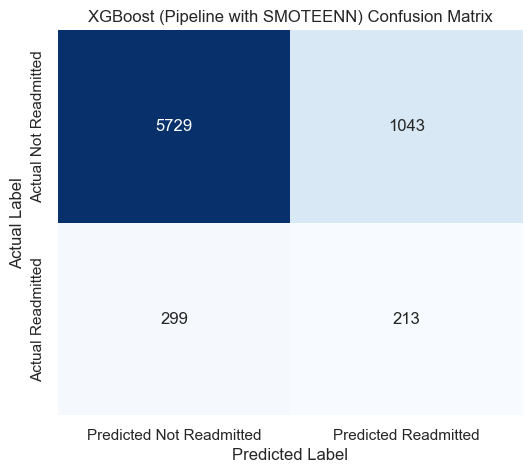

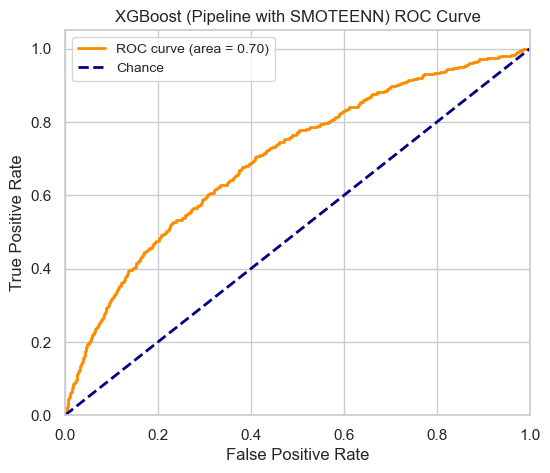

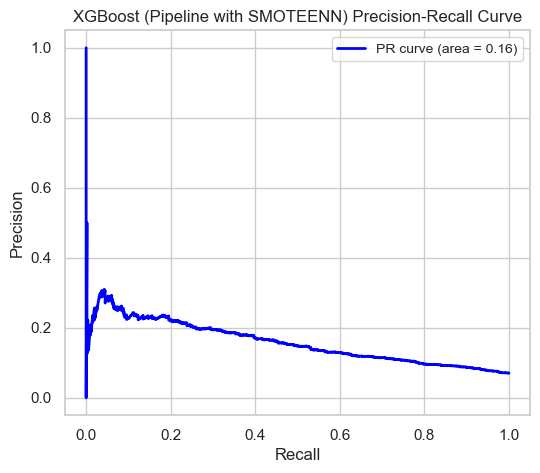


--- XGBoost (Pipeline with SMOTEENN) Feature Importance ---
                                         Feature  Importance
0                            num_past_admissions    0.102673
1                             insurance_Medicare    0.073224
2                              insurance_Private    0.069380
3                         ethnicity_recode_White    0.064669
4    discharge_location_REHAB/DISTINCT PART HOSP    0.054905
5        admission_location_EMERGENCY ROOM ADMIT    0.054121
6                       ethnicity_recode_Unknown    0.052593
7                        discharge_location_HOME    0.044072
8            discharge_location_HOME HEALTH CARE    0.034778
9            cvd_category_Ischemic Heart Disease    0.029515
10  admission_location_TRANSFER FROM HOSP/EXTRAM    0.023799
11                        discharge_location_SNF    0.023580
12             cvd_category_Hypertensive Disease    0.023527
13                      admission_type_EMERGENCY    0.023449
14    discharge_location

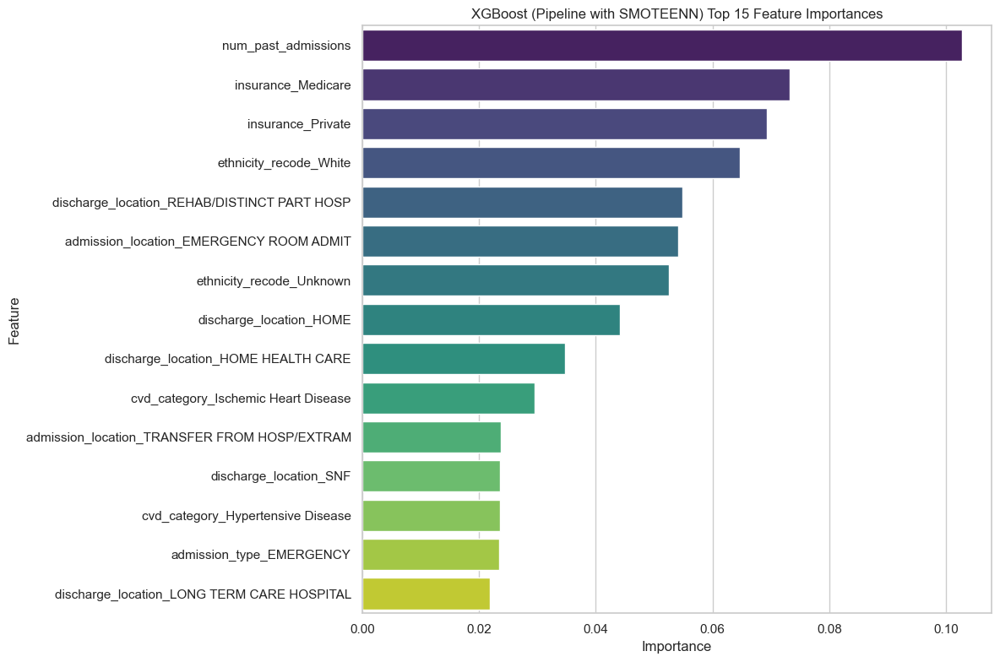

In [117]:
all_feature_names = X_train_reduced_vif.columns   # Columns needed for important features. 

# Evaluate the fitted pipeline on the untouched test data
evaluate_model_and_plot_figures(
    model_name="XGBoost (Pipeline with SMOTEENN)",
    best_model=best_rs,
    X_test_final=X_test_reduced_vif, 
    y_test=y_test,
    feature_names=all_feature_names
)

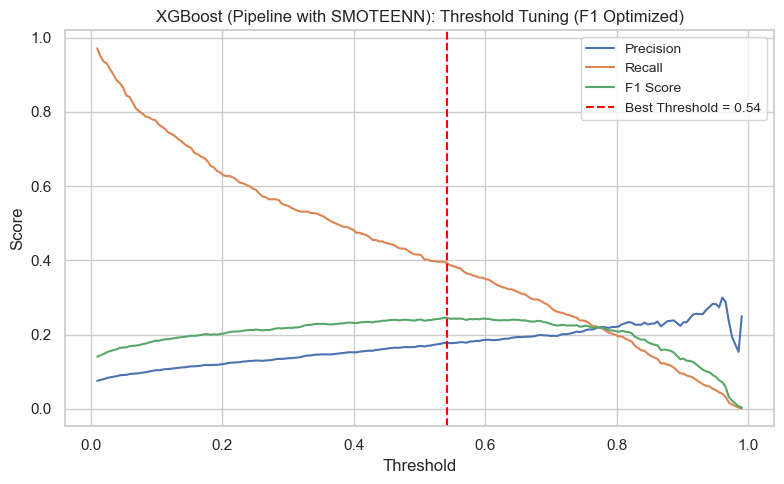

🔍 Best Threshold: 0.542
F1 Score at Best Threshold: 0.245
Precision: 0.179, Recall: 0.393
Brier Score XGBoost (Pipeline with SMOTEENN): 0.1337

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.86      0.90      6772
           1       0.18      0.39      0.25       512

    accuracy                           0.83      7284
   macro avg       0.56      0.63      0.57      7284
weighted avg       0.90      0.83      0.86      7284



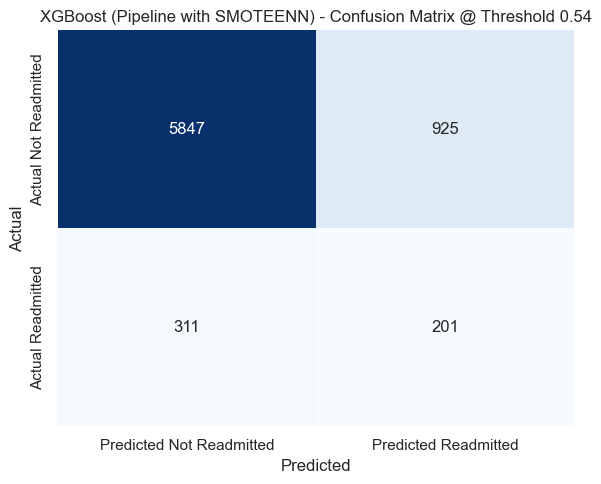

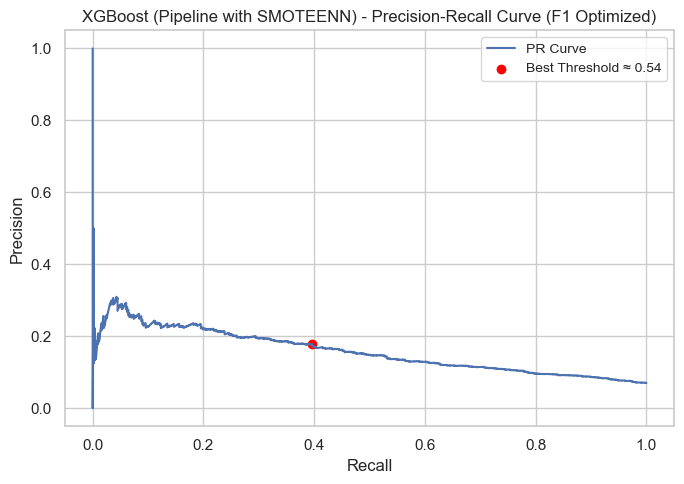

In [118]:
best_thresh = threshold_tuning_plot(
     model = best_rs,
     X_test_final=X_test_reduced_vif,
     y_test=y_test,
     model_name="XGBoost (Pipeline with SMOTEENN)")

\ Generating Learning Curve... This may take a while.


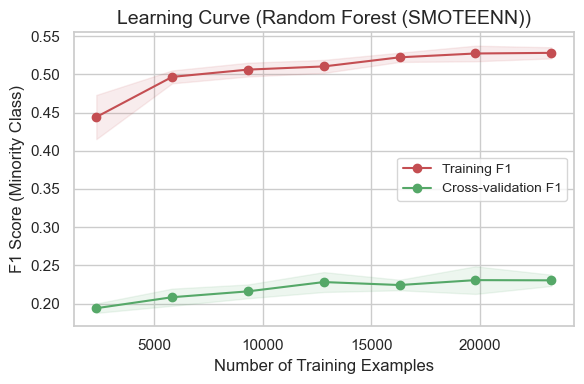


 Learning Curve Complete
Final Training F1: 0.5282 ± 0.0073
Final CV F1 Score: 0.2304 ± 0.0074


In [119]:
plot_learning_curve_f1(
    estimator=best_rs,
    X=X_train_reduced_vif,
    y=y_train,
    model_name="Random Forest (SMOTEENN)"
)

### Without SMOTEEN: This will be used as a reference model

In [120]:
# Initialize the model.

import xgboost as xgb
xgb2 = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=36,
    tree_method='hist' # Often faster for larger datasets
)

In [121]:
# Scale positive weight is used to balance the imbalanced data. 

neg_count = y_train.value_counts()[0]
pos_count = y_train.value_counts()[1]
scale_pos_weight = neg_count / pos_count

In [122]:
from sklearn.model_selection import learning_curve, StratifiedKFold, RandomizedSearchCV
from scipy.stats import randint, uniform

# Define the Parameter Grid for RandomSearchCV. 
param_rs2 = {
    'n_estimators': randint(300, 1000), # Random integer from 300 to 999
    'learning_rate': uniform(0.01, 0.1), # Random float from 0.01 to 0.11
    'max_depth': randint(4, 10), # Random integer from 4 to 9
    'subsample': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'colsample_bytree': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'gamma': uniform(0, 0.5), # Random float from 0 to 0.5
    'min_child_weight': randint(1, 10), # Random integer from 1 to 9
    'reg_alpha': uniform(0.1, 1), # Random float from 0 to 0.5
    'reg_lambda': uniform(2, 8), # Random float from 1 to 6
    'scale_pos_weight': [scale_pos_weight],
    'random_state': [36]
}

In [123]:
# Define the Scoring Metric: F1-score for the positive class (1)
f1_scorer_pos_label = make_scorer(f1_score, pos_label=1)

# Set up Cross-Validation Strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36) # 5 folds is common

# Initialize RandomizedSearchCV
# 'n_iter' controls the number of parameter settings that are sampled.
# Adjust this based on your available time and computational resources.
# A common starting point is 50-100 iterations.
random_search2 = RandomizedSearchCV(
    estimator=xgb2,
    param_distributions=param_rs2,
    n_iter=500, # Number of parameter settings to sample. Crucial for speed.
    scoring=f1_scorer_pos_label,
    cv=cv,
    verbose=0,
    random_state=36, # For reproducibility of the random sampling
    n_jobs=-1, # Use all available CPU cores
    return_train_score=True
)

In [124]:
# Import the time module
import time

# Run RandomizedSearchCV
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {random_search.n_iter} iterations...")
random_search2.fit(X_train_reduced_vif, y_train)
print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 200 iterations...
RandomizedSearchCV finished.
Total time: 643.4 seconds (10.7 minutes)


In [125]:
best_rs2 = random_search2.best_estimator_
print("Best Parameters:", best_rs2)

Best Parameters: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7684965985885119, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, feature_weights=None,
              gamma=0.28683998072976846, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.014912094618755626,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=8, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=668, n_jobs=None,
              num_parallel_tree=None, ...)



--- Evaluating XGBoost (scale positive weight) on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.85      0.90      6772
           1       0.18      0.45      0.26       512

    accuracy                           0.82      7284
   macro avg       0.57      0.65      0.58      7284
weighted avg       0.90      0.82      0.85      7284

F1 Score (Class 1): 0.2598
ROC AUC Score: 0.7057
Precision-Recall AUC: 0.1794
Brier Score: 0.1474


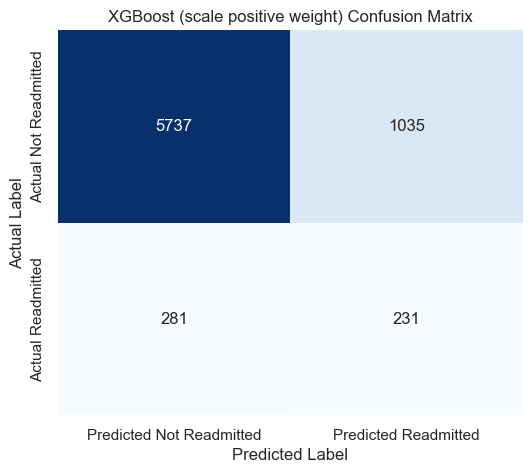

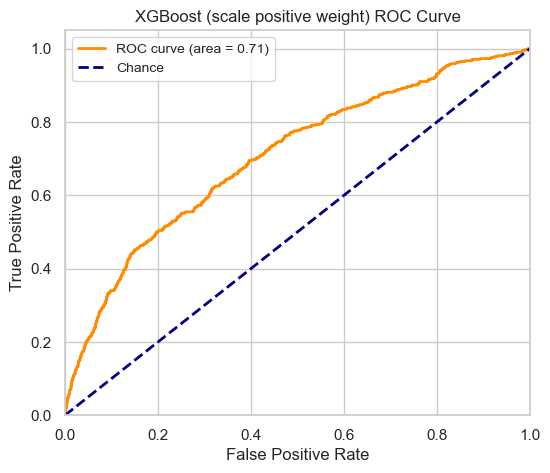

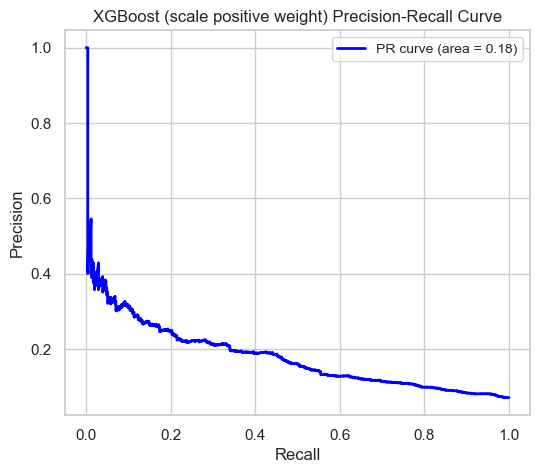


--- XGBoost (scale positive weight) Feature Importance ---
                                          Feature  Importance
0                             num_past_admissions    0.068667
1                        ethnicity_recode_Unknown    0.032263
2      discharge_location_LONG TERM CARE HOSPITAL    0.027819
3                                        icu_stay    0.021723
4     discharge_location_REHAB/DISTINCT PART HOSP    0.021024
5                        admission_type_EMERGENCY    0.017952
6                               insurance_Private    0.016925
7                                         bun_avg    0.016541
8                              anticoagulant_flag    0.016227
9      cvd_category_Pulmonary Circulation Disease    0.016110
10                         ethnicity_recode_Black    0.015967
11  cvd_category_Congenital Circulatory Anomalies    0.015726
12                          admission_type_URGENT    0.015541
13        cvd_category_Venous/Circulatory Disease    0.015259
14        

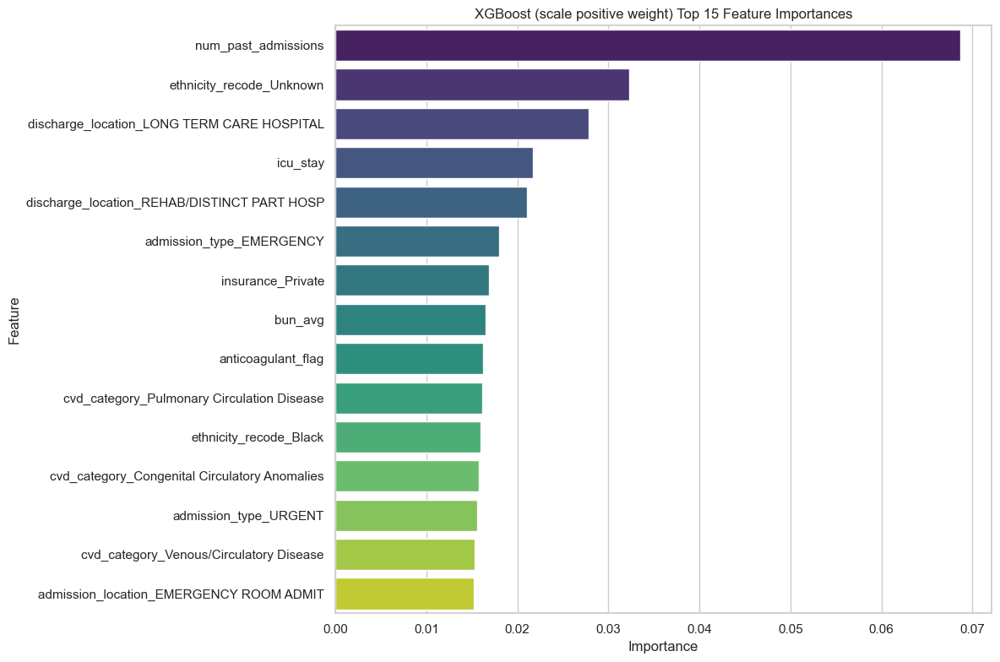

In [126]:
# Evaluate the fitted pipeline on the test data
evaluate_model_and_plot_figures(
    model_name="XGBoost (scale positive weight)",
    best_model=best_rs2,
    X_test_final=X_test_reduced_vif, # Use the original (unscaled) test data
    y_test=y_test,
    feature_names=all_feature_names
)

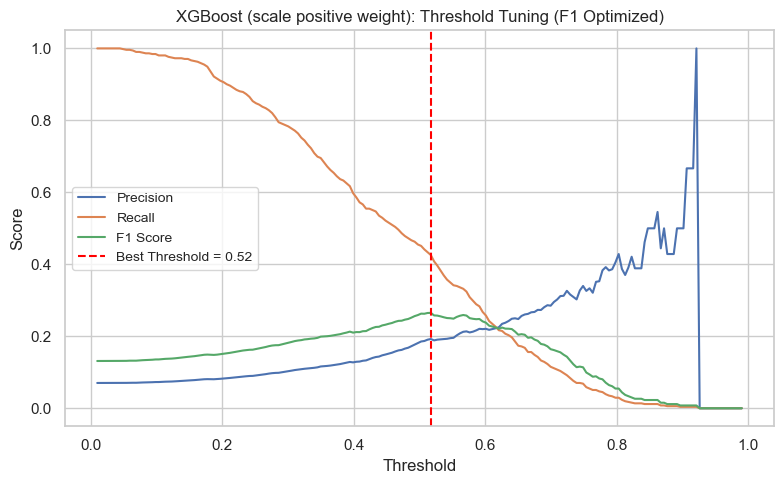

🔍 Best Threshold: 0.517
F1 Score at Best Threshold: 0.265
Precision: 0.192, Recall: 0.426
Brier Score XGBoost (scale positive weight): 0.1474

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.86      0.91      6772
           1       0.19      0.43      0.27       512

    accuracy                           0.83      7284
   macro avg       0.57      0.65      0.59      7284
weighted avg       0.90      0.83      0.86      7284



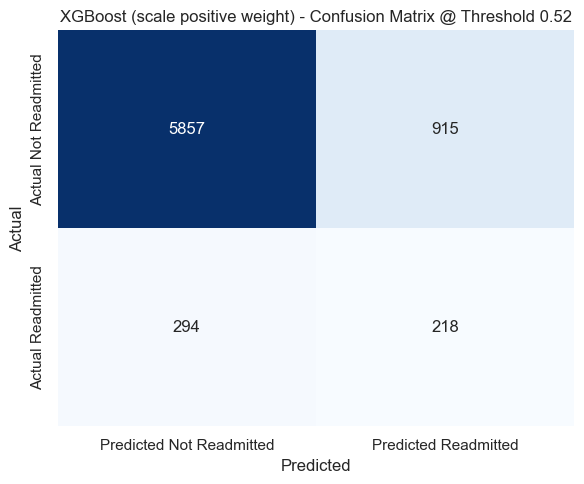

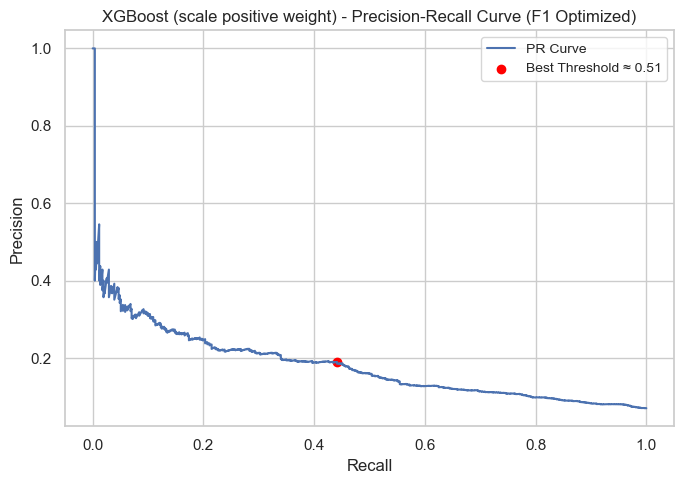

In [127]:
best_thresh = threshold_tuning_plot(
     model = best_rs2,
     X_test_final=X_test_reduced_vif,
     y_test=y_test,
     model_name="XGBoost (scale positive weight)")

\ Generating Learning Curve... This may take a while.


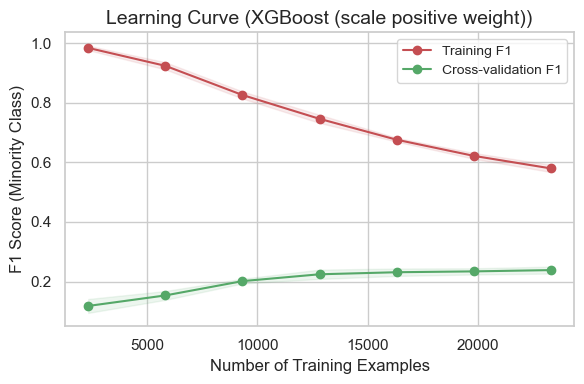


 Learning Curve Complete
Final Training F1: 0.5798 ± 0.0122
Final CV F1 Score: 0.2386 ± 0.0117


In [128]:
plot_learning_curve_f1(
    estimator=best_rs2,
    X=X_train_reduced_vif,
    y=y_train,
    model_name="XGBoost (scale positive weight)"
)

The reason for using this model model1 as a reference model is that for the same set of optimimum parameters of XGBoost, it performed relatively better compared to the model that used SMOTE.

## Feature Reduction

There are likely still a handful of potentially features that may not hurt the performance of the model after removing them. I confirmed those features using XGBoost's feature importance and removed some of them.

In [129]:
# 1. Get the fitted XGBoost estimator
feature_importances = best_rs2.feature_importances_

# 2. Create a DataFrame of feature importances
importance_df = pd.DataFrame({
    'Feature': all_feature_names,
    'Importance': feature_importances
})
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

In [130]:
print(importance_df.tail(60))

                                         Feature  Importance
31                            insurance_Medicare    0.011309
32                                 potassium_avg    0.011243
33                                       sbp_min    0.011229
34                                       dbp_min    0.011100
35                                       dbp_max    0.011022
36                                    sodium_avg    0.010893
37                                           age    0.010750
38                                       crp_avg    0.010667
39                                      spo2_min    0.010603
40                             beta_blocker_flag    0.010601
41                              vasopressor_flag    0.010536
42                                 resp_rate_avg    0.010501
43                                 magnesium_max    0.010492
44                                hemoglobin_avg    0.010368
45  admission_location_PHYS REFERRAL/NORMAL DELI    0.010328
46                      

In [131]:
# 3. Define a threshold or number of top features to keep
# This is an empirical decision. You can adjust 'num_features_to_keep'
# or define an 'importance_threshold' (e.g., 0.005)

num_features_to_keep = 62 # I will keep 62 features here. I wanted to reduce more, but might alter interaction terms.

# Or, if you prefer a threshold:
# importance_threshold = 0.01
# selected_features = importance_df[importance_df['Importance'] > importance_threshold]['Feature'].tolist()
selected_features = importance_df['Feature'].head(num_features_to_keep).tolist()

print(f"\nSelected {len(selected_features)} features for model comparison:")
print(selected_features)



Selected 62 features for model comparison:
['num_past_admissions', 'ethnicity_recode_Unknown', 'discharge_location_LONG TERM CARE HOSPITAL', 'icu_stay', 'discharge_location_REHAB/DISTINCT PART HOSP', 'admission_type_EMERGENCY', 'insurance_Private', 'bun_avg', 'anticoagulant_flag', 'cvd_category_Pulmonary Circulation Disease', 'ethnicity_recode_Black', 'cvd_category_Congenital Circulatory Anomalies', 'admission_type_URGENT', 'cvd_category_Venous/Circulatory Disease', 'admission_location_EMERGENCY ROOM ADMIT', 'digoxin_flag', 'cvd_category_Ischemic Heart Disease', 'discharge_location_SHORT TERM HOSPITAL', 'discharge_location_HOME HEALTH CARE', 'discharge_location_LEFT AGAINST MEDICAL ADVI', 'discharge_location_HOSPICE-HOME', 'length_of_stay', 'hematocrit_avg', 'albumin_avg', 'insurance_Medicaid', 'admission_location_TRANSFER FROM HOSP/EXTRAM', 'temp_min', 'discharge_location_SNF', 'creatinine_avg', 'antiplatelet_flag', 'discharge_location_HOME', 'insurance_Medicare', 'potassium_avg', 's

In [132]:
# 4. Filter X_train_df and X_test_df to only include selected features
X_train_reduced = X_train_reduced_vif[selected_features].copy()
X_test_reduced = X_test_reduced_vif[selected_features].copy()

In [133]:
X_test_reduced.head()

,num_past_admissions,ethnicity_recode_Unknown,discharge_location_LONG TERM CARE HOSPITAL,icu_stay,discharge_location_REHAB/DISTINCT PART HOSP,admission_type_EMERGENCY,insurance_Private,bun_avg,anticoagulant_flag,cvd_category_Pulmonary Circulation Disease,ethnicity_recode_Black,cvd_category_Congenital Circulatory Anomalies,admission_type_URGENT,cvd_category_Venous/Circulatory Disease,admission_location_EMERGENCY ROOM ADMIT,digoxin_flag,cvd_category_Ischemic Heart Disease,discharge_location_SHORT TERM HOSPITAL,discharge_location_HOME HEALTH CARE,discharge_location_LEFT AGAINST MEDICAL ADVI,discharge_location_HOSPICE-HOME,length_of_stay,hematocrit_avg,albumin_avg,insurance_Medicaid,admission_location_TRANSFER FROM HOSP/EXTRAM,temp_min,discharge_location_SNF,creatinine_avg,antiplatelet_flag,discharge_location_HOME,insurance_Medicare,potassium_avg,sbp_min,dbp_min,dbp_max,sodium_avg,age,crp_avg,spo2_min,beta_blocker_flag,vasopressor_flag,resp_rate_avg,magnesium_max,hemoglobin_avg,admission_location_PHYS REFERRAL/NORMAL DELI,heart_rate_avg,sbp_avg,ethnicity_recode_Hispanic/Latino,temp_avg,glucose_avg,magnesium_avg,temp_max,calcium_avg,glucose_max,dbp_avg,spo2_avg,resp_rate_max,lactate_avg,gender,statin_flag,spo2_max
33879,-0.317596,0.0,0.0,1,0.0,1.0,0.0,0.861936,1,0.0,0.0,0.0,0.0,0.0,0.0,0,0.0,0.0,0.0,0.0,0.0,-0.546460,1.364190,-1.009072,0.0,0.0,-0.149419,0.0,0.274060,1,1.0,1.0,-1.548183,0.902102,0.394992,0.165232,-0.349124,-0.241250,-0.249151,0.107051,1,0,-0.972395,-0.109405,2.099517,0.0,-0.639162,1.167372,0.0,-0.718211,-0.021385,0.305059,-1.295555,-0.378353,0.322119,0.038544,-0.779640,-1.094591,0.120268,1,1,-1.038392
20863,-0.317596,1.0,0.0,1,0.0,0.0,0.0,-0.535965,0,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0,0.0,0.0,0.0,0.0,-0.546460,-0.164622,0.986926,0.0,0.0,0.098036,1.0,-0.326326,1,0.0,1.0,1.179268,-0.078614,-0.483373,-0.711299,-1.045262,0.825971,1.255783,0.369800,1,0,-0.895983,-0.367919,-0.496187,1.0,-0.494719,-0.932284,0.0,-0.517419,0.290006,-0.599629,-0.986925,0.200439,0.083042,-0.756662,0.015195,-0.643310,-0.428639,0,0,0.418873
7229,-0.317596,0.0,0.0,1,0.0,1.0,0.0,-0.796639,0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,1.0,0.0,0.0,-0.626917,0.802981,1.283362,0.0,0.0,0.221764,0.0,-0.292018,0,0.0,1.0,0.758118,0.057177,-0.144004,-0.567212,-0.206082,0.882140,-0.056660,0.238426,1,0,0.643136,-0.626433,-0.496187,0.0,-0.261647,-0.309399,0.0,0.162632,-0.053598,-0.521806,0.161863,0.576935,-0.873269,-0.796891,-1.096515,-0.296171,-0.428639,0,0,-3.224291
7928,-0.317596,0.0,0.0,1,0.0,1.0,1.0,-0.499871,1,0.0,0.0,0.0,0.0,1.0,1.0,0,0.0,0.0,1.0,0.0,0.0,0.177658,-0.788354,-1.839091,0.0,0.0,0.716674,0.0,-0.491004,0,0.0,0.0,-0.961580,0.253320,0.714398,0.081181,-0.206082,-0.297420,-0.473141,1.158050,0,0,2.894183,0.019851,0.109478,0.0,0.584581,0.028775,0.0,1.055552,-0.659959,-0.570445,2.030787,-1.002100,0.919813,0.355739,1.395925,0.224538,-0.672598,0,0,0.418873
41602,-0.317596,0.0,0.0,1,0.0,0.0,0.0,-0.134928,1,0.0,0.0,0.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,-0.466002,1.097132,0.229369,0.0,0.0,0.366113,0.0,-0.292018,1,0.0,1.0,-0.505334,-0.380373,0.594621,-0.315059,1.205267,0.264275,-0.634134,0.343525,1,1,-0.114457,-0.238662,-0.496187,1.0,-0.177146,-1.088425,0.0,-0.022566,0.504759,0.061863,-0.575419,0.324064,0.083042,0.993117,-0.549913,-0.087888,-0.428639,1,1,-0.674076


## Rerun with New Reduced Features

### XGBoost with SMOTEENN on Reduced Features

In [134]:
# Define the Parameter Grid for RandomSearchCV
# IMPORTANT: Parameters for steps in a Pipeline must be prefixed with the step's name (e.g., 'xgb__').
param_rs2 = {
    # SMOTE hyperparameters
    'smoteenn__sampling_strategy': [0.5, 0.75, 1.0],
    'smoteenn__smote__k_neighbors': randint(3, 10),
    # xgb hyperparameters
    'xgb__n_estimators': randint(300, 1000), # Random integer from 300 to 999
    'xgb__learning_rate': uniform(0.01, 0.1), # Random float from 0.01 to 0.11
    'xgb__max_depth': randint(4, 10), # Random integer from 4 to 9
    'xgb__subsample': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'xgb__colsample_bytree': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'xgb__gamma': uniform(0, 0.5), # Random float from 0 to 0.5
    'xgb__min_child_weight': randint(1, 10), # Random integer from 1 to 9
    'xgb__reg_alpha': uniform(0, 0.5), # Random float from 0 to 0.5
    'xgb__reg_lambda': uniform(1, 5), # Random float from 1 to 6
    'xgb__random_state': [36]
    # No 'xgb__scale_pos_weight' here because SMOTE is handling imbalance.
    # If you wanted to tune SMOTE parameters, you'd add them here too, e.g., 'smote__k_neighbors': [3, 5, 7]
}

In [135]:
# Define the Scoring Metric: F1-score for the positive class (1)
f1_scorer_pos_label = make_scorer(f1_score, pos_label=1)

# Set up Cross-Validation Strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36) # 5 folds is common

# Initialize RandomizedSearchCV
# 'n_iter' controls the number of parameter settings that are sampled.
# Adjust this based on your available time and computational resources.
# A common starting point is 50-100 iterations.
random_search2 = RandomizedSearchCV(
    estimator=pipeline, # Pass the pipeline directly as the estimator. This was created few cells back. 
    param_distributions=param_rs2,
    n_iter=200, # Number of parameter settings to sample. Crucial for speed.
    scoring=f1_scorer_pos_label,
    cv=cv,
    verbose=0,
    random_state=36, # For reproducibility of the random sampling
    n_jobs=-1, # Use all available CPU cores
    return_train_score=True
)

In [136]:
# Import the time module
import time

# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {random_search.n_iter} iterations...")

random_search2.fit(X_train_reduced, y_train) # this was on reduced features.
print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 200 iterations...
RandomizedSearchCV finished.
Total time: 1432.0 seconds (23.9 minutes)


In [137]:
best_rs_smoteenn = random_search2.best_estimator_
print("Best Parameters:", random_search2.best_estimator_)

Best Parameters: Pipeline(steps=[('smoteenn',
                 SMOTEENN(random_state=36, sampling_strategy=0.75,
                          smote=SMOTE(k_neighbors=8))),
                ('xgb',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.8963495746739314, device=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric='logloss',
                               feature_types...
                               gamma=0.40836363156801964, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None,
                               learning_rate=0.02821973324459122, max_bin=None,
                               max_cat_threshold=None, max_cat_to_onehot=None,
                               max


--- Evaluating XGBoost (with SMOTEENN) on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.87      0.91      6772
           1       0.16      0.33      0.22       512

    accuracy                           0.83      7284
   macro avg       0.55      0.60      0.56      7284
weighted avg       0.89      0.83      0.86      7284

F1 Score (Class 1): 0.2195
ROC AUC Score: 0.6951
Precision-Recall AUC: 0.1636
Brier Score: 0.1204


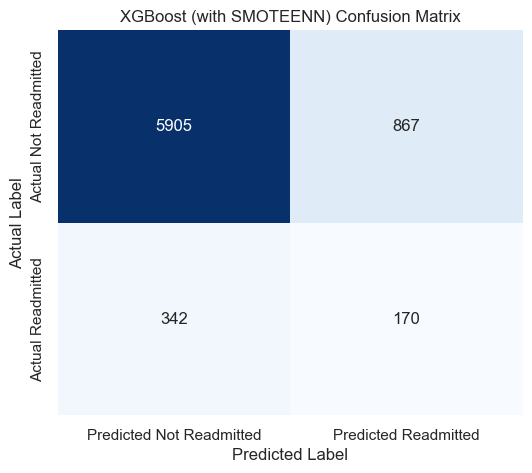

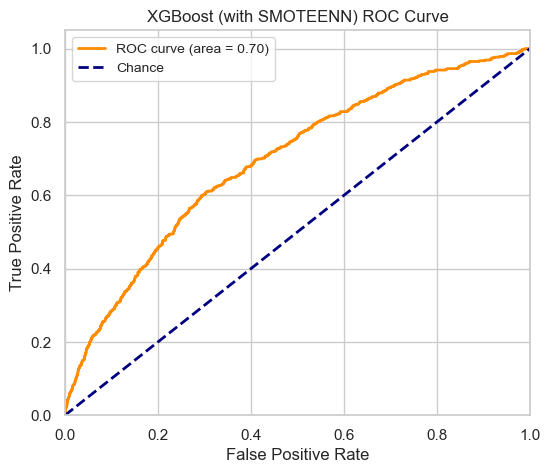

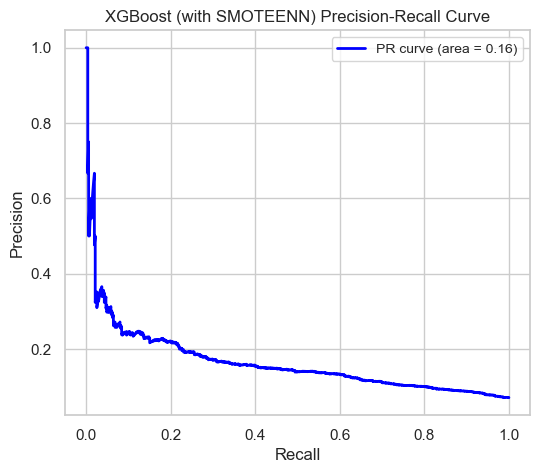


--- XGBoost (with SMOTEENN) Feature Importance ---
                                         Feature  Importance
0                            num_past_admissions    0.114544
1    discharge_location_REHAB/DISTINCT PART HOSP    0.098829
2                             insurance_Medicare    0.075221
3                              insurance_Private    0.064111
4                       ethnicity_recode_Unknown    0.063898
5        admission_location_EMERGENCY ROOM ADMIT    0.057902
6                        discharge_location_HOME    0.055601
7            cvd_category_Ischemic Heart Disease    0.043431
8            discharge_location_HOME HEALTH CARE    0.034155
9                         discharge_location_SNF    0.030794
10                      admission_type_EMERGENCY    0.024462
11  admission_location_PHYS REFERRAL/NORMAL DELI    0.022108
12    discharge_location_LONG TERM CARE HOSPITAL    0.021949
13  admission_location_TRANSFER FROM HOSP/EXTRAM    0.020413
14       cvd_category_Venous/Circ

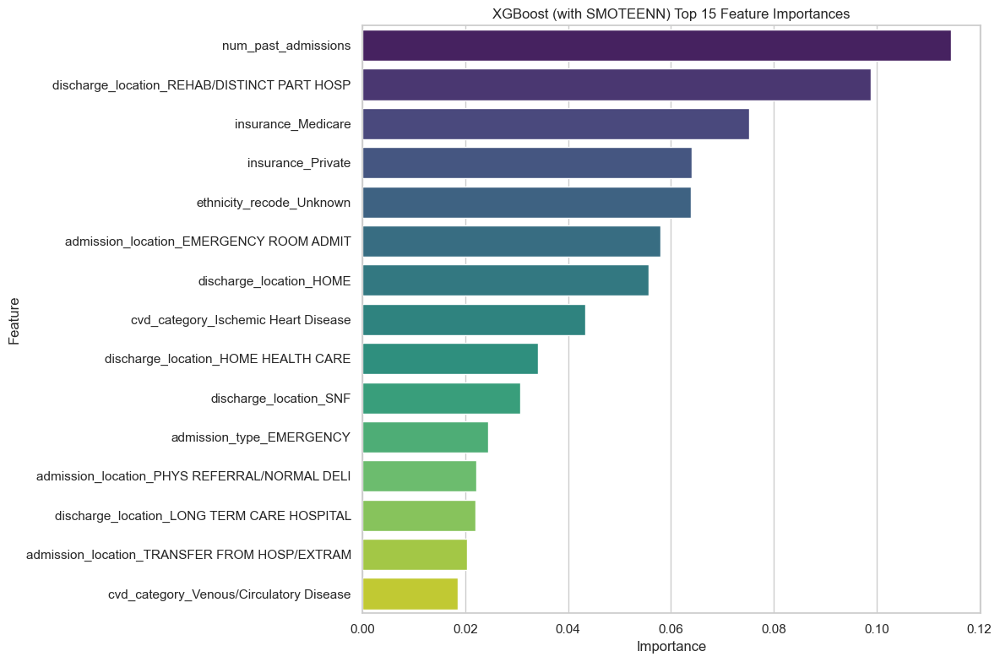

In [138]:
# Evaluate the fitted pipeline on the untouched test data
red_feature_names = X_test_reduced.columns

evaluate_model_and_plot_figures(
    model_name="XGBoost (with SMOTEENN)",
    best_model=best_rs_smoteenn,
    X_test_final=X_test_reduced, # reduced features
    y_test=y_test,
    feature_names=red_feature_names
)

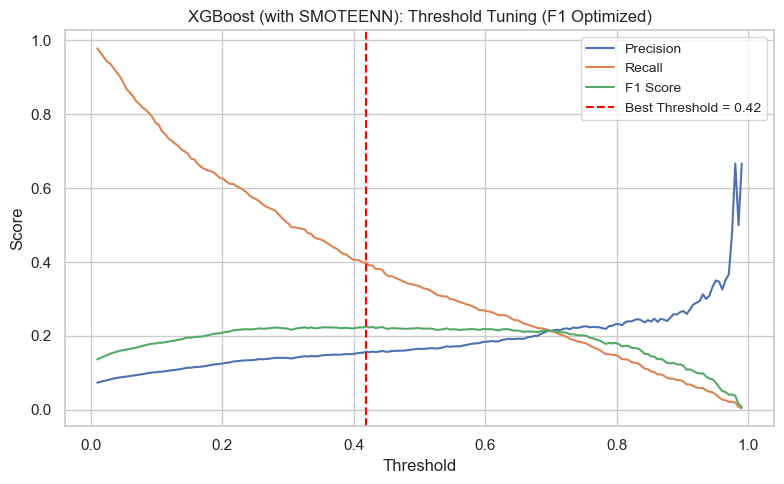

🔍 Best Threshold: 0.419
F1 Score at Best Threshold: 0.225
Precision: 0.157, Recall: 0.398
Brier Score XGBoost (with SMOTEENN): 0.1204

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.84      0.89      6772
           1       0.16      0.40      0.23       512

    accuracy                           0.81      7284
   macro avg       0.55      0.62      0.56      7284
weighted avg       0.89      0.81      0.84      7284



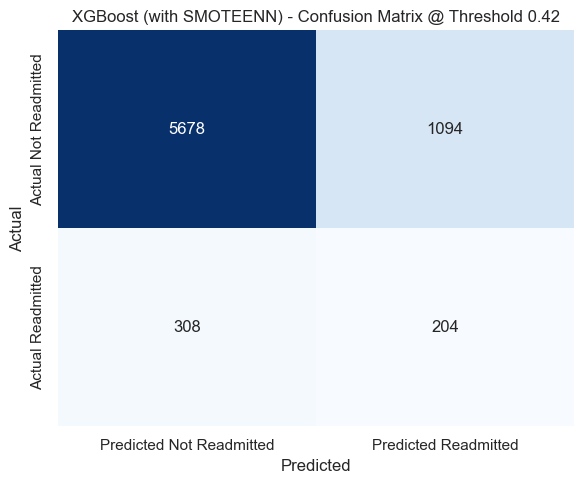

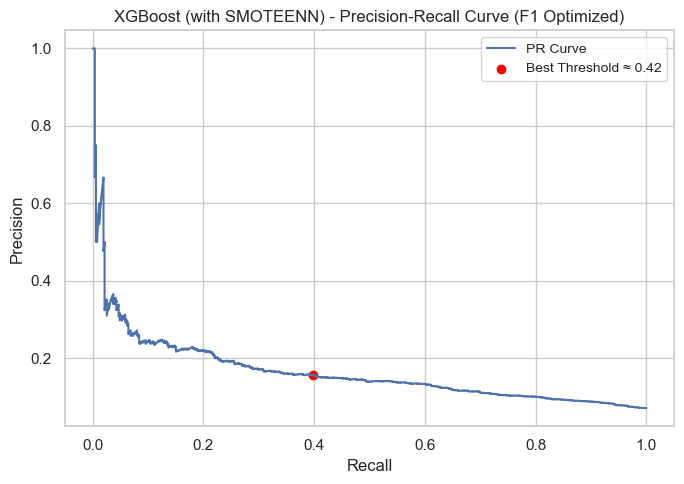

In [139]:
best_thresh = threshold_tuning_plot(
     model = best_rs_smoteenn,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="XGBoost (with SMOTEENN)")

### XGBoost with Reduced Feataures Using Scale Positive Weight

In [140]:
import xgboost as xgb
xgb3 = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    random_state=36,
    tree_method='hist' # Often faster for larger datasets
)

In [141]:
# Define the Parameter RandomSearchCV 

param_rs3 = {
    'n_estimators': randint(300, 1000), # Random integer from 300 to 999
    'learning_rate': uniform(0.01, 0.1), # Random float from 0.01 to 0.11
    'max_depth': randint(4, 10), # Random integer from 4 to 9
    'subsample': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'colsample_bytree': uniform(0.6, 0.4), # Random float from 0.6 to 1.0
    'gamma': uniform(0, 0.5), # Random float from 0 to 0.5
    'min_child_weight': randint(1, 10), # Random integer from 1 to 9
    'reg_alpha': uniform(0.1, 1), # Random float from 0 to 0.5
    'reg_lambda': uniform(2, 8), # Random float from 1 to 6
    'scale_pos_weight': [scale_pos_weight],
    'random_state': [36]
}

In [142]:
# Define the Scoring Metric: F1-score for the positive class (1) 
f1_scorer_pos_label = make_scorer(f1_score, pos_label=1)

# Set up Cross-Validation Strategy 
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36) # 5 folds is common

# Initialize RandomizedSearchCV
# 'n_iter' controls the number of parameter settings that are sampled.
# Adjust this based on your available time and computational resources.
# A common starting point is 50-100 iterations.
random_search3 = RandomizedSearchCV(
    estimator=xgb3,
    param_distributions=param_rs3,
    n_iter=500, # Number of parameter settings to sample. Crucial for speed.
    scoring=f1_scorer_pos_label,
    cv=cv,
    verbose=0,
    random_state=36, # For reproducibility of the random sampling
    n_jobs=-1, # Use all available CPU cores
    return_train_score=True
)

In [143]:
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {random_search.n_iter} iterations...")
random_search3.fit(X_train_reduced, y_train)
print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 200 iterations...
RandomizedSearchCV finished.
Total time: 554.0 seconds (9.2 minutes)


In [144]:
best_rs3 = random_search3.best_estimator_
print("Best Parameters:", best_rs3)

Best Parameters: XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.6830681497853586, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric='logloss', feature_types=None, feature_weights=None,
              gamma=0.15654324377249407, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.016312759786785782,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=9, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=975, n_jobs=None,
              num_parallel_tree=None, ...)



--- Evaluating XGBoost (with scale positive weight) on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.83      0.88      6772
           1       0.16      0.45      0.24       512

    accuracy                           0.80      7284
   macro avg       0.56      0.64      0.56      7284
weighted avg       0.90      0.80      0.84      7284

F1 Score (Class 1): 0.2385
ROC AUC Score: 0.6975
Precision-Recall AUC: 0.1668
Brier Score: 0.1514


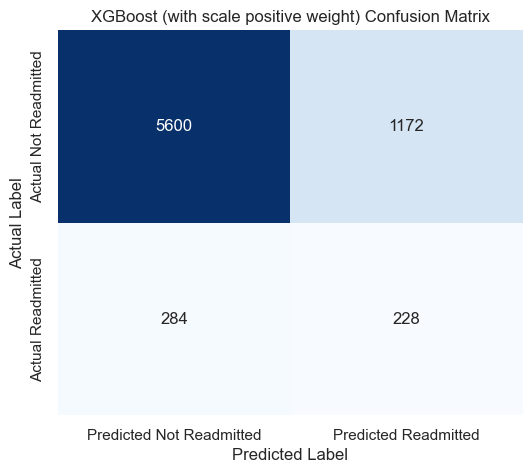

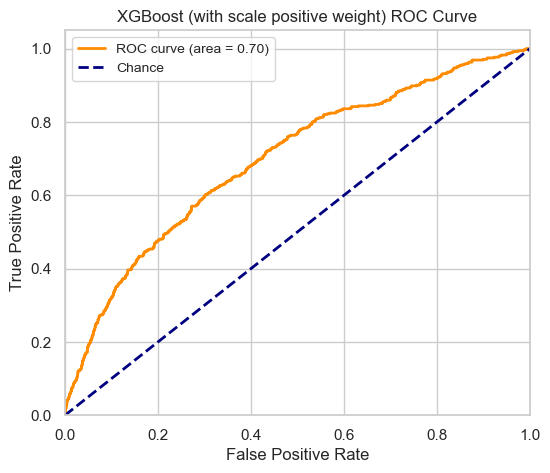

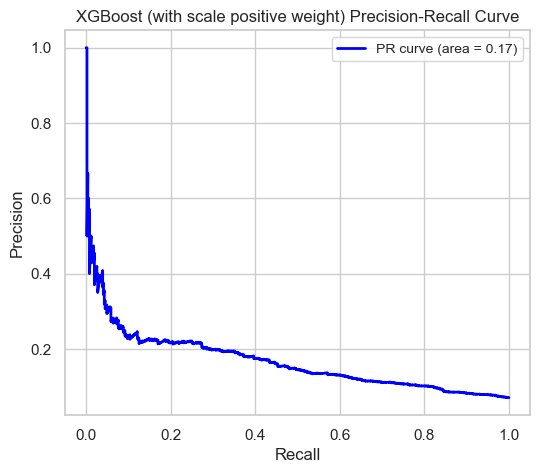


--- XGBoost (with scale positive weight) Feature Importance ---
                                          Feature  Importance
0                             num_past_admissions    0.079790
1                        ethnicity_recode_Unknown    0.041981
2      discharge_location_LONG TERM CARE HOSPITAL    0.032144
3                                        icu_stay    0.023856
4                               insurance_Private    0.023809
5                        admission_type_EMERGENCY    0.023281
6     discharge_location_REHAB/DISTINCT PART HOSP    0.022860
7                                         bun_avg    0.019567
8   cvd_category_Congenital Circulatory Anomalies    0.019462
9                          ethnicity_recode_Black    0.018078
10                             anticoagulant_flag    0.017960
11                          admission_type_URGENT    0.017558
12        cvd_category_Venous/Circulatory Disease    0.016724
13            discharge_location_HOME HEALTH CARE    0.016431
14   

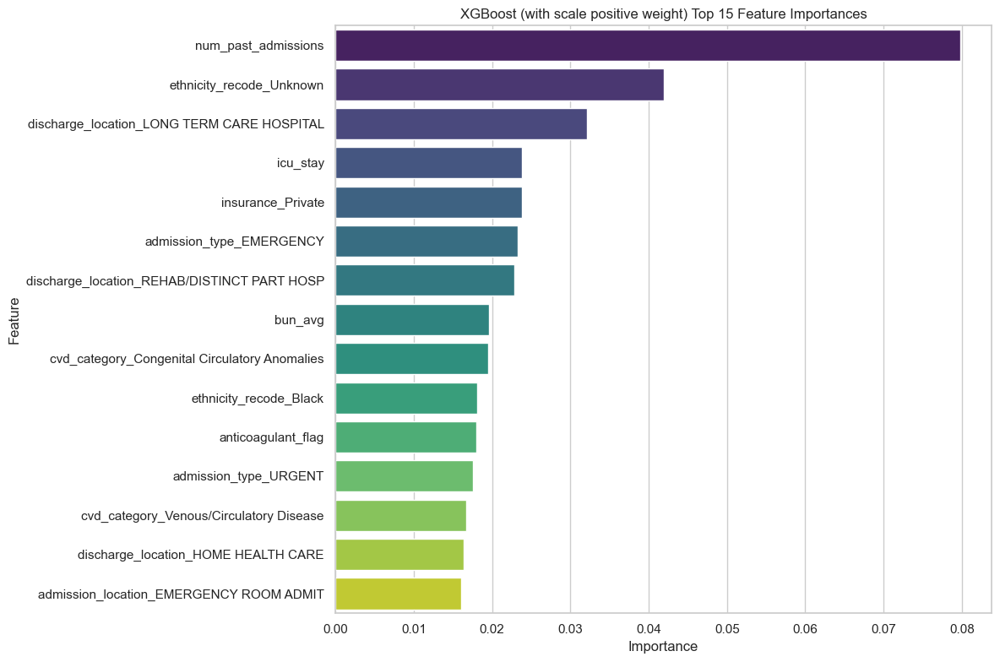

In [145]:
# Evaluate the fitted pipeline on the untouched test data
red_feature_names = X_test_reduced.columns

evaluate_model_and_plot_figures(
    model_name="XGBoost (with scale positive weight)",
    best_model=best_rs3,
    X_test_final=X_test_reduced, # Use the original (unscaled) test data
    y_test=y_test,
    feature_names=red_feature_names
)

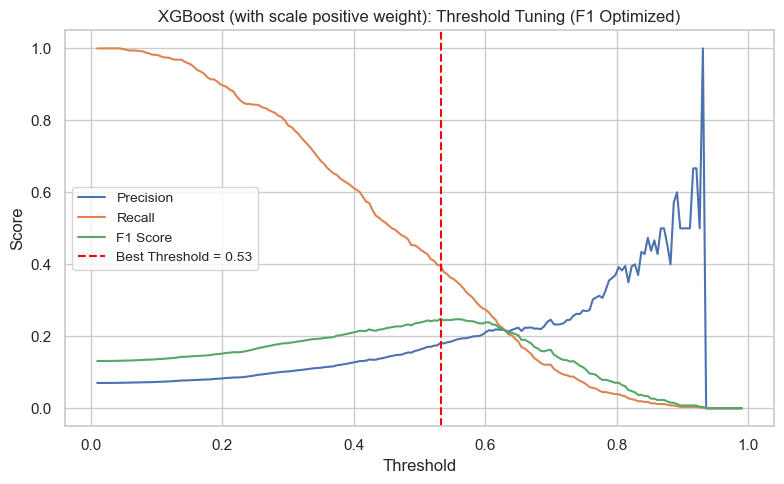

🔍 Best Threshold: 0.532
F1 Score at Best Threshold: 0.249
Precision: 0.181, Recall: 0.396
Brier Score XGBoost (with scale positive weight): 0.1514

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.86      0.91      6772
           1       0.18      0.40      0.25       512

    accuracy                           0.83      7284
   macro avg       0.57      0.63      0.58      7284
weighted avg       0.90      0.83      0.86      7284



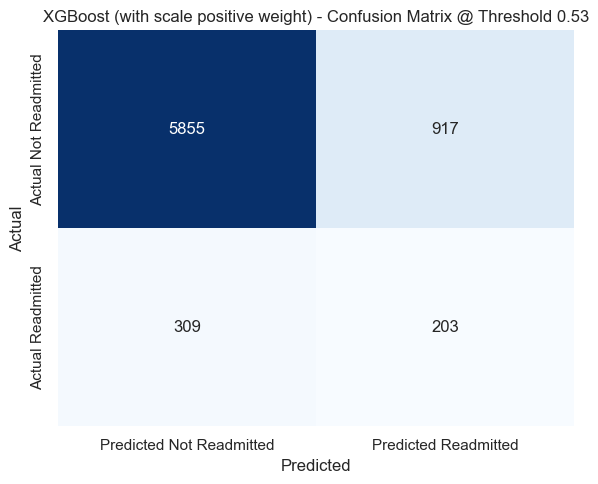

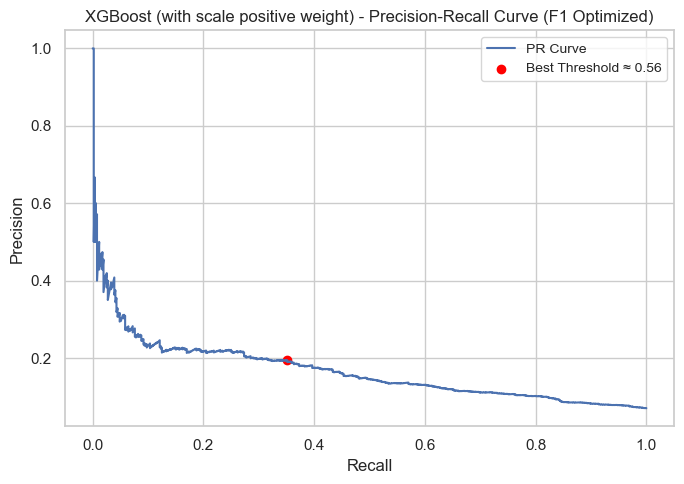

In [146]:
best_thresh = threshold_tuning_plot(
     model = best_rs3,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="XGBoost (with scale positive weight)")

\ Generating Learning Curve... This may take a while.


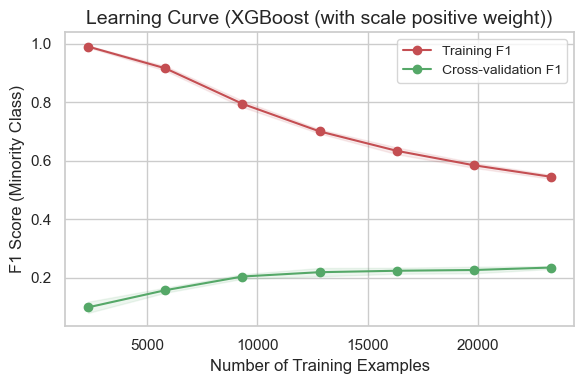


 Learning Curve Complete
Final Training F1: 0.5447 ± 0.0069
Final CV F1 Score: 0.2343 ± 0.0048


In [147]:
plot_learning_curve_f1(
    estimator=best_rs3,
    X=X_train_reduced,
    y=y_train,
    model_name="XGBoost (with scale positive weight)"
)

### Stacking Models

For this part, I am stacking XGBoost with Logistic Regression.

In [148]:
# Stacking models- XGboost with logistic regression. I wanted to see if model performance  improves?

# XGBoost Base Model
xgb_base = xgb.XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    n_estimators=500, # I used 500 estimators. 
    learning_rate=0.016,
    max_depth=5,
    _child_weight=9,
    subsample=0.8,
    colsample_bytree=0.7,
    random_state=36,
    n_jobs=-1,
    scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1] # Handle imbalance
)

# In case if I want to use other base models, I can add more base models like this:
# rf_base = RandomForestClassifier(n_estimators=300, max_depth=10, random_state=42, class_weight='balanced')
# lgbm_base = lgb.LGBMClassifier(objective='binary', n_estimators=500, random_state=42, scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1])

In [149]:
# Define the list of base estimators for StackingClassifier
# Each estimator needs to be a tuple: ('name', estimator_instance)
estimators = [
    ('xgb_base', xgb_base)
]

# Define the Meta-Learner
# Logistic Regression is a good, simple choice for the final estimator.
# Use class_weight='balanced' if meta-features are still imbalanced,
# or if you want the meta-learner to prioritize recall.
meta_learner = LogisticRegression(random_state=36, solver='liblinear', class_weight='balanced', max_iter=1000)

In [150]:
from sklearn.ensemble import StackingClassifier # Import StackingClassifier

# I'll wrap the StackingClassifier in a Pipeline 

stacking_classifier = StackingClassifier(
    estimators=estimators,
    final_estimator=meta_learner,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=36), # Cross-validation for meta-feature generation
    stack_method='predict_proba', # Use probabilities as meta-features
    n_jobs=-1, # Use all available cores for base model training (in CV folds)
    passthrough=False, # If True, original features are also passed to final_estimator
    verbose=1
)

In [151]:
# Fitting stacking classifier.

stacking_classifier.fit(X_train_reduced, y_train)

/opt/anaconda3/lib/python3.12/site-packages/xgboost/training.py:183: UserWarning: [17:05:55] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "_child_weight" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 16 concurrent workers.
[17:05:56] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "_child_weight" } are not used.

[17:05:56] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "_child_weight" } are not used.

[17:05:56] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "_child_weight" } are not used.

[17:05:56] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "_child_weight" } are not used.

[17:05:56] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:738: 
Parameters: { "_child_weight" } are not used.

[Parallel(n_jobs=-1)]: Done   5 out of   5 | elapsed: 

StackingClassifier(cv=StratifiedKFold(n_splits=5, random_state=36, shuffle=True),
                   estimators=[('xgb_base',
                                XGBClassifier(_child_weight=9, base_score=None,
                                              booster=None, callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=0.7, device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric='logloss',
                                              feature_types=None,
                                              fe...
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None, max_depth=5,
                                              max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=500, n_jobs=-1, ...))],
                   final_estimator=LogisticRegression(class_weight='balanced',
                                                      max_iter=1000,
                                                      random_state=36,
                                                      solver='liblinear'),
                   n_jobs=-1, stack_method='predict_proba', verbose=1)


--- Evaluating XGBoost + Logit Stacking on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.65      0.77      6772
           1       0.12      0.65      0.21       512

    accuracy                           0.65      7284
   macro avg       0.54      0.65      0.49      7284
weighted avg       0.90      0.65      0.73      7284

F1 Score (Class 1): 0.2053
ROC AUC Score: 0.7009
Precision-Recall AUC: 0.1710
Brier Score: 0.2271


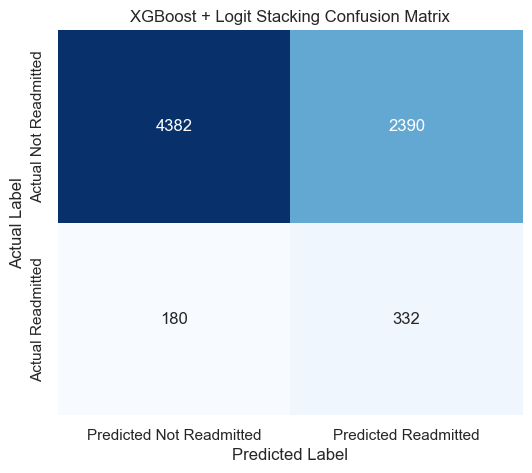

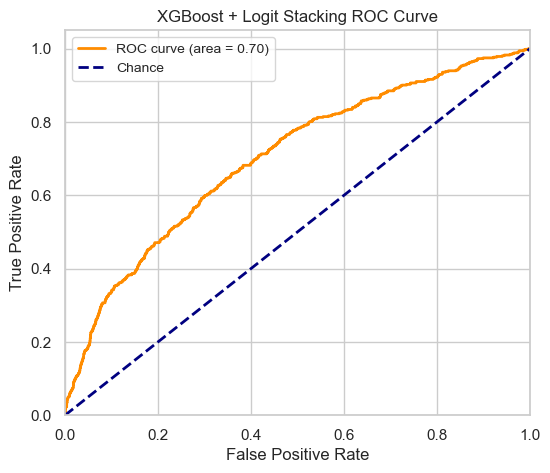

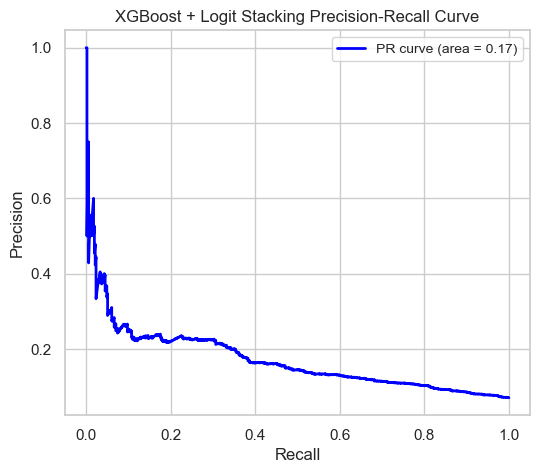


--- XGBoost + Logit Stacking Feature Importance ---
Feature importance not available or could not be mapped correctly for this model.
Expected 62 features, got None from model.


In [152]:
evaluate_model_and_plot_figures(
    model_name="XGBoost + Logit Stacking",
    best_model=stacking_classifier,
    X_test_final=X_test_reduced, 
    y_test=y_test,
    feature_names=red_feature_names
)

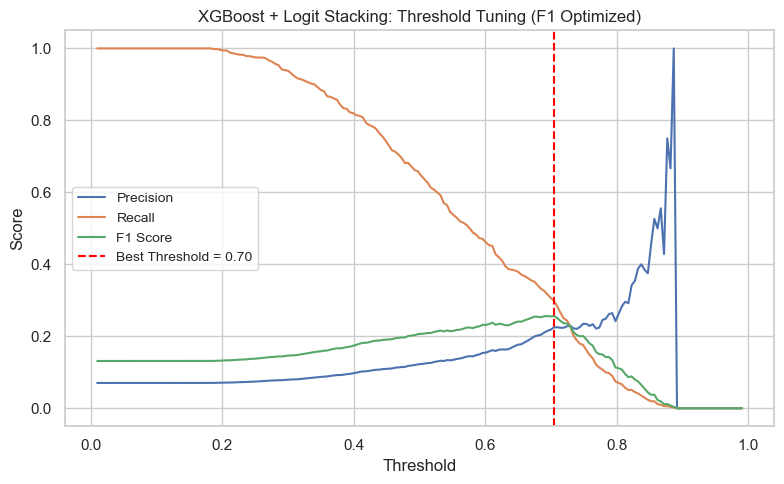

🔍 Best Threshold: 0.704
F1 Score at Best Threshold: 0.256
Precision: 0.225, Recall: 0.299
Brier Score XGBoost + Logit Stacking: 0.2271

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.92      0.93      6772
           1       0.22      0.30      0.26       512

    accuracy                           0.88      7284
   macro avg       0.59      0.61      0.60      7284
weighted avg       0.89      0.88      0.89      7284



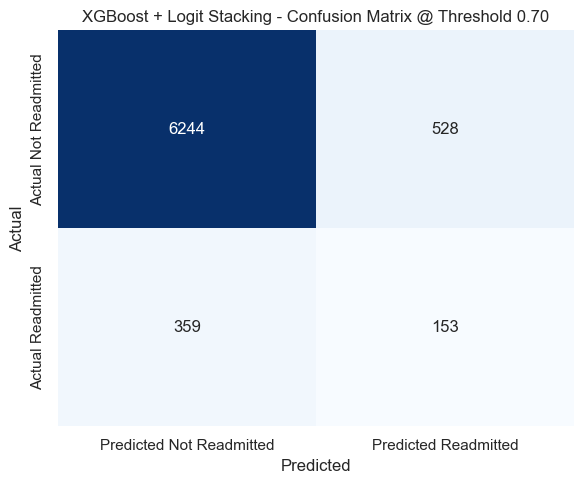

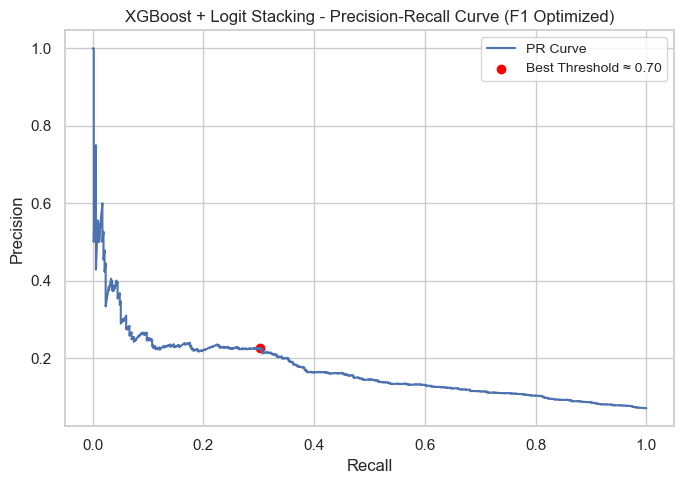

In [153]:
best_thresh = threshold_tuning_plot(
     model = stacking_classifier,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="XGBoost + Logit Stacking")

### Logistic Regression 

In [154]:
from sklearn.linear_model import LogisticRegression

# 1. Initialize the model with class_weight='balanced'
lr = LogisticRegression(class_weight='balanced')

In [155]:
# 2. Set the parameter grid
lr_param = [
    {
        'penalty': ['l1'],
        'solver': ['liblinear', 'saga'],  # Both support L1
        'C': np.logspace(-3, 3, 11),
        'max_iter': [10000]
    },
    {
        'penalty': ['l2'],
        'solver': ['liblinear', 'saga', 'lbfgs'],  # All support L2
        'C': np.logspace(-3, 3, 11),
        'max_iter': [10000]
    },
    {
        'penalty': ['elasticnet'],
        'solver': ['saga'],  # Only saga supports elasticnet
        'C': np.logspace(-3, 3, 11),
        'l1_ratio': [0.1, 0.5, 0.9],  # Required for elasticnet
        'max_iter': [10000]
    },
    {
        'penalty': ['none'],
        'solver': ['lbfgs', 'saga'],  # solvers that support no penalty
        'max_iter': [10000]
    }
]

In [156]:
# 3. Configure RandomSearchCV with stratified k-fold cross-validation and appropriate scoring

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36)
# Use stratified cross-validation

# Custom scorer for minority class (or use 'roc_auc' if preferred)
f1_scorer = make_scorer(f1_score, pos_label=1)

lr_rs = RandomizedSearchCV(
    estimator=lr,
    param_distributions=lr_param,
    n_iter=500,  # Increase if aiming for deeper search
    scoring=f1_scorer,  # Or use 'roc_auc' for imbalanced classification
    cv=cv,
    verbose=0,
    random_state=36,
    n_jobs=-1
)

In [157]:
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {random_search.n_iter} iterations...")
# 4. Fit model
lr_rs.fit(X_train_reduced, y_train)

print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 200 iterations...
RandomizedSearchCV finished.
Total time: 143.6 seconds (2.4 minutes)


In [158]:
best_lr = lr_rs.best_estimator_
print("Best Parameters:", best_lr)

Best Parameters: LogisticRegression(C=0.0630957344480193, class_weight='balanced',
                   max_iter=10000)



--- Evaluating Logistic Regression on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.68      0.80      6772
           1       0.12      0.59      0.21       512

    accuracy                           0.68      7284
   macro avg       0.54      0.64      0.50      7284
weighted avg       0.90      0.68      0.76      7284

F1 Score (Class 1): 0.2056
ROC AUC Score: 0.6951
Precision-Recall AUC: 0.1647
Brier Score: 0.2133


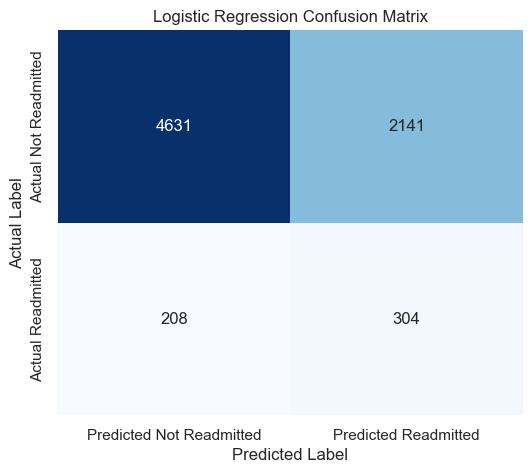

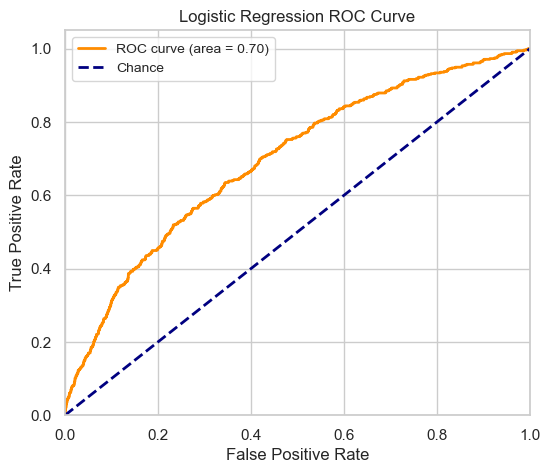

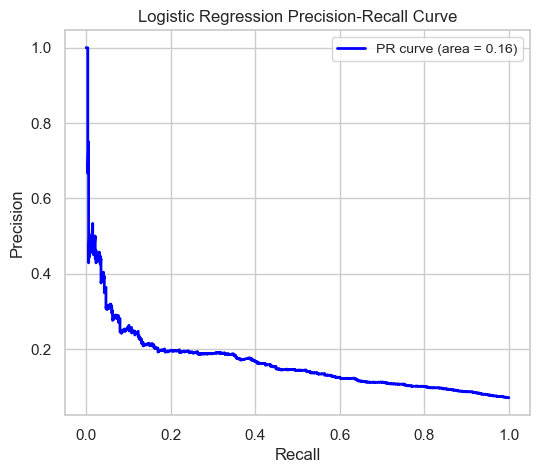


--- Logistic Regression Feature Importance ---
                                          Feature  Importance
0                 discharge_location_HOSPICE-HOME    0.783218
1      discharge_location_LONG TERM CARE HOSPITAL    0.691515
2                        ethnicity_recode_Unknown    0.641752
3                                        icu_stay    0.524842
4     discharge_location_REHAB/DISTINCT PART HOSP    0.496305
5                              insurance_Medicaid    0.404600
6                          discharge_location_SNF    0.401875
7                        admission_type_EMERGENCY    0.400067
8          discharge_location_SHORT TERM HOSPITAL    0.393186
9    discharge_location_LEFT AGAINST MEDICAL ADVI    0.387827
10                            num_past_admissions    0.375356
11  cvd_category_Congenital Circulatory Anomalies    0.361505
12                             insurance_Medicare    0.273435
13                                   digoxin_flag    0.253858
14                    

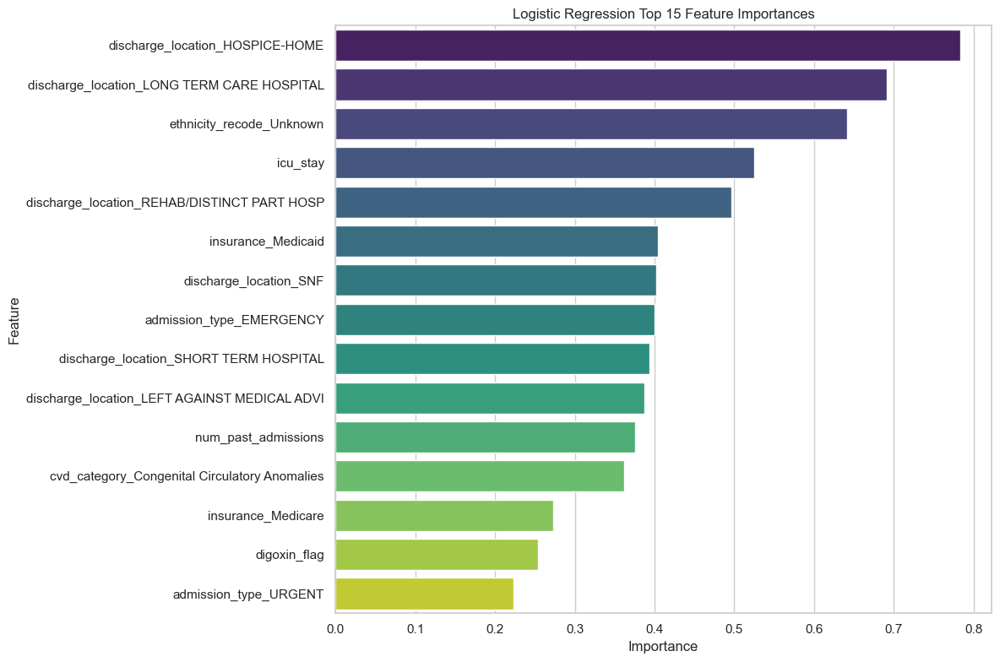

In [159]:
evaluate_model_and_plot_figures(
    model_name="Logistic Regression",
    best_model=best_lr,
    X_test_final=X_test_reduced,
    y_test=y_test,
    feature_names=red_feature_names
)

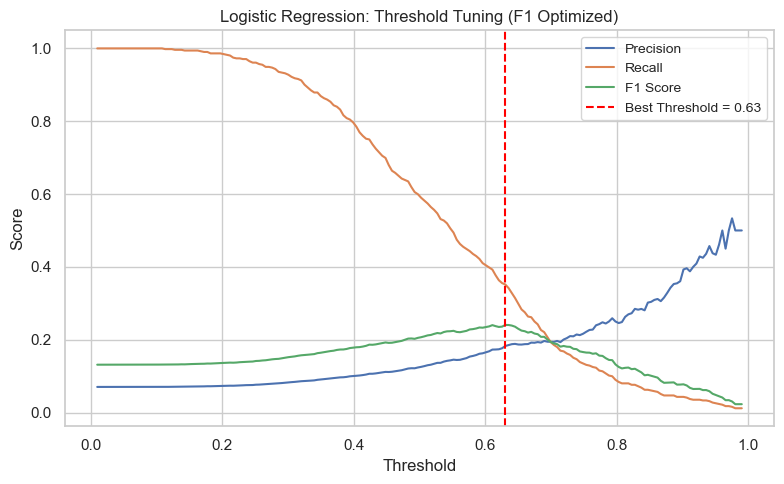

🔍 Best Threshold: 0.631
F1 Score at Best Threshold: 0.240
Precision: 0.183, Recall: 0.352
Brier Score Logistic Regression: 0.2133

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91      6772
           1       0.18      0.35      0.24       512

    accuracy                           0.84      7284
   macro avg       0.57      0.62      0.58      7284
weighted avg       0.89      0.84      0.87      7284



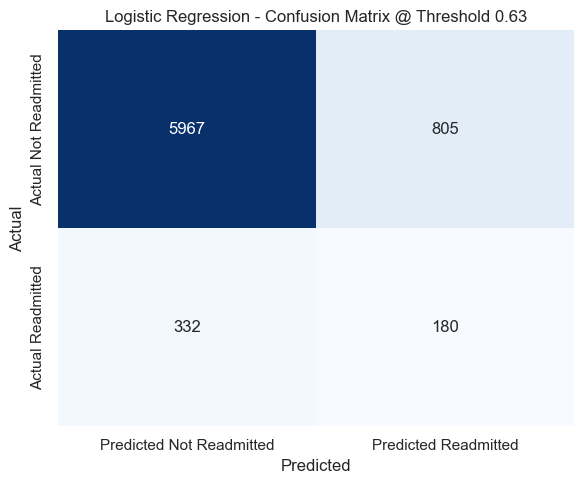

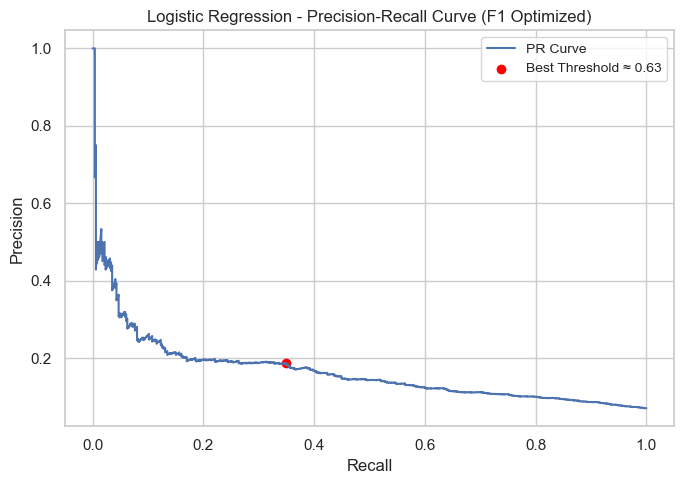

In [160]:
best_thresh = threshold_tuning_plot(
     model = best_lr,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="Logistic Regression")

\ Generating Learning Curve... This may take a while.


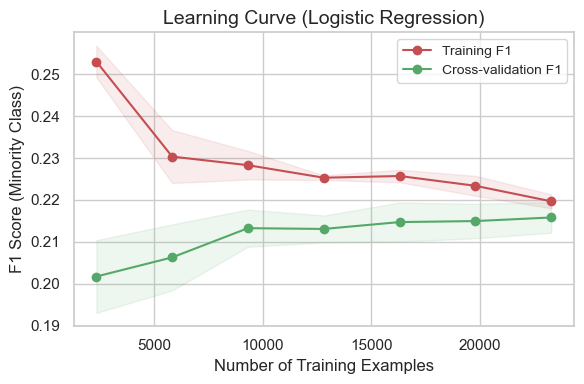


 Learning Curve Complete
Final Training F1: 0.2197 ± 0.0017
Final CV F1 Score: 0.2158 ± 0.0037


In [161]:
plot_learning_curve_f1(
    estimator=best_lr,
    X=X_train_reduced,
    y=y_train,
    model_name="Logistic Regression"
)

Learning curve explanation: The training score is consistently low and flat. This is the primary indicator of high bias. It means that the Logistic Regression model, even with its best efforts, is too simple or too constrained to effectively learn the patterns within the training data, let alone generalize well. It's not complex enough to fit the data. Since, logistic Regression is a linear model, it will not be able to capture the non-linear relationships and complex intricate interactions that exists in the hospital readmission data.
More data will not help this model at all. The plateauing of both curves indicates the model has reached its performance ceiling with the existing features and its linear nature. Therefore, it is better to consider different model for readmission prediction task. 

### Random Forest

In [162]:
from sklearn.linear_model import LogisticRegression

# 1. Initialize the model with class_weight='balanced'
rf = RandomForestClassifier(random_state=36)

In [163]:
# 2. Set the parameter grid
rf_param = {
    'n_estimators': [200, 300, 500, 700],  # Slightly expanded
    'max_depth': [10, 15, 20, 25],         # Broader range to test overfitting
    'min_samples_split': [5, 10, 15],
    'min_samples_leaf': [2, 5, 10],
    'max_features': ['sqrt', 'log2'],
    'class_weight': ['balanced']  # Essential for imbalanced classification
}

In [164]:
# 3. Configure RandomSearchCV with stratified k-fold cross-validation and appropriate scoring

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36)
# Use stratified cross-validation

rf_rs = RandomizedSearchCV(
    estimator=rf,
    param_distributions=rf_param,
    n_iter=500,  # Adjust based on time/resources
    scoring=f1_scorer,
    cv=cv,
    verbose=1,
    random_state=36,
    n_jobs=-1
)

In [165]:
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {rf_rs.n_iter} iterations...")

# 4. Fit model
rf_rs.fit(X_train_reduced, y_train)

print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 500 iterations...
Fitting 5 folds for each of 288 candidates, totalling 1440 fits
RandomizedSearchCV finished.
Total time: 1527.7 seconds (25.5 minutes)


In [166]:
best_rf = rf_rs.best_estimator_
print("Best Parameters:", best_rf)

Best Parameters: RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=10, min_samples_split=5,
                       n_estimators=300, random_state=36)


In [167]:
rf_rs.best_params_

{'n_estimators': 300,
 'min_samples_split': 5,
 'min_samples_leaf': 10,
 'max_features': 'sqrt',
 'max_depth': 10,
 'class_weight': 'balanced'}


--- Evaluating Random Forest on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.89      0.92      6772
           1       0.18      0.32      0.23       512

    accuracy                           0.85      7284
   macro avg       0.56      0.61      0.57      7284
weighted avg       0.89      0.85      0.87      7284

F1 Score (Class 1): 0.2301
ROC AUC Score: 0.6945
Precision-Recall AUC: 0.1671
Brier Score: 0.1514


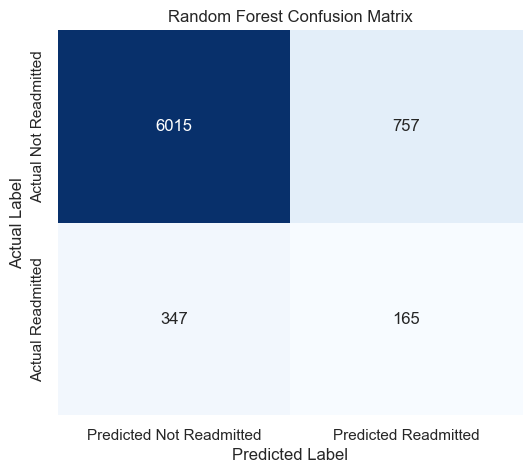

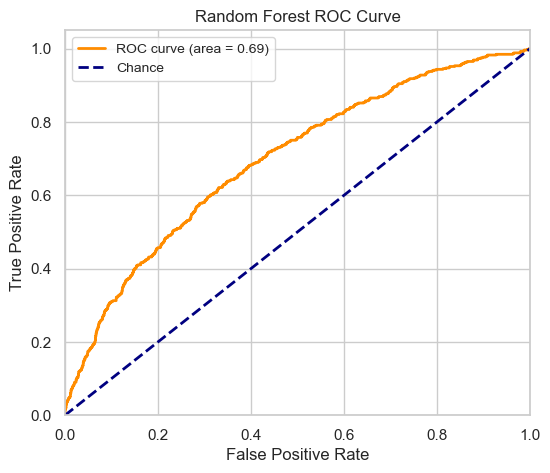

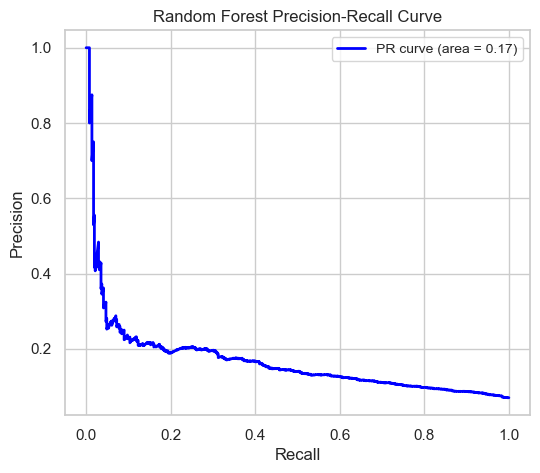


--- Random Forest Feature Importance ---
                Feature  Importance
0   num_past_admissions    0.096374
1               bun_avg    0.060464
2        hematocrit_avg    0.046636
3        creatinine_avg    0.045086
4           albumin_avg    0.033599
5              temp_min    0.029948
6         potassium_avg    0.028969
7        heart_rate_avg    0.027989
8            sodium_avg    0.027757
9               dbp_max    0.027586
10              sbp_min    0.026251
11              crp_avg    0.026223
12              dbp_min    0.025272
13             spo2_avg    0.023794
14             temp_avg    0.023792


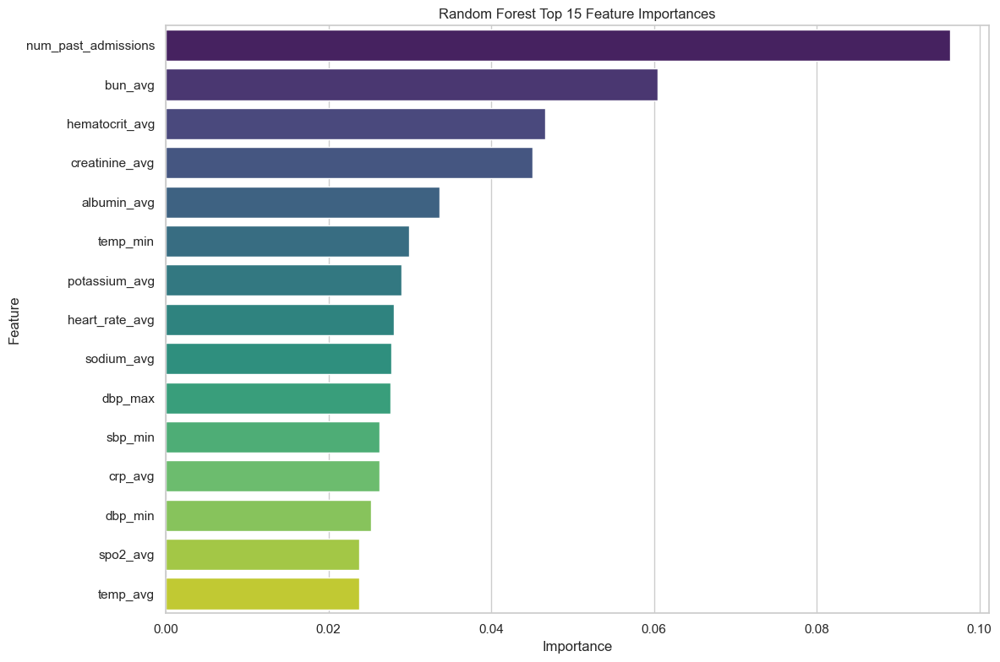

In [168]:
evaluate_model_and_plot_figures(
    model_name="Random Forest",
    best_model=best_rf,
    X_test_final=X_test_reduced,
    y_test=y_test,
    feature_names=red_feature_names
)

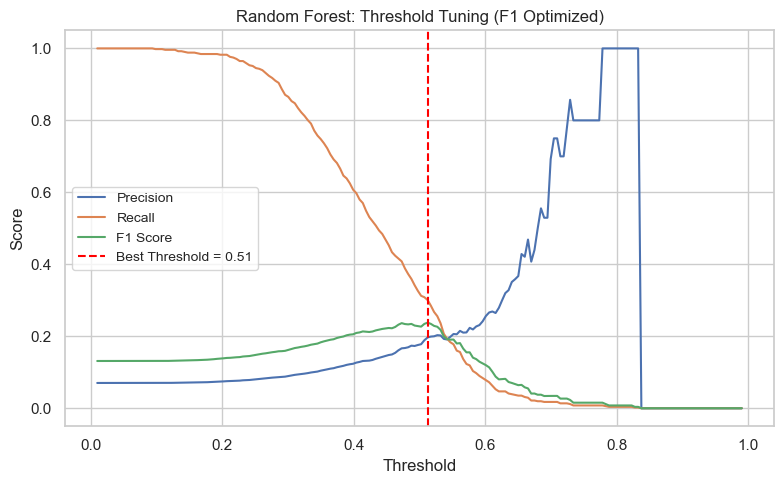

🔍 Best Threshold: 0.512
F1 Score at Best Threshold: 0.238
Precision: 0.197, Recall: 0.301
Brier Score Random Forest: 0.1514

 Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      6772
           1       0.20      0.30      0.24       512

    accuracy                           0.86      7284
   macro avg       0.57      0.60      0.58      7284
weighted avg       0.89      0.86      0.88      7284



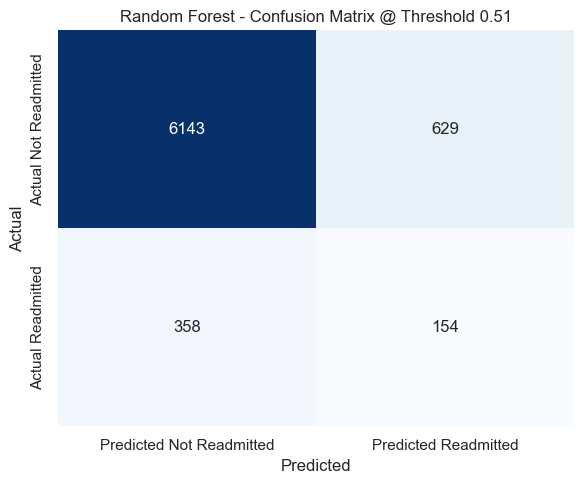

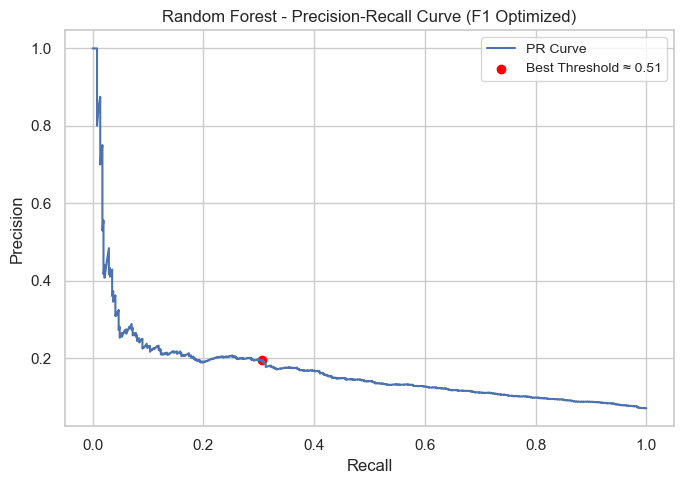

In [169]:
best_thresh = threshold_tuning_plot(
     model = best_rf,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="Random Forest")

\ Generating Learning Curve... This may take a while.


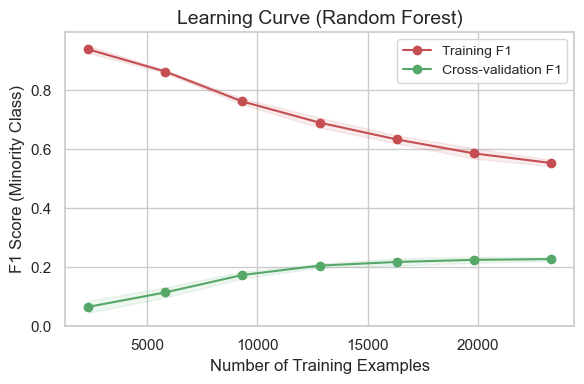


 Learning Curve Complete
Final Training F1: 0.5535 ± 0.0104
Final CV F1 Score: 0.2274 ± 0.0059


In [170]:
plot_learning_curve_f1(
    estimator=best_rf,
    X=X_train_reduced,
    y=y_train,
    model_name="Random Forest"
)

## Support Vector Machine

This takes too long to run. Training and test samples are exported to run on Kaggle using GPU. 

In [171]:
# Export these files as csv to run into kaggle gpu.
X_train_reduced.to_csv("X_train_reduced", index=False)
y_train.to_csv("y_train", index=False)
X_test_reduced.to_csv("X_test_reduced", index=False)
y_test.to_csv("y_test", index=False)

After running SVM, I got similar performance results as XGBoost. I didn't include it here.

### CatBoost

In [172]:
from catboost import CatBoostClassifier

# 1. Initialize the model (with class_weight='balanced' for imbalanced data, I used scale positive weight instead)
cbc = CatBoostClassifier(
    verbose=0,              # Suppress verbose output
    thread_count=-1,
    random_state=36 
)

In [173]:
# 2. Set the parameter grid
cat_param = {
    'iterations': randint(500, 2000),
    'learning_rate': uniform(0.01, 0.1),
    'depth': randint(4, 10),
    'l2_leaf_reg': uniform(1, 9),
    'border_count': randint(32, 128),
    'scale_pos_weight': [scale_pos_weight],  # fixed if calculated from imbalance
}

In [174]:
# 3. Configure RandomSearchCV with stratified k-fold cross-validation and appropriate scoring
# Scorer focusing on minority class (positive class = 1)

f1_scorer = make_scorer(f1_score, average='binary', pos_label=1)

# Stratified CV for imbalanced data
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=36)

# Grid search setup
cat_rs = RandomizedSearchCV(
    estimator=cbc,
    param_distributions=cat_param,
    n_iter=500,  # Adjust for speed/coverage
    scoring=f1_scorer,
    cv=cv,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

In [175]:
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {cat_rs.n_iter} iterations...")

# 4. Fit on resampled training data
cat_rs.fit(X_train_reduced, y_train)

print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 500 iterations...
Fitting 5 folds for each of 500 candidates, totalling 2500 fits
RandomizedSearchCV finished.
Total time: 3778.1 seconds (63.0 minutes)


In [176]:
best_cat = cat_rs.best_estimator_
print("Best Parameters:", best_cat)

Best Parameters: <catboost.core.CatBoostClassifier object at 0x1fa40be30>


In [177]:
cat_rs.best_params_

{'border_count': 67,
 'depth': 9,
 'iterations': 733,
 'l2_leaf_reg': 7.848916840252844,
 'learning_rate': 0.013531135494023908,
 'scale_pos_weight': 13.21219512195122}


--- Evaluating CatBoost on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91      6772
           1       0.19      0.37      0.25       512

    accuracy                           0.84      7284
   macro avg       0.57      0.62      0.58      7284
weighted avg       0.90      0.84      0.86      7284

F1 Score (Class 1): 0.2477
ROC AUC Score: 0.7013
Precision-Recall AUC: 0.1699
Brier Score: 0.1354


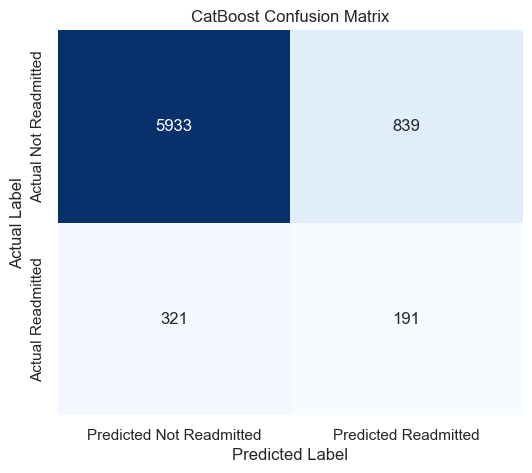

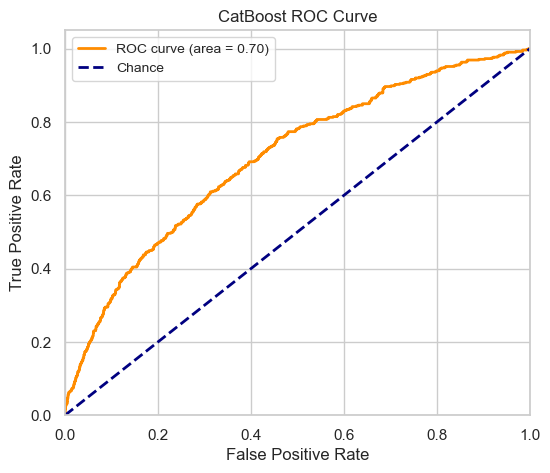

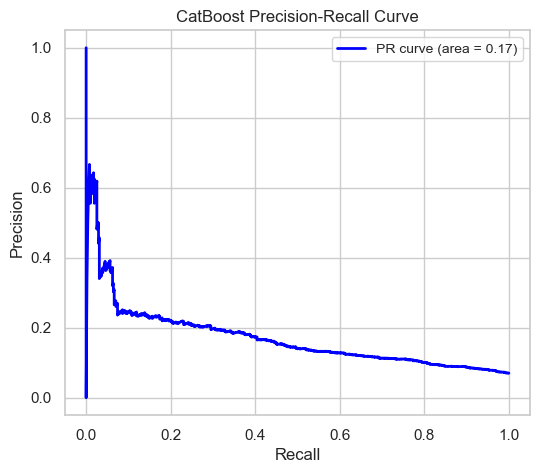


--- CatBoost Feature Importance ---
                Feature  Importance
0   num_past_admissions    4.818511
1        hematocrit_avg    3.961330
2               bun_avg    3.795571
3              temp_min    3.281634
4           albumin_avg    3.219911
5               dbp_max    3.077421
6            sodium_avg    3.074929
7        creatinine_avg    2.977655
8                   age    2.969321
9         potassium_avg    2.887471
10              crp_avg    2.879644
11              sbp_avg    2.789371
12        magnesium_avg    2.783039
13             spo2_avg    2.744952
14        resp_rate_max    2.559555


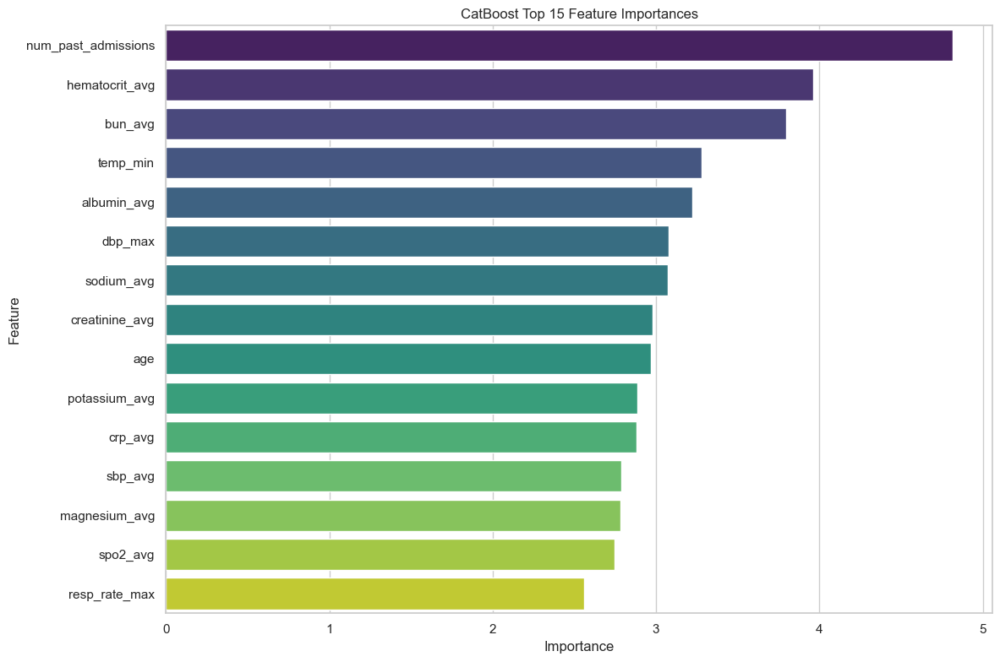

In [178]:
evaluate_model_and_plot_figures(
    model_name="CatBoost",
    best_model=best_cat,
    X_test_final=X_test_reduced,
    y_test=y_test,
    feature_names=red_feature_names
)

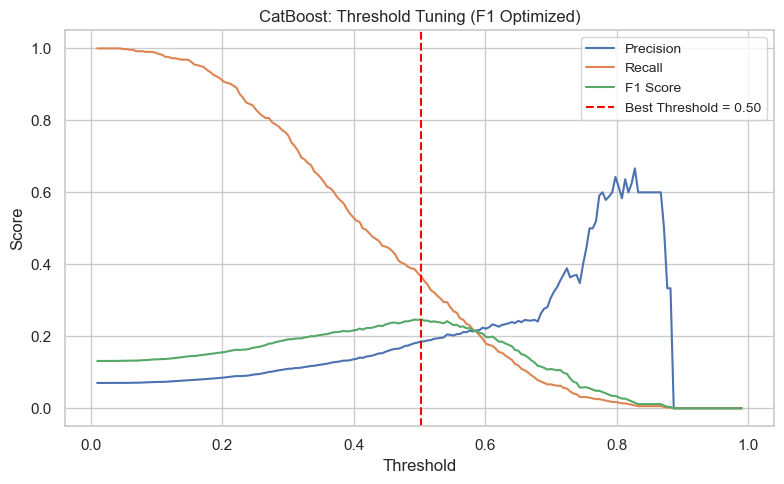

🔍 Best Threshold: 0.502
F1 Score at Best Threshold: 0.247
Precision: 0.186, Recall: 0.367
Brier Score CatBoost: 0.1354

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.88      0.91      6772
           1       0.19      0.37      0.25       512

    accuracy                           0.84      7284
   macro avg       0.57      0.62      0.58      7284
weighted avg       0.89      0.84      0.87      7284



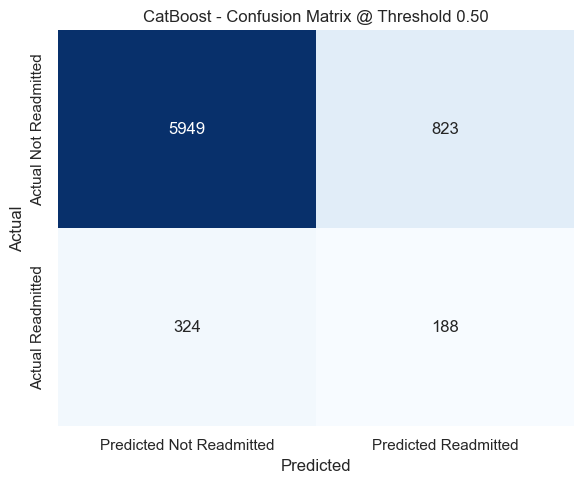

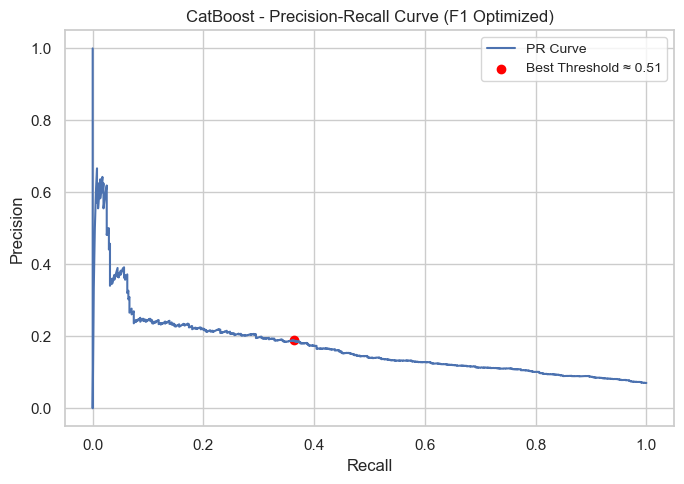

In [179]:
best_thresh = threshold_tuning_plot(
     model = best_cat,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="CatBoost")

\ Generating Learning Curve... This may take a while.


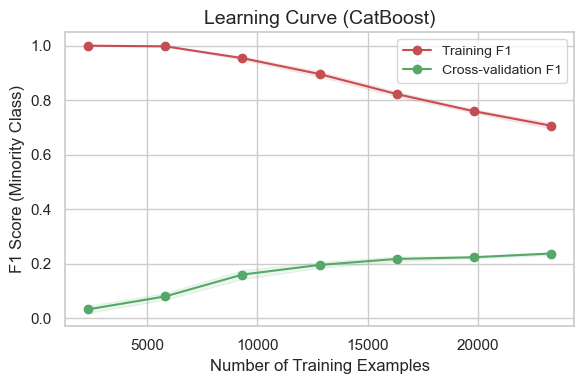


 Learning Curve Complete
Final Training F1: 0.7066 ± 0.0102
Final CV F1 Score: 0.2378 ± 0.0052


In [180]:
plot_learning_curve_f1(
    estimator=best_cat,
    X=X_train_reduced,
    y=y_train,
    model_name="CatBoost"
)

### LightGBM


In [181]:
# 1. Prepare data for Early Stopping
# Split X_train_reduced and y_train into a training set and a small validation set
# This validation set is used *only* for early stopping during hyperparameter search.
X_train_fit, X_val_fit, y_train_fit, y_val_fit = train_test_split(
    X_train_reduced, y_train, test_size=0.20, random_state=36, stratify=y_train
)

In [182]:
print(f"\nTraining data for RandomizedSearchCV fit: {X_train_fit.shape}")
print(f"Validation data for Early Stopping: {X_val_fit.shape}")


Training data for RandomizedSearchCV fit: (23308, 62)
Validation data for Early Stopping: (5827, 62)


In [183]:
# 1. Initialize LightGBM model with the fixed parameters
scale_pos_weight = y_train_fit.value_counts()[0] / y_train_fit.value_counts()[1]  #redefined anyway

lgbm = lgb.LGBMClassifier(
    objective='binary',
    random_state=36,
    n_jobs=-1,
    verbosity=-1,
    scale_pos_weight=scale_pos_weight
)

In [184]:
# 2. Define Parameter Distributions for RandomizedSearchCV
lgbm_param = {
    'n_estimators': randint(1000, 15000),
    'learning_rate': uniform(0.0001, 0.0009),
    'max_depth': randint(5, 10),
    'num_leaves': randint(20, 35),
    'min_child_samples': randint(20, 50),
    'subsample': uniform(0.7, 0.3),
    'colsample_bytree': uniform(0.7, 0.3),
    'reg_alpha': uniform(0, 0.5),
    'reg_lambda': uniform(1, 3)
}

In [185]:
# 3. Initialize and Run RandomizedSearchCV
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=36)
f1_scorer = make_scorer(f1_score, average='binary', pos_label=1)

lgbm_rs = RandomizedSearchCV(
    estimator=lgbm,
    param_distributions=lgbm_param,
    n_iter=100,
    cv=cv,
    scoring=f1_scorer,
    n_jobs=-1,
    verbose=0,
    random_state=36
)

In [186]:
# Record start time
start_time = time.time()

print(f"\nStarting RandomizedSearchCV with {lgbm_rs.n_iter} iterations...")
# 5. Fit the final model with early stopping on the separate validation set
lgbm_rs.fit(
    X_train_fit, y_train_fit,
    eval_set=[(X_val_fit, y_val_fit)],
    eval_metric='auc',
    callbacks=[lgb.early_stopping(stopping_rounds=500, verbose=False)]
)
print("RandomizedSearchCV finished.")

# Calculate elapsed time
elapsed_time = time.time() - start_time

print(f"Total time: {elapsed_time:.1f} seconds ({elapsed_time/60:.1f} minutes)")


Starting RandomizedSearchCV with 100 iterations...
RandomizedSearchCV finished.
Total time: 1174.5 seconds (19.6 minutes)


In [187]:
best_lgbm = lgbm_rs.best_estimator_
print("Best Parameters:", best_lgbm)

Best Parameters: LGBMClassifier(colsample_bytree=0.9185521574787177,
               learning_rate=0.000641452791133192, max_depth=6,
               min_child_samples=46, n_estimators=1986, n_jobs=-1,
               num_leaves=32, objective='binary', random_state=36,
               reg_alpha=0.4036795649350824, reg_lambda=2.0896437895630866,
               scale_pos_weight=13.21219512195122, subsample=0.7559670436867947,
               verbosity=-1)


In [188]:
print(f"\nBest parameters found for LightGBM: {lgbm_rs.best_params_}")
print(f"Best cross-validation F1-score: {lgbm_rs.best_score_:.4f}")


Best parameters found for LightGBM: {'colsample_bytree': 0.9185521574787177, 'learning_rate': 0.000641452791133192, 'max_depth': 6, 'min_child_samples': 46, 'n_estimators': 1986, 'num_leaves': 32, 'reg_alpha': 0.4036795649350824, 'reg_lambda': 2.0896437895630866, 'subsample': 0.7559670436867947}
Best cross-validation F1-score: 0.0000


In [189]:
# Get the optimal number of boosting rounds found by early stopping
best_iteration = best_lgbm.best_iteration_

print("Best Iteration:", best_iteration)

Best Iteration: 70



--- Evaluating LightGBM on Test Set ---

Classification Report:
              precision    recall  f1-score   support

           0       0.93      1.00      0.96      6772
           1       0.00      0.00      0.00       512

    accuracy                           0.93      7284
   macro avg       0.46      0.50      0.48      7284
weighted avg       0.86      0.93      0.90      7284

F1 Score (Class 1): 0.0000
ROC AUC Score: 0.6764
Precision-Recall AUC: 0.1565
Brier Score: 0.0651


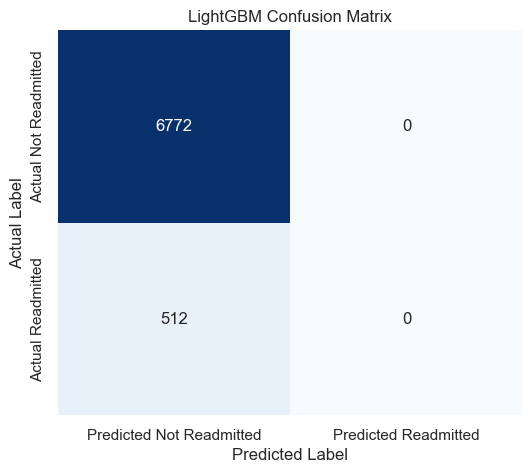

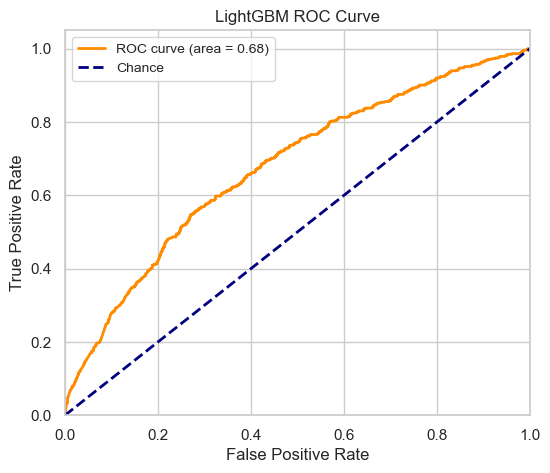

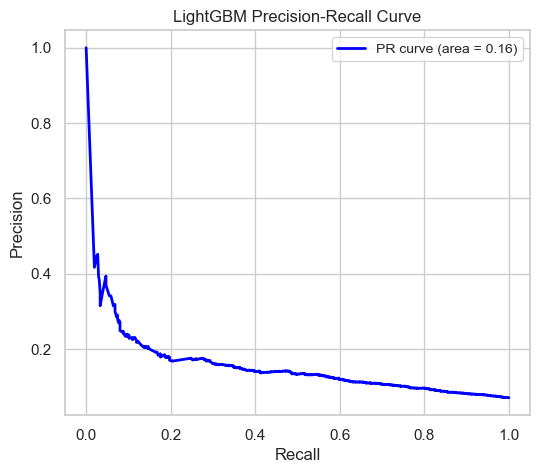


--- LightGBM Feature Importance ---
                     Feature  Importance
0                    bun_avg         233
1             hematocrit_avg         199
2        num_past_admissions         181
3                   temp_min         159
4                glucose_avg          84
5             heart_rate_avg          73
6                calcium_avg          71
7              potassium_avg          70
8             length_of_stay          68
9   admission_type_EMERGENCY          67
10               albumin_avg          65
11             resp_rate_avg          64
12                   dbp_max          63
13                   dbp_avg          62
14                       age          61


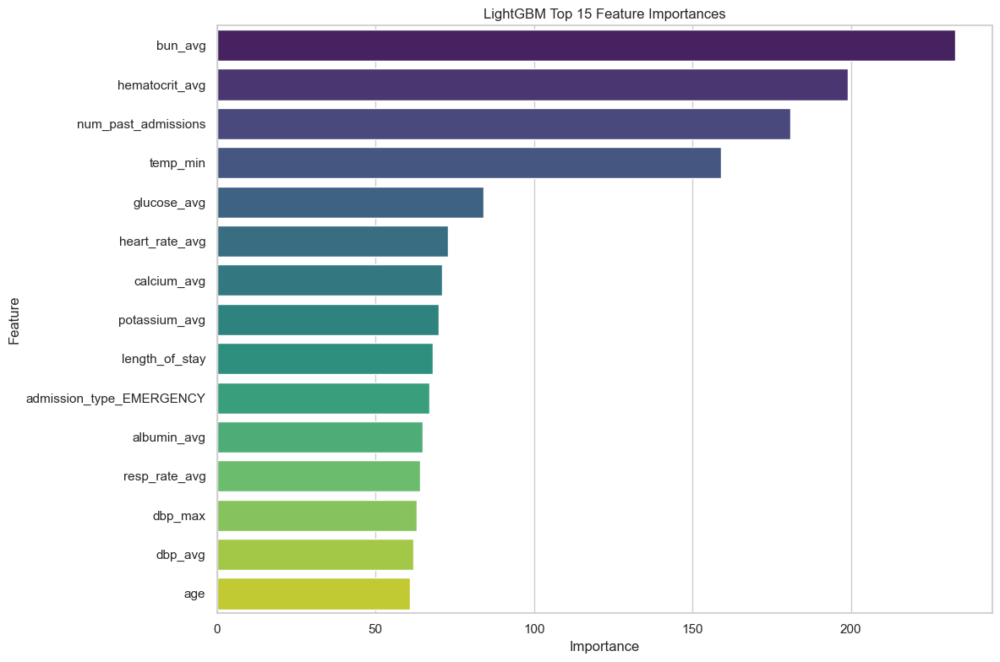

In [190]:
evaluate_model_and_plot_figures(
    model_name="LightGBM",
    best_model=best_lgbm,
    X_test_final=X_test_reduced,
    y_test=y_test,
    feature_names=red_feature_names
)

Interesting, a F1 score of 0 is a critical signal that the model is not making a single positive prediction. This simply means its recall for the minority class is zero. It’s a classic sign of an imbalanced dataset where the model has learned the safest strategy to predict the majority class (in my case, 0) for every single data point. By default, most machine learning classifiers, including LightGBM, use a prediction threshold of 0.5. This means: 1) If predicted_probability > 0.5, the class is 1. 2) If predicted_probability <= 0.5, the class is 0. On a heavily imbalanced dataset, even the model's most confident predictions for the minority class are often well below this 0.5 threshold. As a result, every single prediction gets classified as 0, leading to a recall of 0 and an F1 score of 0. Therefore, instead of relying on the default 0.5 threshold, it is important to find the best lower threshold that works better with the data. 

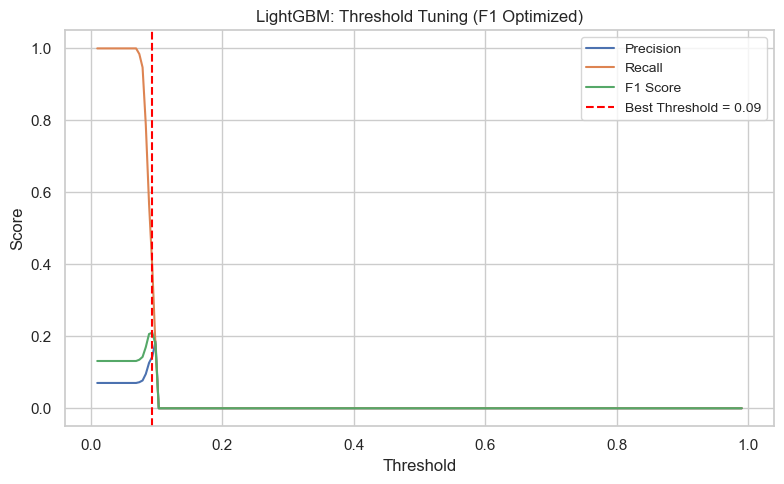

🔍 Best Threshold: 0.094
F1 Score at Best Threshold: 0.210
Precision: 0.143, Recall: 0.393
Brier Score LightGBM: 0.0651

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.82      0.88      6772
           1       0.14      0.39      0.21       512

    accuracy                           0.79      7284
   macro avg       0.55      0.61      0.55      7284
weighted avg       0.89      0.79      0.83      7284



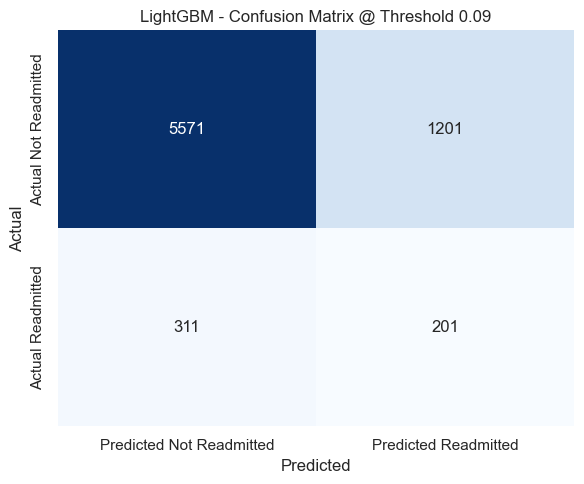

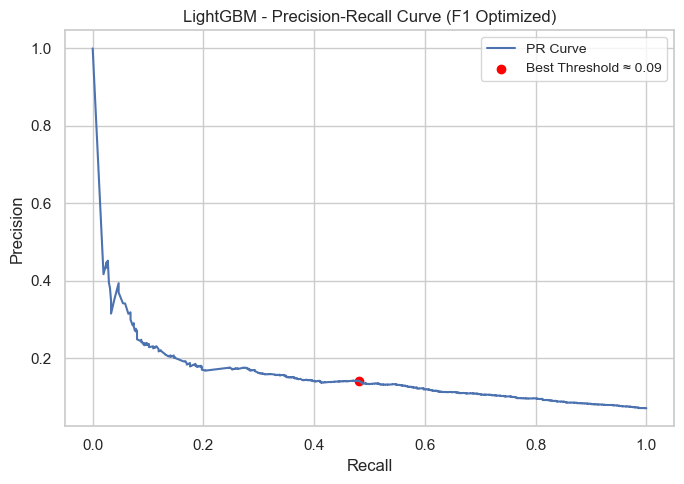

In [191]:
best_thresh = threshold_tuning_plot(
     model = best_lgbm,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="LightGBM")

\ Generating Learning Curve... This may take a while.


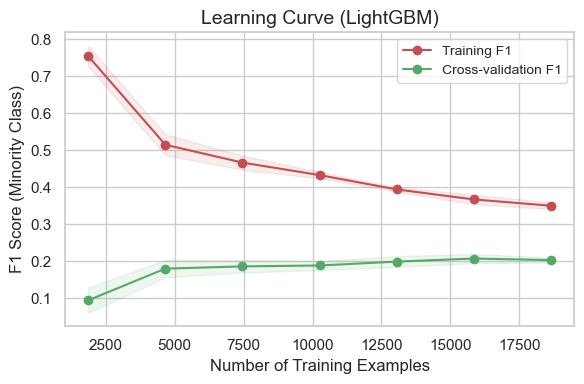


 Learning Curve Complete
Final Training F1: 0.3502 ± 0.0091
Final CV F1 Score: 0.2031 ± 0.0068


In [192]:
plot_learning_curve_f1(
    estimator=best_lgbm,
    X=X_train_fit,
    y=y_train_fit,
    model_name="LightGBM"
)

## Comparing Model Performance

In [193]:
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    recall_score,
    precision_score,
    roc_auc_score,
    brier_score_loss,
)

# --- 1. DEFINE YOUR TEST DATA AND MODELS HERE ---

y_test = y_test
X_test = X_test_reduced

# This dictionary should contain your actual trained models and the best threshold for each.

models_with_thresholds = {
    "Logistic Regression": (best_lr, 0.631),
    "Random Forest": (best_rf, 0.512),
    "XGBoost": (best_rs3, 0.532),
    "XGBoost+SMOTEENN": (random_search2, 0.438),
    "XGBoost+Logit Stacking" : (stacking_classifier, 0.704),
    "LightGBM": (lgbm_rs, 0.094),
    "CatBoost": (best_cat, 0.557)
}


# --- 2. COLLECT RESULTS FOR ALL MODELS ---
model_results = []

for name, (model, threshold) in models_with_thresholds.items():
    # Get the predicted probabilities from your model.
    # The .predict_proba() method returns a list/array of probabilities
    # for each class. You need the probabilities for the positive class (class 1).
    # The [:, 1] slices the array to get only the second column.
    y_proba = model.predict_proba(X_test)[:, 1] 

    # Apply the best threshold to get the binary predictions (0 or 1).
    y_pred = (y_proba > threshold).astype(int)

    # Calculate the performance metrics and append to the list.
    model_results.append({
        "Model": name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "F1 Score": f1_score(y_test, y_pred, pos_label=1, zero_division=0),
        "Recall": recall_score(y_test, y_pred, pos_label=1, zero_division=0),
        "Precision": precision_score(y_test, y_pred, pos_label=1, zero_division=0),
        "ROC AUC": roc_auc_score(y_test, y_proba),
        "Brier Score": brier_score_loss(y_test, y_proba),
        "Optimum Threshold": threshold
    })


# --- 3. CREATE AND DISPLAY THE DATAFRAME ---

# Convert the list of dictionaries into a pandas DataFrame.
comparison_df = pd.DataFrame(model_results)

# Optional: Format the display for better readability.
pd.options.display.float_format = '{:.4f}'.format

# Print the final DataFrame.
print("Comparison of Model Performance:")
print(comparison_df)


Comparison of Model Performance:
                    Model  Accuracy  F1 Score  Recall  Precision  ROC AUC  \
0     Logistic Regression    0.8440    0.2396  0.3496     0.1823   0.6951   
1           Random Forest    0.8639    0.2371  0.3008     0.1957   0.6945   
2                 XGBoost    0.8317    0.2488  0.3965     0.1812   0.6975   
3        XGBoost+SMOTEENN    0.8130    0.2226  0.3809     0.1573   0.6951   
4  XGBoost+Logit Stacking    0.8780    0.2561  0.2988     0.2240   0.7009   
5                LightGBM    0.8060    0.2111  0.3691     0.1478   0.6764   
6                CatBoost    0.8767    0.2312  0.2637     0.2058   0.7013   

   Brier Score  Optimum Threshold  
0       0.2133             0.6310  
1       0.1514             0.5120  
2       0.1514             0.5320  
3       0.1204             0.4380  
4       0.2271             0.7040  
5       0.0651             0.0940  
6       0.1354             0.5570  


## Combined ROC-AUC Curve

In [195]:
from sklearn.metrics import (
    classification_report, roc_auc_score, precision_recall_curve,
    auc, confusion_matrix, roc_curve, make_scorer, f1_score
)


# Create a directory to save the plots if it doesn't exist
output_dir = "model_visualizations"
os.makedirs(output_dir, exist_ok=True)

models = {
    "Logistic Regression": (best_lr),
    "Random Forest": (best_rf),
    "XGBoost": (best_rs3),
    "XGBoost (with SMOTEENN)": (random_search2),
    "XGBoost+Logit Stacking" : (stacking_classifier),
    "LightGBM": (lgbm_rs),
    "CatBoost": (best_cat)
}

# Dictionary to store model probabilities
models_with_probas = {}

print("Generating predictions for each model...")
for model_name, model_object in models.items():
    try:
        # To get probabilities for the positive class
        y_prob = model_object.predict_proba(X_test_reduced)[:, 1]
        models_with_probas[model_name] = y_prob
        print(f"- Predictions generated for '{model_name}'.")
    except Exception as e:
        print(f"Error generating predictions for '{model_name}': {e}")
        # If a model fails, we skip it but continue with others
        continue


def plot_combined_roc_curve(y_test, models_with_probas, filename="combined_roc_curve.png"):
    """
    Plots the ROC curves for multiple models on a single graph.
    """
    if not models_with_probas:
        print("No models were successfully used for prediction. Cannot generate ROC curve plot.")
        return

    # Use a specific style for better visual appeal
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(12, 10))

    # Plot the random chance line
    ax.plot([0, 1], [0, 1], linestyle='--', lw=3, color='gray', label='Random Chance', alpha=.8)

    # Define a color palette for the models
    colors = sns.color_palette('rocket', n_colors=len(models_with_probas))

    # Iterate through each model and plot its ROC curve
    for i, (model_name, y_proba) in enumerate(models_with_probas.items()):
        fpr, tpr, _ = roc_curve(y_test, y_proba)
        roc_auc = roc_auc_score(y_test, y_proba)
        ax.plot(fpr, tpr, color=colors[i], lw=2, label=f'{model_name} (AUC = {roc_auc:.4f})')

    # Add plot aesthetics
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate', fontsize=14)
    ax.set_ylabel('True Positive Rate', fontsize=14)
    ax.set_title('Comparison of ROC Curves for All Models', fontsize=18, fontweight='bold')
    ax.legend(loc="lower right", fontsize=10, frameon=True)

    # Save the plot
    filepath = os.path.join(output_dir, filename)
    fig.savefig(filepath, dpi=300, bbox_inches='tight')
    plt.close(fig)
    print(f"\nSaved plot: {filepath}")

# Running plot generation function
if __name__ == '__main__':
    print("Generating combined ROC curve plot...")
    plot_combined_roc_curve(y_test, models_with_probas)
    print("\nCombined ROC curve plot has been successfully generated and saved to the 'model_visualizations' directory.")

Generating predictions for each model...
- Predictions generated for 'Logistic Regression'.
- Predictions generated for 'Random Forest'.
- Predictions generated for 'XGBoost'.
- Predictions generated for 'XGBoost (with SMOTEENN)'.
- Predictions generated for 'XGBoost+Logit Stacking'.
- Predictions generated for 'LightGBM'.
- Predictions generated for 'CatBoost'.
Generating combined ROC curve plot...

Saved plot: model_visualizations/combined_roc_curve.png

Combined ROC curve plot has been successfully generated and saved to the 'model_visualizations' directory.


## Probablity Curve Calibration

A model is called “calibrated” when the predicted probabilities correspond to the true probability of an event actually occurring. As a specific example, if a model predicts a readmission probability of 70%, then among all patients for which the model predicts a 70% probability, approximately 70% should actually be readmitted. Many models, including many more complex models such as LightGBM, Random Forest, and uncalibrated SVMs, tend to be poorly calibrated. This means they tend to provide probabilities that are too extreme (overconfident) or simply too cautious(conservative). In clinical decision making and in healthcare, probabilities are often used directly for risk stratification. A clinician needs to trust that a "70% risk" truly means a 70% chance. Miscalibrated probabilities can lead to incorrect clinical decisions.

In [196]:
from sklearn.calibration import CalibratedClassifierCV
import sklearn.metrics # Ensure this is imported for explicit calls

print("\n--- Starting Probability Calibration ---")

# Using cross-validation for calibration (recommended if no separate validation set)
# This will split X_train_reduced/y_train into folds, train the base model on some and calibrate on the others.
# 'method='isotonic'' is generally preferred for its flexibility. But isotonic didn't give good result this case so used platt. 

calibrated_model = CalibratedClassifierCV(
    estimator=best_rs3, # Your already trained LightGBM pipeline
    method='sigmoid',  # used sigmoid here, instead of "isotonic". This seems to give better calibration.
    cv=5 # Use cross-validation to calibrate
)

# Fit the calibrator on your training data
# This will retrain the base model within each calibration fold, so it can take time.

print("Fitting Platt CalibratedClassifierCV...")
calibrated_model.fit(X_train_reduced, y_train)

# Get calibrated probabilities for the test set
y_prob_calibrated = calibrated_model.predict_proba(X_test_reduced)[:, 1]

print(f"Sample calibrated probabilities : {y_prob_calibrated[:10]}")

# Evaluate Brier Score for calibrated probabilities
brier_calibrated = sklearn.metrics.brier_score_loss(y_test, y_prob_calibrated)
print(f"Brier Score (Calibrated - Platt): {brier_calibrated:.4f}")


--- Starting Probability Calibration ---
Fitting Platt CalibratedClassifierCV...
Sample calibrated probabilities : [0.03595597 0.02408018 0.0632458  0.04824075 0.05202427 0.04848551
 0.02965885 0.06303343 0.03694464 0.04050021]
Brier Score (Calibrated - Platt): 0.0623


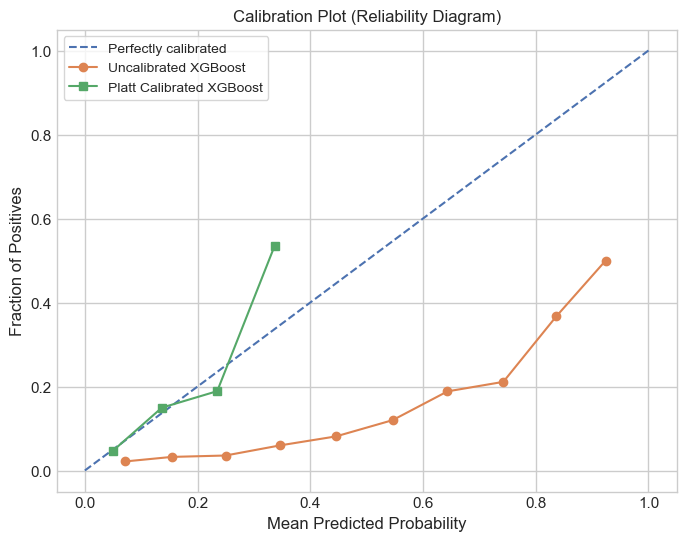

In [197]:
# Plotting Calibration Curve (Reliability Diagram) ---
# This visually shows how well calibrated your probabilities are.
from sklearn.calibration import calibration_curve

fop_calibrated, mpv_calibrated = calibration_curve(y_test, y_prob_calibrated, n_bins=10)
fop_uncalibrated, mpv_uncalibrated = calibration_curve(y_test, best_rs3.predict_proba(X_test_reduced)[:, 1], n_bins=10)

plt.figure(figsize=(8, 6))
plt.plot([0, 1], [0, 1], linestyle='--', label='Perfectly calibrated')
plt.plot(mpv_uncalibrated, fop_uncalibrated, marker='o', label='Uncalibrated XGBoost')
plt.plot(mpv_calibrated, fop_calibrated, marker='s', label='Platt Calibrated XGBoost')
plt.title('Calibration Plot (Reliability Diagram)')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.legend(loc="best", fontsize=10, frameon=True)
plt.grid(True)

# Export
plot_path = os.path.join(output_dir, "calibration_plot_xgboost.png")
plt.savefig(plot_path, dpi=300)
plt.show()
plt.close()

**Analyzing the reliability diagram (calibration curves):** The uncalibrated curve (orange line) shows an initial XGBoost model is not well calibrated. For lower probabilities, the model shows overconfidence. As an example, for a predicted probability of 0.2, the real fraction of positives is closer to 0.05. For higher probabilities, the model shows underconfidence. As an example, for a predicted probability of 0.9, the real fraction of positives is closer to 0.5. Since the curve deviates significantly from the dashed line, the raw probabilities are not really trustworthy.  
Platt calibrated curve (blue line) is the curve after Platt scaling, the calibrated curve is much closer to the dashed line, especially for the first few data points. So the model is now better calibrated. For example when the calibrated model predicts 0.2, the true fraction of positives is also close to 0.2. However in an extremely imbalanced dataset the positive class is very rare. This means even a “confident” prediction for the rare class is still very likely to be wrong. The calibrator sees that even the highest predicted probabilities from the uncalibrated model (the orange dots on the far right) only correspond to a true positive rate of about 0.5. Since the calibrated probabilities should reflect the true fraction of positives, the calibrator will scale down all the raw predictions. It learns that it should never predict a very high probability, because that would be a huge overestimation of the event’s true likelihood.

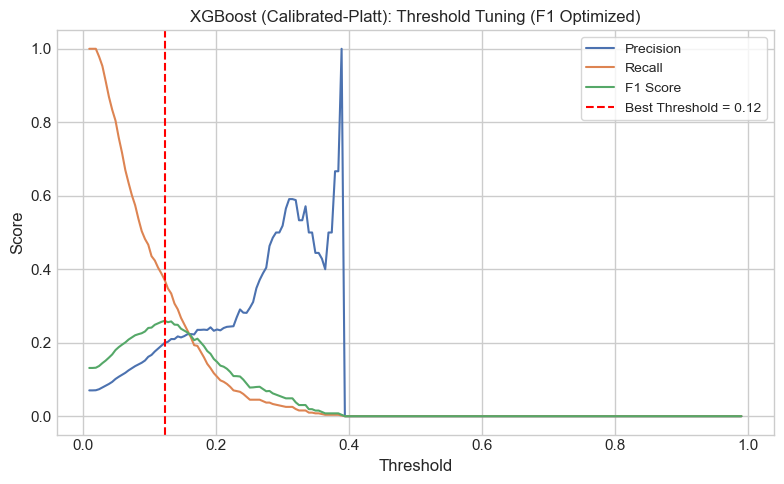

🔍 Best Threshold: 0.123
F1 Score at Best Threshold: 0.260
Precision: 0.200, Recall: 0.371
Brier Score XGBoost (Calibrated-Platt): 0.0623

 Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.89      0.92      6772
           1       0.20      0.37      0.26       512

    accuracy                           0.85      7284
   macro avg       0.57      0.63      0.59      7284
weighted avg       0.90      0.85      0.87      7284



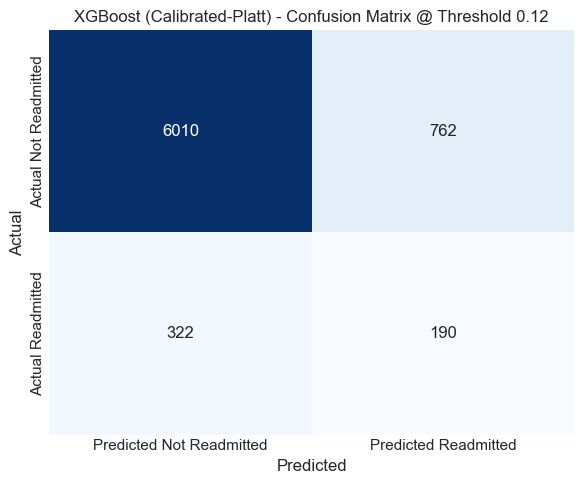

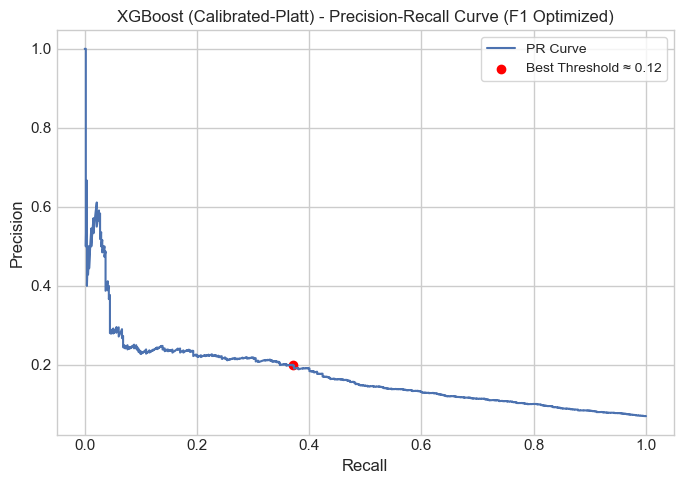

In [198]:
best_thresh_cal = threshold_tuning_plot(
     model = calibrated_model,
     X_test_final=X_test_reduced,
     y_test=y_test,
     model_name="XGBoost (Calibrated-Platt)")

In [199]:
best_thresh_cal

0.12326633165829146

## SHAP with Calibrated XGBoost

In [200]:
# 1. Extract the underlying XGBoost model

xgb_model = calibrated_model.estimator

# If pipeline, use following
# xgb_model = calibrated_model_isotonic.estimator.named_steps['xgb']

In [201]:
# 2. Prepare SHAP Explainer

import shap

# Use TreeExplainer for XGBoost
explainer = shap.TreeExplainer(xgb_model)

# Calculate SHAP values on test data or a sample from training
# Make sure to use the same data used during training (scaled/imputed if in pipeline)
shap_values = explainer.shap_values(X_test)

### SHAP Summary Plot

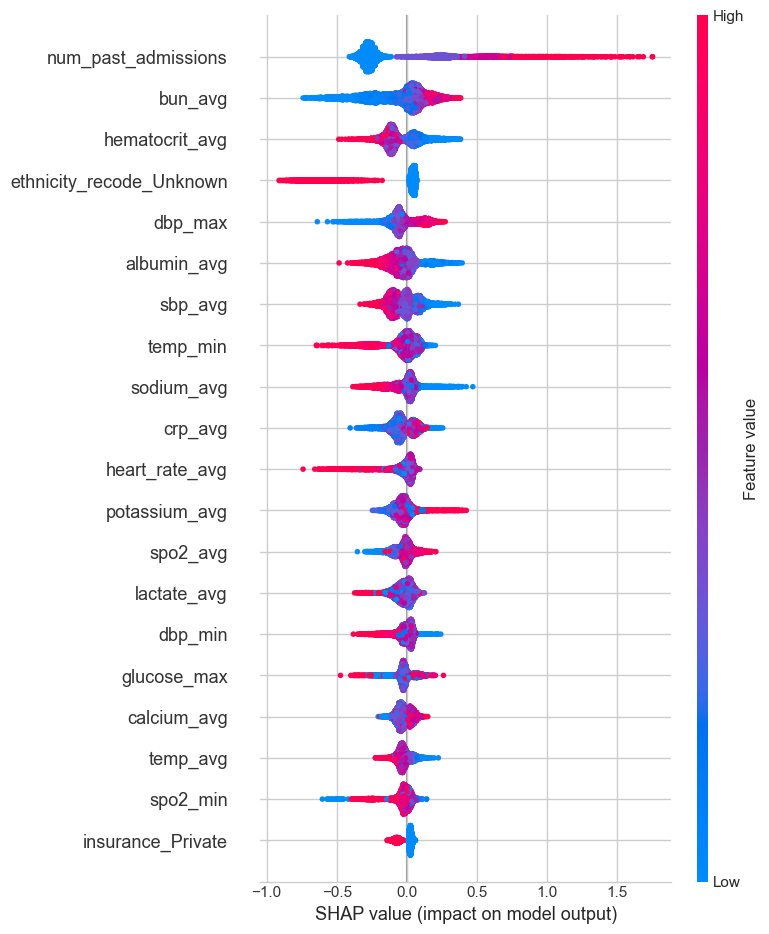

In [202]:
# 3. Visualize SHAP Results using beeswarm plot

# Summary plot (feature importance)
shap.summary_plot(shap_values, X_test)


In [203]:
# Save summary plot
plt.figure()
shap.summary_plot(shap_values, X_test, show=False)
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "shap_summary_plot.png"), dpi=300)
plt.close()

### SHAP Most Impactful Features

In [204]:
# Convert to DataFrame if not already
shap_values_array = np.abs(shap_values.values) if hasattr(shap_values, "values") else np.abs(shap_values)
mean_abs_shap = np.mean(shap_values_array, axis=0)

# Create a DataFrame for plotting
shap_df = pd.DataFrame({
    'Feature': X_test.columns,
    'Mean_ABS_SHAP': mean_abs_shap
}).sort_values(by='Mean_ABS_SHAP', ascending=True)  # ascending for horizontal bar plot

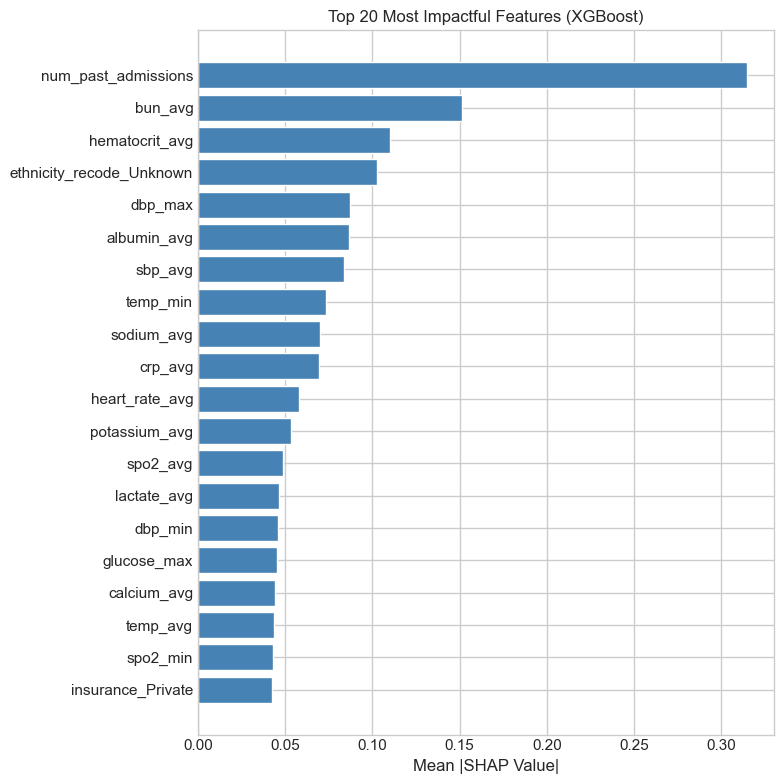

In [206]:
# Plot horizontal bar chart
top_n = 20  # Number of top features to show
top_features = shap_df.tail(top_n)

# Plot
plt.figure(figsize=(8, 8))
plt.barh(top_features['Feature'], top_features['Mean_ABS_SHAP'], color='steelblue')
plt.xlabel("Mean |SHAP Value|")
plt.title(f"Top {top_n} Most Impactful Features (XGBoost)")
plt.tight_layout()

# Export
plot_path = os.path.join(output_dir, "shap_impactful_features_barplot.png")
plt.savefig(plot_path, dpi=300)
plt.show()
plt.close()

### SHAP Force Plot

In [207]:
# Force plot for one instance (optional, e.g., index 0)

# Initialize JS for force plot (for Jupyter)
shap.initjs() 

shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

In [208]:
# Generate the force plot
force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values[0],
    X_test.iloc[0],
    matplotlib=False  # is required for saving as HTML. 
)

# Save the plot as HTML
output_path = os.path.join(output_dir, "shap_force_plot_0.html")
shap.save_html(output_path, force_plot)

print(f"Force plot saved to: {output_path}")

Force plot saved to: model_visualizations/shap_force_plot_0.html


In [209]:
# 1. Find the index of the first instance belonging to the minority class (class 1)
# This returns the original pandas index label, e.g., 145, 234, etc.
minority_class_index = y_test[y_test == 1].index[2]  #index 2 gave me better fig.

# 2. Find the integer position (0, 1, 2, ...) of that label in the X_test index
# This is the key step to avoid the error.
positional_index = X_test.index.get_loc(minority_class_index)

# 3. Get the feature values for the selected instance
# This works correctly with the label.
instance_features = X_test.loc[minority_class_index]

# Check the structure of shap_values and explainer.expected_value
# If shap_values is a single array (not a list of arrays for each class)
# and explainer.expected_value is a single value:
positive_instance_shap = shap_values[positional_index]
base_value = explainer.expected_value

# If you're sure there are multiple classes but they're structured differently:
# Try accessing without indexing first to check the structure
# positive_instance_shap = shap_values[positional_index]  # If shap_values is already class-specific
# base_value = explainer.expected_value  # If expected_value is already class-specific

# 4. Plot the force plot
shap.force_plot(base_value, positive_instance_shap, instance_features)

In [210]:
# Generate the SHAP force plot
force_plot1 = shap.force_plot(
        base_value,
        positive_instance_shap,
        instance_features,
        matplotlib=False
)

# Save the plot as HTML
output_path = os.path.join(output_dir, "shap_force_plot1.html")
shap.save_html(output_path, force_plot1)

print(f"Force plot saved to: {output_path}")

Force plot saved to: model_visualizations/shap_force_plot1.html


## Risk Stratification

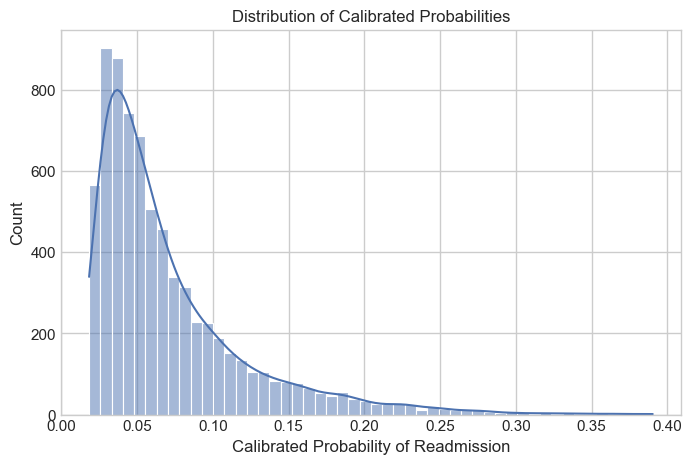

Percentiles of Calibrated Probabilities:
[0.02717722 0.03630367 0.05407712 0.08712001 0.13970563 0.18007614
 0.25679259]


In [212]:
# After fitting calibrated_model_isotonic
y_prob_calibrated = calibrated_model.predict_proba(X_test_reduced)[:, 1]

plt.figure(figsize=(8, 5))
sns.histplot(y_prob_calibrated, bins=50, kde=True)
plt.title('Distribution of Calibrated Probabilities')
plt.xlabel('Calibrated Probability of Readmission')
plt.ylabel('Count')
plt.show()

# Print some percentiles
print("Percentiles of Calibrated Probabilities:")
print(np.percentile(y_prob_calibrated, [10, 25, 50, 75, 90, 95, 99]))

To perform risk stratification, I used threshold method and the cutoff was the value that gave us the highest F1-score, a metric that balances model precision and recall.

In [213]:
# From the calibration I will apply the optimal threshold to create final risk categories

best_threshold = best_thresh_cal

risk_category = np.where(y_prob_calibrated >= best_threshold, 'High risk', 'Low risk')

In [214]:
X_train_reduced.head()

,num_past_admissions,ethnicity_recode_Unknown,discharge_location_LONG TERM CARE HOSPITAL,icu_stay,discharge_location_REHAB/DISTINCT PART HOSP,admission_type_EMERGENCY,insurance_Private,bun_avg,anticoagulant_flag,cvd_category_Pulmonary Circulation Disease,ethnicity_recode_Black,cvd_category_Congenital Circulatory Anomalies,admission_type_URGENT,cvd_category_Venous/Circulatory Disease,admission_location_EMERGENCY ROOM ADMIT,digoxin_flag,cvd_category_Ischemic Heart Disease,discharge_location_SHORT TERM HOSPITAL,discharge_location_HOME HEALTH CARE,discharge_location_LEFT AGAINST MEDICAL ADVI,discharge_location_HOSPICE-HOME,length_of_stay,hematocrit_avg,albumin_avg,insurance_Medicaid,admission_location_TRANSFER FROM HOSP/EXTRAM,temp_min,discharge_location_SNF,creatinine_avg,antiplatelet_flag,discharge_location_HOME,insurance_Medicare,potassium_avg,sbp_min,dbp_min,dbp_max,sodium_avg,age,crp_avg,spo2_min,beta_blocker_flag,vasopressor_flag,resp_rate_avg,magnesium_max,hemoglobin_avg,admission_location_PHYS REFERRAL/NORMAL DELI,heart_rate_avg,sbp_avg,ethnicity_recode_Hispanic/Latino,temp_avg,glucose_avg,magnesium_avg,temp_max,calcium_avg,glucose_max,dbp_avg,spo2_avg,resp_rate_max,lactate_avg,gender,statin_flag,spo2_max
38070,-0.3176,0.0000,0.0000,0,0.0000,0.0000,0.0000,-0.0447,1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,1.0000,0.0000,0.0000,0.0000,0.0000,-0.6269,-0.1017,0.4929,0.0000,0.0000,0.4486,0.0000,0.0682,1,1.0000,1.0000,-0.2246,0.9172,0.0756,-0.3991,-0.1489,1.0506,0.0483,0.0808,1,0,-0.0303,0.0199,-0.2897,1.0000,-0.6178,1.0848,0.0000,0.2477,-0.8267,-0.3272,-0.0096,-0.6874,-0.8733,-0.0723,0.1936,-0.4003,-1.0385,1,1,0.4189
14773,-0.3176,0.0000,0.0000,1,0.0000,0.0000,0.0000,-0.1230,0,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.3051,0.1784,0.6905,0.0000,0.0000,0.1805,1.0000,-0.1428,0,0.0000,1.0000,-0.0068,0.3288,0.4948,-0.5192,-0.0151,0.2643,-0.0413,-0.1820,0,0,-0.2578,-0.0836,0.3283,1.0000,0.1899,0.2828,0.0000,0.3075,0.4004,0.3777,-0.5411,0.0389,0.0113,-0.2441,-1.1502,-0.6086,0.1447,1,0,0.4189
5100,0.2675,0.0000,0.0000,1,0.0000,1.0000,0.0000,0.0004,1,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0,0.0000,0.0000,0.0000,0.0000,0.0000,-0.3051,-0.0292,0.3348,0.0000,0.0000,-0.2731,1.0000,0.0911,1,0.0000,1.0000,-0.2714,-0.1541,0.2752,-1.3117,-2.9906,-0.0727,-0.3075,0.6326,0,0,-0.9239,-0.6264,0.9491,0.0000,-0.9230,-0.5420,0.0000,-0.5437,-0.3328,-1.7378,-0.7812,0.1555,0.3221,-0.7388,0.4022,-0.9904,0.1467,0,0,0.4189
40205,-0.3176,0.0000,0.0000,1,0.0000,0.0000,0.0000,0.0054,1,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0,1.0000,0.0000,1.0000,0.0000,0.0000,-0.3051,-0.3098,0.4533,0.0000,0.0000,0.2630,0.0000,-0.3111,1,0.0000,1.0000,-0.5365,-0.6821,0.2952,-1.0355,0.3025,0.7136,-0.0505,0.3961,1,1,-0.5255,-0.1094,-0.3413,1.0000,-0.6983,-1.4811,0.0000,-0.4229,0.6961,0.5677,-0.8669,-0.3059,0.9198,-0.5433,0.4012,-0.2267,1.4011,1,1,0.0546
27002,-0.3176,0.0000,0.0000,1,0.0000,1.0000,1.0000,1.5771,1,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0,0.0000,0.0000,0.0000,0.0000,0.0000,1.0627,-1.5072,-1.0222,0.0000,0.0000,-0.9743,0.0000,3.2788,1,1.0000,0.0000,-0.7089,1.8074,-1.4017,1.0658,-0.5151,0.3204,0.9588,-1.9687,1,1,-0.3747,0.4076,1.7751,0.0000,0.0165,2.3751,1.0000,-0.0335,0.3330,0.1564,1.7050,-0.9523,0.5612,-0.1376,0.2623,0.7452,-1.0734,1,0,0.4189


In [215]:
# I'll use the 'risk_category' array and add it as a new column.

km_data = survival_data_test.copy()  #survival data I created earlier. 

km_data['risk_group'] = risk_category

In [216]:
km_data['risk_group'].isna().sum()

0

In [217]:
km_data.head()

,age,gender,insurance,admission_type,admission_day_of_week,admission_location,discharge_location,length_of_stay,icu_stay,num_past_admissions,sbp_min,sbp_avg,dbp_min,dbp_max,dbp_avg,heart_rate_avg,resp_rate_min,resp_rate_max,resp_rate_avg,spo2_min,spo2_max,spo2_avg,temp_min,temp_max,temp_avg,bnp_avg,creatinine_avg,bun_avg,hemoglobin_avg,hematocrit_avg,potassium_avg,sodium_avg,magnesium_max,magnesium_avg,calcium_avg,glucose_max,glucose_avg,albumin_avg,crp_avg,lactate_avg,ace_arb_flag,beta_blocker_flag,diuretic_med_flag,anticoagulant_flag,antiplatelet_flag,statin_flag,digoxin_flag,ventilation_flag,vasopressor_flag,diuretic_admin_flag,dialysis_flag,cvd_category,event_occurred,time_to_event,ethnicity_recode,risk_group
33879,59,1,Medicare,EMERGENCY,5,CLINIC REFERRAL/PREMATURE,HOME,4,1,0,104.0000,134.9200,47.0000,94.0000,63.7600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,96.6000,98.2000,97.3429,NaN,1.7750,38.5714,18.2857,13.1000,20.2857,102.3750,2.3000,2.1125,8.2833,5.1000,4.1125,NaN,3.2667,1.9500,0,1,1,1,1,1,0,0,0,0,0,Hypertensive Disease,False,30,White,Low risk
20863,78,0,Medicare,ELECTIVE,2,PHYS REFERRAL/NORMAL DELI,SNF,4,1,0,NaN,NaN,NaN,NaN,NaN,77.2963,8.0000,26.0000,16.4074,92.0000,100.0000,97.2800,NaN,NaN,NaN,NaN,0.9000,15.3333,12.0000,10.4667,30.0000,99.3333,2.1000,1.8800,NaN,4.9000,4.2333,NaN,4.7000,1.5000,1,1,1,0,1,0,0,0,0,0,0,Ischemic Heart Disease,False,30,Unknown,Low risk
7229,79,0,Medicare,EMERGENCY,1,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,3,1,0,NaN,NaN,NaN,NaN,NaN,80.8125,18.0000,28.0000,20.6875,91.0000,98.0000,95.9375,NaN,NaN,NaN,NaN,0.9500,11.0000,12.0000,12.1333,28.5000,103.0000,1.9000,1.9000,8.8500,4.1000,4.1000,3.9000,3.4500,NaN,0,1,0,0,0,0,0,0,0,0,0,Cerebrovascular Disease,False,30,Black,Low risk
7928,58,0,Private,EMERGENCY,6,EMERGENCY ROOM ADMIT,HOME HEALTH CARE,13,1,0,NaN,NaN,NaN,NaN,NaN,93.5789,21.0000,31.0000,26.9474,98.0000,100.0000,98.9474,NaN,NaN,NaN,226.6364,0.6600,15.9333,13.4667,9.3923,22.3750,103.0000,2.4000,1.8875,7.9133,5.6000,3.8647,2.3200,3.0533,1.3000,0,0,0,1,0,0,0,0,0,0,0,Venous/Circulatory Disease,False,30,White,Low risk
41602,68,1,Medicare,ELECTIVE,4,PHYS REFERRAL/NORMAL DELI,HOME HEALTH CARE,5,1,0,87.0000,107.2000,49.0000,86.0000,72.8000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.9500,22.0000,12.0000,12.6400,24.0000,109.1667,2.2000,2.0500,8.7000,4.9000,4.3167,NaN,2.9000,1.5000,1,1,1,1,1,1,0,0,1,1,0,Ischemic Heart Disease,False,30,White,Low risk


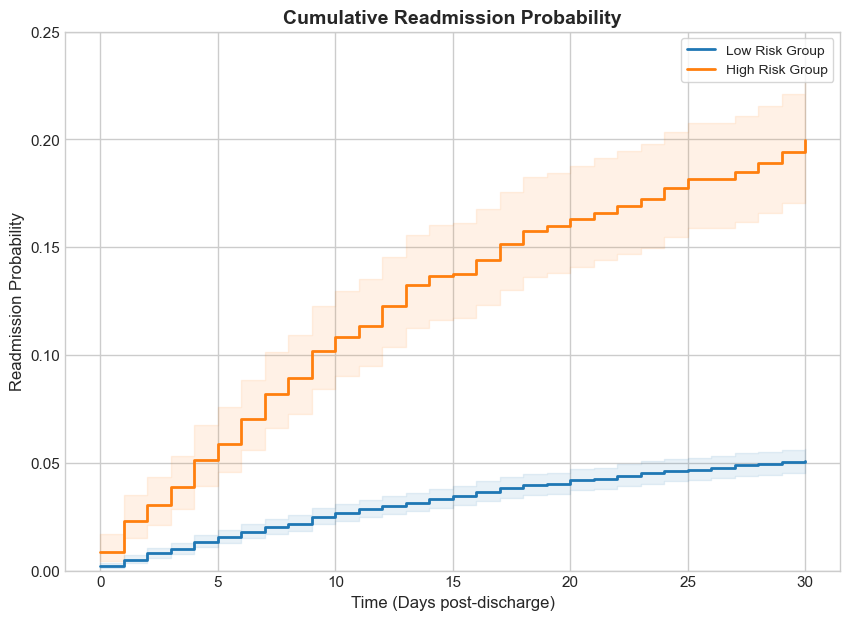

In [218]:
from lifelines import KaplanMeierFitter
from cycler import cycler

# Set a professional plotting style and custom colors
plt.style.use('seaborn-v0_8-whitegrid')
plt.rc('axes', prop_cycle=(cycler('color', ['#1f77b4', '#ff7f0e'])))

# Initialize the KaplanMeierFitter
kmf = KaplanMeierFitter()

fig, ax = plt.subplots(figsize=(10, 7))

# Plot for the 'Low risk' group
low_risk_data = km_data[km_data['risk_group'] == 'Low risk']
kmf.fit(low_risk_data['time_to_event'], event_observed=low_risk_data['event_occurred'], label='Low Risk Group')
# Changed from plot_cumulative_incidence to plot_cumulative_density
kmf.plot_cumulative_density(ax=ax, ci_alpha=0.1, linewidth=2)

# Plot for the 'High risk' group
high_risk_data = km_data[km_data['risk_group'] == 'High risk']
kmf.fit(high_risk_data['time_to_event'], event_observed=high_risk_data['event_occurred'], label='High Risk Group')
# Changed from plot_cumulative_incidence to plot_cumulative_density
kmf.plot_cumulative_density(ax=ax, ci_alpha=0.1, linewidth=2)

plt.title('Cumulative Readmission Probability', fontsize=14, fontweight='bold')
plt.xlabel('Time (Days post-discharge)', fontsize=12)
plt.ylabel('Readmission Probability', fontsize=12)
plt.legend(loc="best", fontsize=10, frameon=True)
plt.grid(True)
plt.ylim(0, 0.25)

# Saves the figure to a file named 'readmission_probability_plot.png'
# ensures that no labels are cut off.
plt.savefig('model_visualizations/readmission_probability_plot.png', dpi=300, bbox_inches='tight')

plt.show()

In [219]:
# Print readmission probablities at specific time points 
# I am chosing day 7, 14, and 30

# Refit KMF for each group to ensure correct data
kmf_low = KaplanMeierFitter()
kmf_low.fit(low_risk_data['time_to_event'], event_observed=low_risk_data['event_occurred'])

kmf_high = KaplanMeierFitter()
kmf_high.fit(high_risk_data['time_to_event'], event_observed=high_risk_data['event_occurred'])

print("\n" + "="*80)
print("Readmission Probabilities at Specific Time Points:")
print("="*80 + "\n")

time_points = [7, 14, 30]

for day in time_points:
    # Check if the time point exists in the index before trying to access it
    # Extract the first value from the Series using .iloc[0] and then format it
    low_risk_incidence = kmf_low.cumulative_density_.loc[kmf_low.cumulative_density_.index.values >= day].iloc[0].iloc[0]
    high_risk_incidence = kmf_high.cumulative_density_.loc[kmf_high.cumulative_density_.index.values >= day].iloc[0].iloc[0]

    print(f"Day {day}:")
    print(f"  - Low Risk Group: {low_risk_incidence:.4f}")
    print(f"  - High Risk Group: {high_risk_incidence:.4f}\n")

plt.show()


Readmission Probabilities at Specific Time Points:

Day 7:
  - Low Risk Group: 0.0201
  - High Risk Group: 0.0819

Day 14:
  - Low Risk Group: 0.0332
  - High Risk Group: 0.1366

Day 30:
  - Low Risk Group: 0.0509
  - High Risk Group: 0.1996



In [221]:
# Export top 100 rows of original df for github.

df0_top100 = df0.head(100)

df0_top100.to_csv('original_df_top100_rows.csv', index=False)

In [220]:
from print_versions import print_versions

print_versions(globals())

pandas==2.2.2
json==2.0.9
numpy==1.26.4
seaborn==0.13.2
matplotlib==3.9.2
statsmodels==0.14.2
xgboost==3.0.2
catboost==1.2.8
sklearn==1.5.1
lightgbm==4.6.0
scipy==1.13.1
shap==0.47.2
lifelines==0.30.0
cycler==0.11.0
